## Overview

<pre>
Serious complication for loan providers(Banking) is to find out the Loan applicants who are very likely to repay the loan.If the loan provider predicted the faithful customer, they will gain more profit and  more imporatanly they will avoid losses.
In kaggle, Home Credit Default Risk is currently using various statistical and machine learning methods to make these predictions, they're challenging. Kagglers to help them unlock the full potential of their data. Doing so will ensure that clients capable of repayment are not rejected and that loans are given with a principal, maturity, and repayment calendar that will empower their clients to be successful.

Here we have two classes in the target label, we will conclude this problem as a <strong> Binary classification </strong> problem.

<strong>Problem Statement</strong>
We need to Build the model,which will say by giving the customer information whether this applicant will repay a loan or not
 
<strong>Data Description</strong>
They are 7 different source of table for this problem, combining all the tables is 221 features.
two main tables are <strong>application_train.csv</strong> and <strong>application_test.csv</strong>, which contain the current applications of the clients who have applied for loan. All the other tables are referenced with this table using the unique ID, i.e. SK_ID_CURR.
For more information, visit - https://www.kaggle.com/c/home-credit-default-risk/data

</pre>

In [19]:
# Import all required package for this problem
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from plotly.offline import iplot
from matplotlib.pyplot import figure
import warnings
warnings.filterwarnings('ignore') 
from sklearn.preprocessing import MinMaxScaler, OrdinalEncoder, LabelEncoder,OneHotEncoder
from sklearn.impute import SimpleImputer as Imputer
from tqdm import tqdm


### Exploratory Data Analysis

Exploratory Data Analysis refers to the critical process of performing initial investigations on data

#### Load Data from given CSV

In [20]:
# Select the directory 
os.chdir(r'C:\Users\User\Desktop\Applied_A\Assignment_All_in_one\Casestudy')

In [21]:
# Reading the dataframe
df = pd.read_csv('application_train.csv')
df.head(2)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [4]:
# information about dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


<pre>
In Dataset consist of 307511 rows and 122 entries 
Output Column - TARGET (0 or 1) -  Binary Classification problem
Target 0 - Applicant repaied the credit amount
Target 1 - Applicant was not repaied the credit amount

In this problem, we have total 7 tables 


</pre>
    

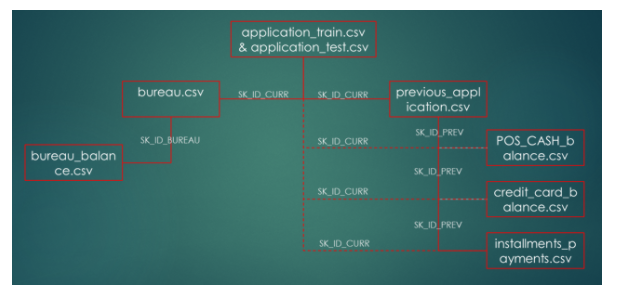

In [50]:
df_test = pd.read_csv('application_test.csv')
print(df_test.info())
df_test.head(2)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48744 entries, 0 to 48743
Columns: 121 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(40), object(16)
memory usage: 45.0+ MB
None


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0


In [6]:
print("The train dataset dimensions are as follows: {}".format(df.shape))
print("The test dataset dimensions are as follows: {}".format(df_test.shape))

The train dataset dimensions are as follows: (307511, 122)
The test dataset dimensions are as follows: (48744, 121)


In [7]:
df.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY',
       ...
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object', length=122)

In [6]:
'''
Ensuring application train and test dataset having same columns.
'''
for i in df.columns:
    result = True
    test_col = df_test.columns
    if i  not in test_col:
        if i != 'TARGET':
            result = False
            break
print('Both train and test have same column name- '+str(result)) 

Both train and test have same column name- True


<pre>
As expected, test dataset contains all the columns except the target label
</pre>

In [5]:
'''
All client’s previous credits provided by other financial institutions that were reported to Credit Bureau, 
In this table one applicant may have more than one entries.
'''

df_bureau = pd.read_csv('bureau.csv')
print(df_bureau.info())
df_bureau.head(2)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1716428 entries, 0 to 1716427
Data columns (total 17 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_CURR              int64  
 1   SK_ID_BUREAU            int64  
 2   CREDIT_ACTIVE           object 
 3   CREDIT_CURRENCY         object 
 4   DAYS_CREDIT             int64  
 5   CREDIT_DAY_OVERDUE      int64  
 6   DAYS_CREDIT_ENDDATE     float64
 7   DAYS_ENDDATE_FACT       float64
 8   AMT_CREDIT_MAX_OVERDUE  float64
 9   CNT_CREDIT_PROLONG      int64  
 10  AMT_CREDIT_SUM          float64
 11  AMT_CREDIT_SUM_DEBT     float64
 12  AMT_CREDIT_SUM_LIMIT    float64
 13  AMT_CREDIT_SUM_OVERDUE  float64
 14  CREDIT_TYPE             object 
 15  DAYS_CREDIT_UPDATE      int64  
 16  AMT_ANNUITY             float64
dtypes: float64(8), int64(6), object(3)
memory usage: 222.6+ MB
None


,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN


In [7]:
'''
Monthly balances of previous credits in Credit Bureau.
This table has one row for each month of history of every previous credit reported to Credit Bureau.
'''
df_bureau_bal = pd.read_csv('bureau_balance.csv')
print(df_bureau_bal.info())
df_bureau_bal.head(2)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27299925 entries, 0 to 27299924
Data columns (total 3 columns):
 #   Column          Dtype 
---  ------          ----- 
 0   SK_ID_BUREAU    int64 
 1   MONTHS_BALANCE  int64 
 2   STATUS          object
dtypes: int64(2), object(1)
memory usage: 624.8+ MB
None


,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C


In [9]:
# Minium value is 96, so totally we having last 8 years transaction history of previous credit
df_bureau_bal['MONTHS_BALANCE'].min()


-96

In [10]:
'''
All previous applications for Home Credit loans of clients who have loans in our sample.
'''
df_prev_app = pd.read_csv('previous_application.csv')
print(df_prev_app.info())
df_prev_app.head(2)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 non-nu

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0


In [8]:
'''
Monthly balance snapshots of previous POS (point of sales) and cash loans that the applicant had with Home Credit.
'''
df_pos = pd.read_csv('POS_CASH_balance.csv')
print(df_pos.info())
df_pos.head(2)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10001358 entries, 0 to 10001357
Data columns (total 8 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   SK_ID_PREV             int64  
 1   SK_ID_CURR             int64  
 2   MONTHS_BALANCE         int64  
 3   CNT_INSTALMENT         float64
 4   CNT_INSTALMENT_FUTURE  float64
 5   NAME_CONTRACT_STATUS   object 
 6   SK_DPD                 int64  
 7   SK_DPD_DEF             int64  
dtypes: float64(2), int64(5), object(1)
memory usage: 610.4+ MB
None


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0


In [9]:
'''
Monthly balance snapshots of previous credit cards that the applicant has with Home Credit.
'''
df_credit_bal = pd.read_csv('credit_card_balance.csv')
print(df_credit_bal.info())
df_credit_bal.head(2)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3840312 entries, 0 to 3840311
Data columns (total 23 columns):
 #   Column                      Dtype  
---  ------                      -----  
 0   SK_ID_PREV                  int64  
 1   SK_ID_CURR                  int64  
 2   MONTHS_BALANCE              int64  
 3   AMT_BALANCE                 float64
 4   AMT_CREDIT_LIMIT_ACTUAL     int64  
 5   AMT_DRAWINGS_ATM_CURRENT    float64
 6   AMT_DRAWINGS_CURRENT        float64
 7   AMT_DRAWINGS_OTHER_CURRENT  float64
 8   AMT_DRAWINGS_POS_CURRENT    float64
 9   AMT_INST_MIN_REGULARITY     float64
 10  AMT_PAYMENT_CURRENT         float64
 11  AMT_PAYMENT_TOTAL_CURRENT   float64
 12  AMT_RECEIVABLE_PRINCIPAL    float64
 13  AMT_RECIVABLE               float64
 14  AMT_TOTAL_RECEIVABLE        float64
 15  CNT_DRAWINGS_ATM_CURRENT    float64
 16  CNT_DRAWINGS_CURRENT        int64  
 17  CNT_DRAWINGS_OTHER_CURRENT  float64
 18  CNT_DRAWINGS_POS_CURRENT    float64
 19  CNT_INSTALMENT_MATURE

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,...,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,...,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0


In [10]:
'''
Repayment history for the previously spend credits in Home Credit related to the loans in our sample.
'''
df_inst_pay = pd.read_csv('installments_payments.csv')
print(df_inst_pay.info())
df_inst_pay.head(2)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13605401 entries, 0 to 13605400
Data columns (total 8 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_PREV              int64  
 1   SK_ID_CURR              int64  
 2   NUM_INSTALMENT_VERSION  float64
 3   NUM_INSTALMENT_NUMBER   int64  
 4   DAYS_INSTALMENT         float64
 5   DAYS_ENTRY_PAYMENT      float64
 6   AMT_INSTALMENT          float64
 7   AMT_PAYMENT             float64
dtypes: float64(5), int64(3)
memory usage: 830.4 MB
None


,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525


<pre>

As i mentioned eariler totally we have 8 tables, our main 2 table is application_train.csv and application_test.csv , these tables contains information about applicants who applied loan in Home credit. From the table architecture SK_ID_CURR is refernces ID.

</pre>

### Missing values

<pre>
Missing values in a Dataset will affect model performances, to avoid that need to handle this problem for that we have various method , important method is <strong>Imputer</strong> for that first we need to check missing values deatils in all tables.

</pre>

In [49]:
def missing_value(dataframe = 'df', df_name ='TRAIN', visualizse = True, head_count = 5):
    '''
    dataframe - Pass the dataframe to the find missing value of each row.
    df_name  -  Dataframe name
    Visualizse - Boolean, True- Visalizse or False - skip the visualizse part
    head_count - print top five missing column in descending column.
    '''
    total = dataframe.isnull().sum().sort_values(ascending=False)
    percent = (dataframe.isnull().sum()/dataframe.isnull().count()).sort_values(ascending=False)
    missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
    print(missing_data.head(head_count))
    
    if visualizse:
        # visualizse
        figure(figsize=(50,50), facecolor='w', edgecolor='r')
        '''
        edge color - Border color
        dpi - dots-per-inch
        '''
        if len(missing_data.index) >20 :
            sns.set(font_scale = 3)
            sns.barplot(y= missing_data.index, x= missing_data['Percent'])
        else: 
            sns.set(font_scale = 6)
            sns.barplot(y= missing_data.index, x= missing_data['Percent'])
        plt.tight_layout()
        plt.title(str(df_name))
        plt.show()

                           Total   Percent
COMMONAREA_AVG            214862  0.698722
COMMONAREA_MODE           214862  0.698722
COMMONAREA_MEDI           214862  0.698722
NONLIVINGAPARTMENTS_AVG   213512  0.694332
NONLIVINGAPARTMENTS_MEDI  213512  0.694332


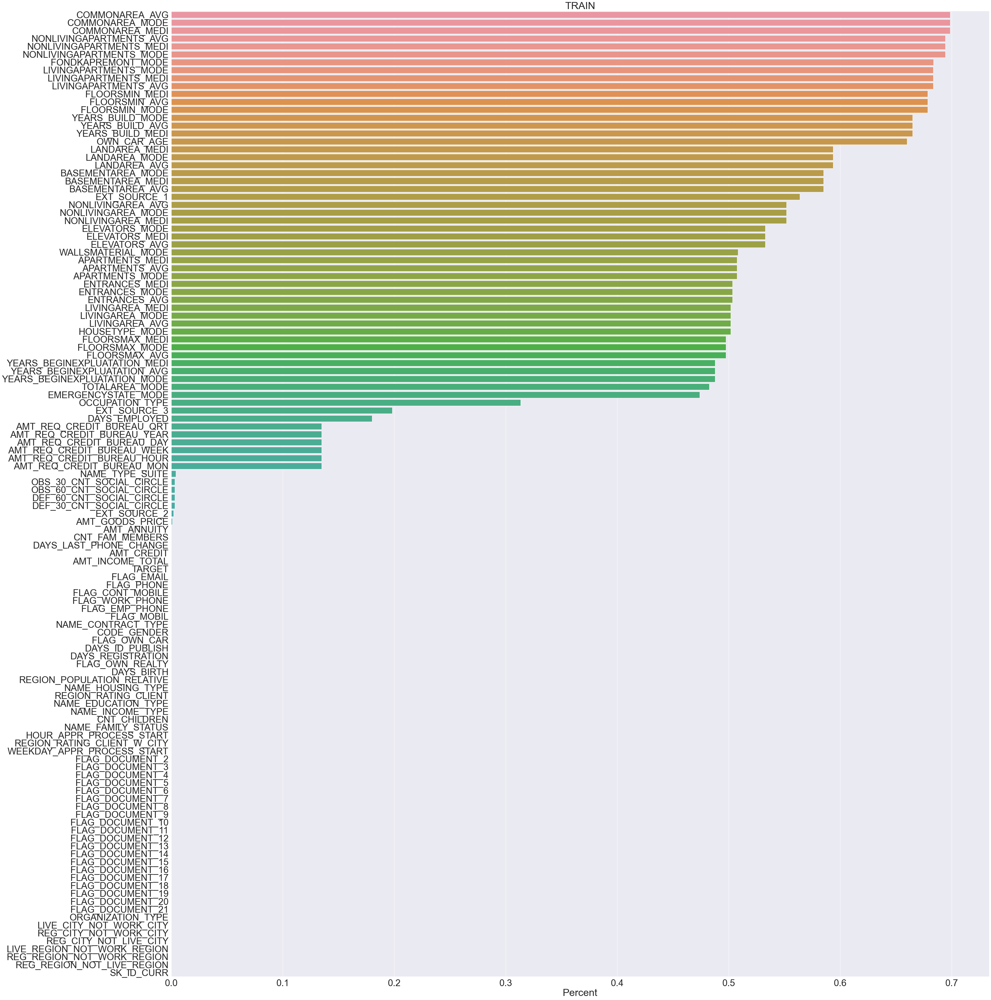

In [84]:
# Application_train.csv
missing_value(df,df_name='TRAIN')


                          Total   Percent
COMMONAREA_MEDI           33495  0.687161
COMMONAREA_AVG            33495  0.687161
COMMONAREA_MODE           33495  0.687161
NONLIVINGAPARTMENTS_MODE  33347  0.684125
NONLIVINGAPARTMENTS_MEDI  33347  0.684125


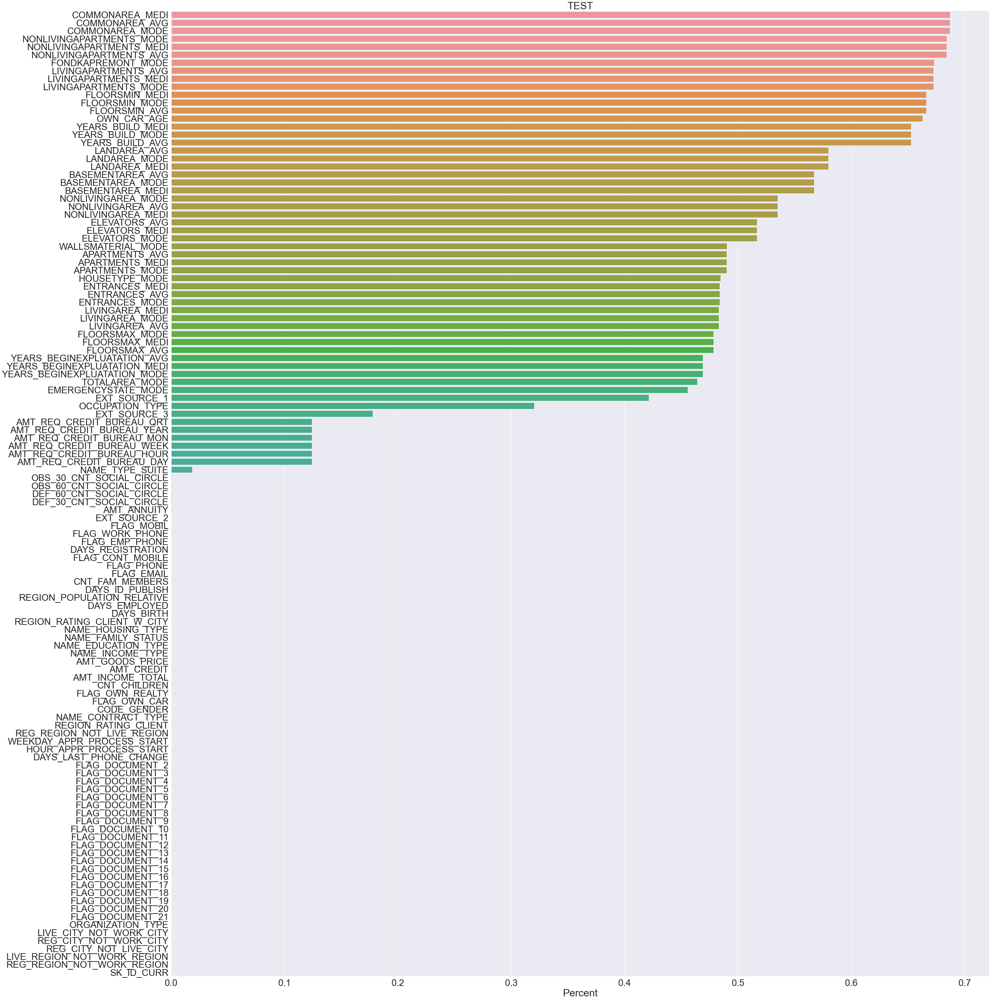

In [51]:
# Application_test.csv
missing_value(df_test,df_name='TEST')

                          Total   Percent
AMT_ANNUITY             1226791  0.714735
AMT_CREDIT_MAX_OVERDUE  1124488  0.655133
DAYS_ENDDATE_FACT        633653  0.369170
AMT_CREDIT_SUM_LIMIT     591780  0.344774
AMT_CREDIT_SUM_DEBT      257669  0.150119


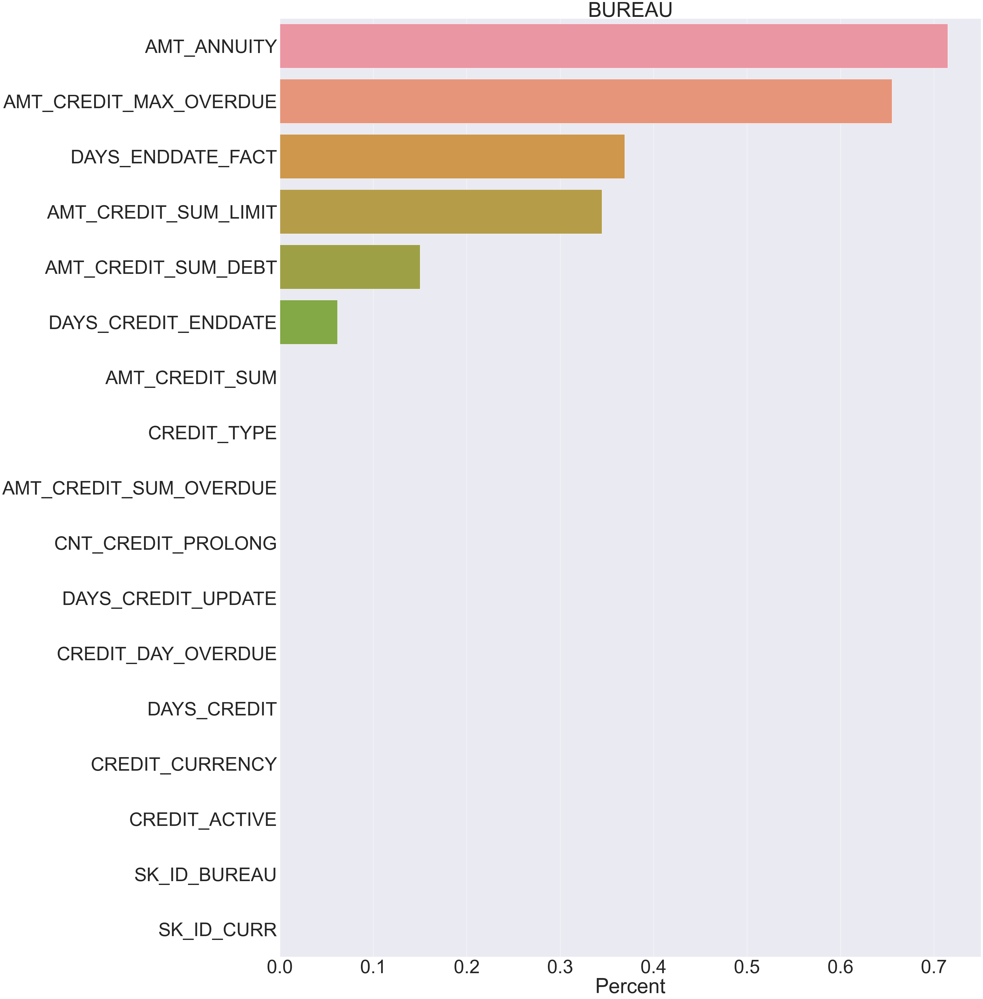

In [574]:
# df_bureau.csv
missing_value(df_bureau,df_name='BUREAU')

                Total  Percent
STATUS              0      0.0
MONTHS_BALANCE      0      0.0
SK_ID_BUREAU        0      0.0


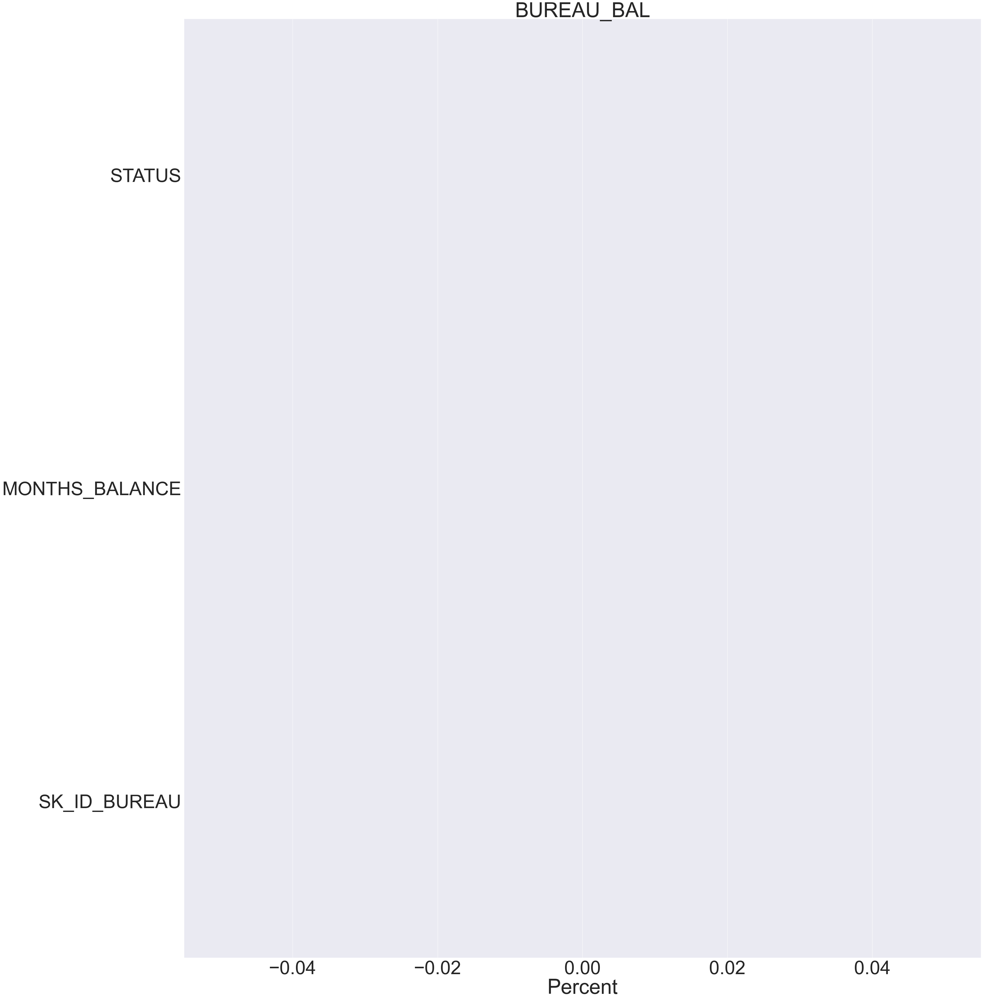

In [575]:
# df_bureau_bal.csv
missing_value(df_bureau_bal,df_name='BUREAU_BAL')

                            Total   Percent
RATE_INTEREST_PRIVILEGED  1664263  0.996437
RATE_INTEREST_PRIMARY     1664263  0.996437
RATE_DOWN_PAYMENT          895844  0.536365
AMT_DOWN_PAYMENT           895844  0.536365
NAME_TYPE_SUITE            820405  0.491198


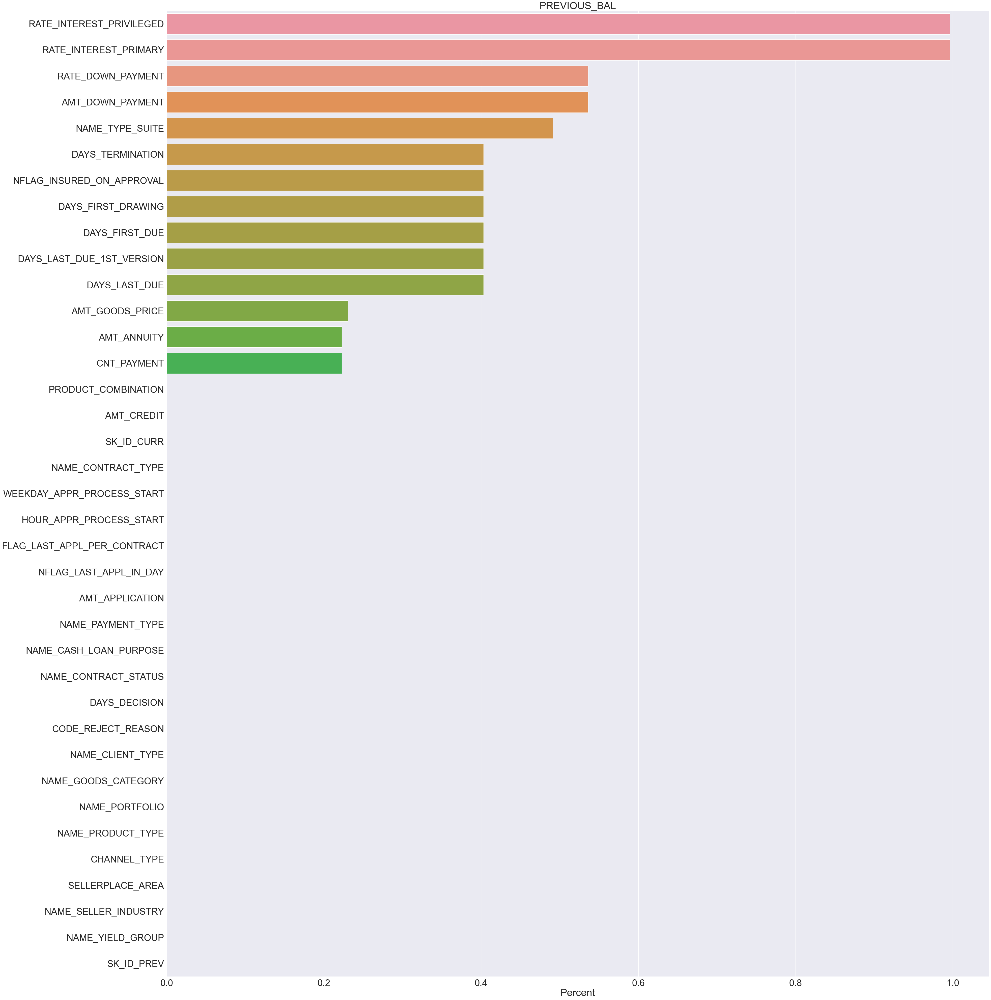

In [576]:
# df_prev_app.csv
missing_value(df_prev_app,df_name='PREVIOUS_BAL')

                       Total   Percent
CNT_INSTALMENT_FUTURE  26087  0.002608
CNT_INSTALMENT         26071  0.002607
SK_DPD_DEF                 0  0.000000
SK_DPD                     0  0.000000
NAME_CONTRACT_STATUS       0  0.000000


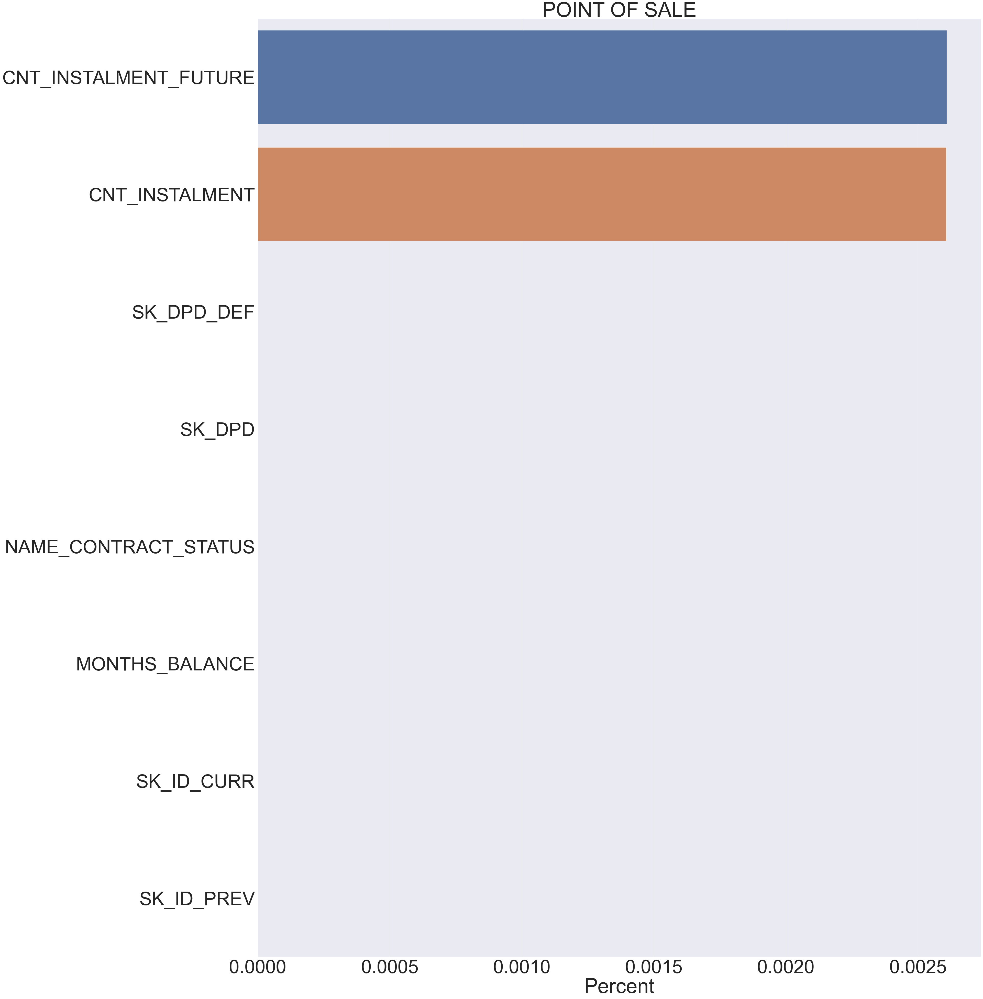

In [577]:
# df_pos.csv
missing_value(df_pos,df_name='POINT OF SALE')

                             Total   Percent
AMT_PAYMENT_CURRENT         767988  0.199981
AMT_DRAWINGS_OTHER_CURRENT  749816  0.195249
CNT_DRAWINGS_POS_CURRENT    749816  0.195249
CNT_DRAWINGS_OTHER_CURRENT  749816  0.195249
CNT_DRAWINGS_ATM_CURRENT    749816  0.195249


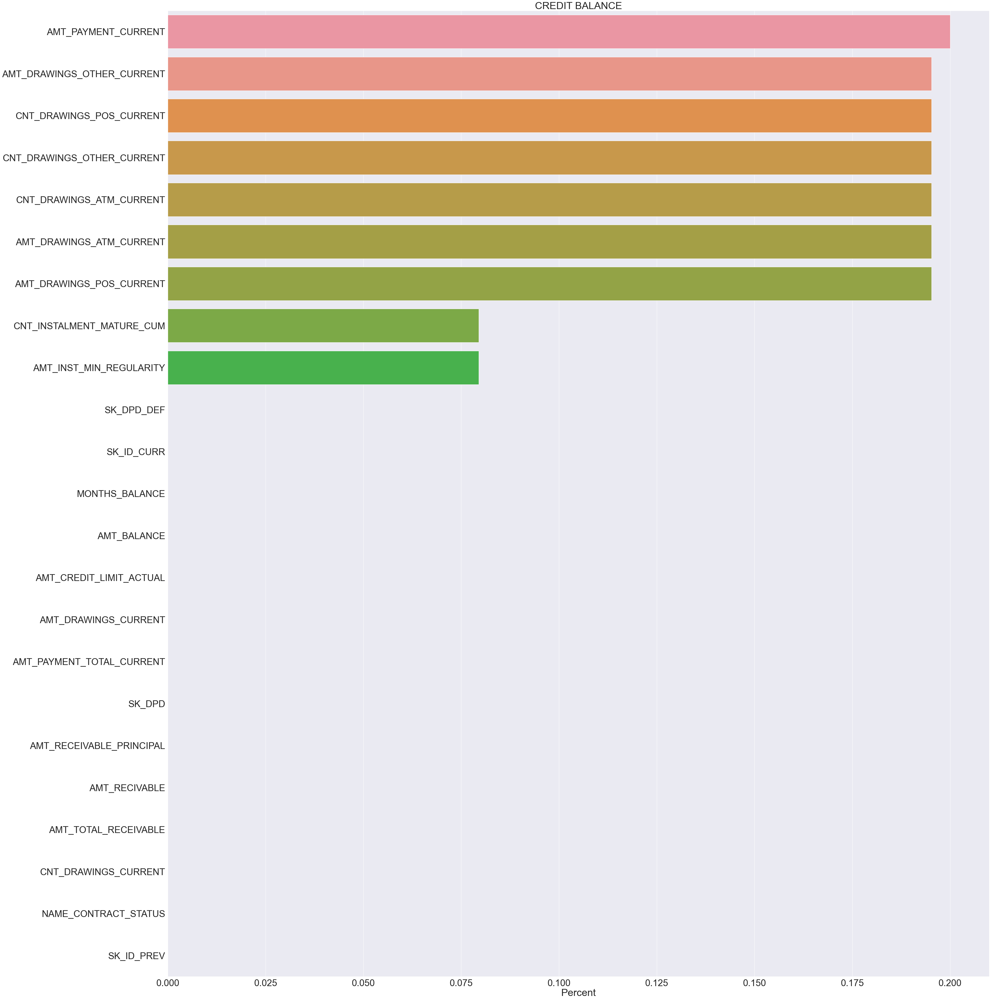

In [578]:
# df_credit_bal.csv
missing_value(df_credit_bal,df_name='CREDIT BALANCE')

                       Total   Percent
AMT_PAYMENT             2905  0.000214
DAYS_ENTRY_PAYMENT      2905  0.000214
AMT_INSTALMENT             0  0.000000
DAYS_INSTALMENT            0  0.000000
NUM_INSTALMENT_NUMBER      0  0.000000


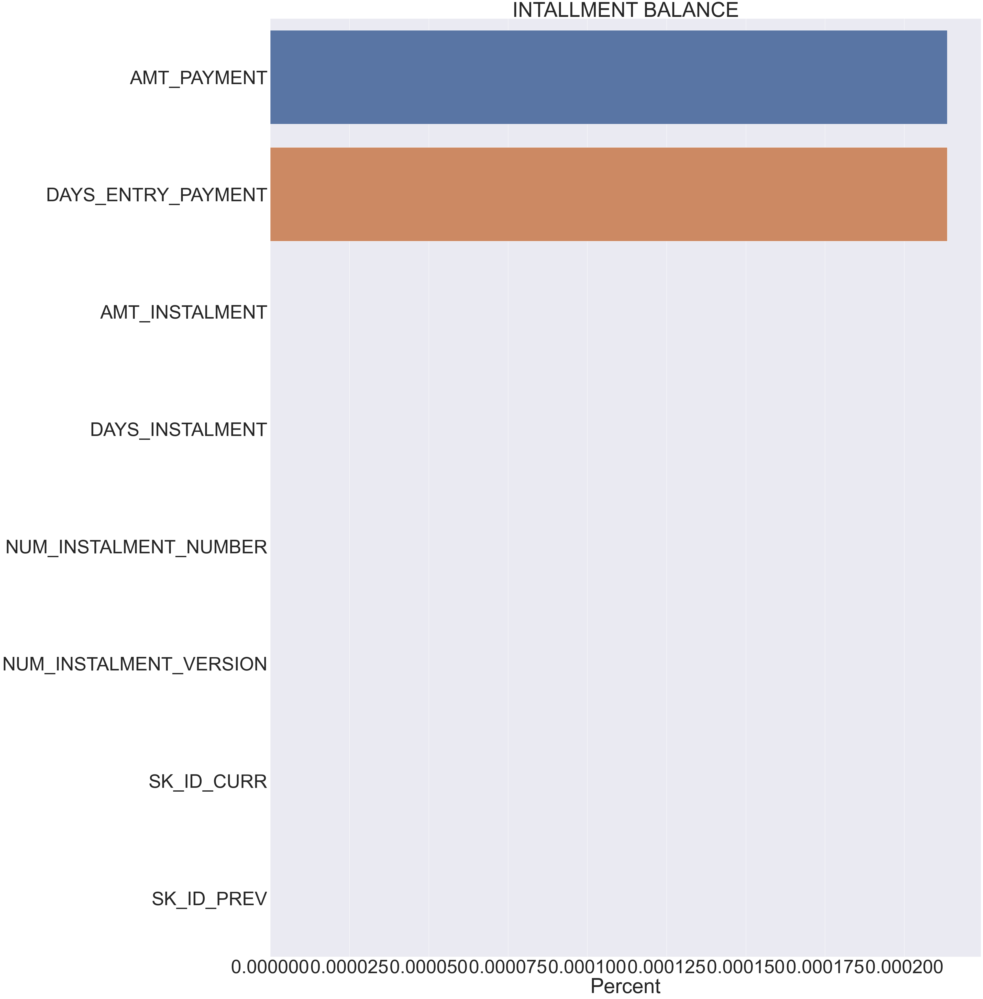

In [579]:
# df_inst_pay.csv
missing_value(df_inst_pay,df_name='INTALLMENT BALANCE')

 <pre>
 We will have to handle these missing values (known as imputation). Other option would be to drop all those columns where there are large number of missing values. Unless we know the feature importance, it is not possible to make a call on which columns to keep which ones to drop.
 
Except bureau_bal, evrything have missing values, important thing is our main application_train and application_test tables contains very high missing values. some machine learning algorithm like Light GBM and XGBoost will handle missing value smartly.Once we finalizse the features will do feature engineering.
 
 How XGboost Handling Missing value internally???????????????????
 
 </pre>

In [198]:
# Check duplicate row present in dataset
duplicate = df[df.duplicated()]
print('Number of Duplicate rows present in the dataset - '+str(duplicate.shape[0]))

Number of Duplicate rows present in the dataset - 0


### Different type of Column in train and test

In [200]:
print("Train dataset: \n{}".format(df.dtypes.value_counts()))
print('-'*50)
print("Test dataset: \n{}".format(df_test.dtypes.value_counts())) 
print('-'*50)

Train dataset: 
float64    65
int64      41
object     16
dtype: int64
--------------------------------------------------
Test dataset: 
float64    65
int64      40
object     16
dtype: int64
--------------------------------------------------


<pre>we already confirmed both train and test have same column name , now we going to check wheather all have similar data type. if not change data type
</pre>

In [56]:
# Train and test should have same column name and datatype, we already confirmed we have same column, to check same dtype 
# we using below function, to change all the test data type similar to train dataset
def check_dtypes(train_df,test_df,target_name='TARGET'):
    """
    This function converts dataframe to match columns in accordance with the 
    training dataframe.
    """
    for column_name in train_df.drop([target_name],axis=1).columns:
         test_df[column_name]= test_df[column_name].astype(train_df[column_name].dtype)
        
    return test_df

new_df_test = check_dtypes(df,df_test,target_name='TARGET')

In [57]:
print("Train dataset: \n{}".format(df.dtypes.value_counts()))
print('-'*50)
print("Test dataset: \n{}".format(new_df_test.dtypes.value_counts())) 
print('-'*50)

Train dataset: 
float64    65
int64      41
object     16
dtype: int64
--------------------------------------------------
Test dataset: 
float64    65
int64      40
object     16
dtype: int64
--------------------------------------------------


### Distribution among the Target Dataset

Number of applicants repayed loan amount  282686 , ( 91.92711805431351 %)
Number of applicants not repayed loan amount  24825 , ( 8.072881945686495 %)


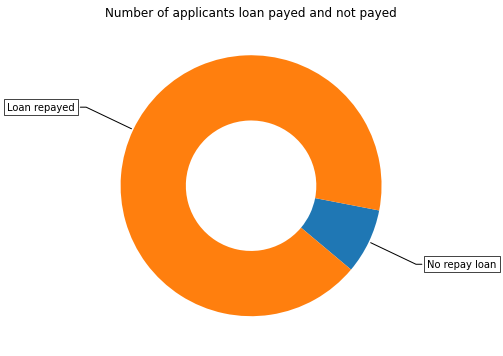

In [20]:
# Refer
# https://matplotlib.org/gallery/pie_and_polar_charts/pie_and_donut_labels.html#sphx-glr-gallery-pie-and-polar-charts-pie-and-donut-labels-py


y_value_counts = df['TARGET'].value_counts()
print("Number of applicants repayed loan amount ", y_value_counts[0], ", (", (y_value_counts[0]/(y_value_counts[1]+y_value_counts[0]))*100,"%)")
print("Number of applicants not repayed loan amount ", y_value_counts[1], ", (", (y_value_counts[1]/(y_value_counts[1]+y_value_counts[0]))*100,"%)")

fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(aspect="equal"))
recipe = ["No repay loan", "Loan repayed"]

data = [y_value_counts[1], y_value_counts[0]]

wedges, texts = ax.pie(data, wedgeprops=dict(width=0.5), startangle=-40)

bbox_props = dict(boxstyle="square,pad=0.3", fc="w", ec="k", lw=0.72)
kw = dict(xycoords='data', textcoords='data', arrowprops=dict(arrowstyle="-"),
          bbox=bbox_props, zorder=0, va="center")

for i, p in enumerate(wedges):
    ang = (p.theta2 - p.theta1)/2. + p.theta1
    y = np.sin(np.deg2rad(ang))
    x = np.cos(np.deg2rad(ang))
    horizontalalignment = {-1: "right", 1: "left"}[int(np.sign(x))]
    connectionstyle = "angle,angleA=0,angleB={}".format(ang)
    kw["arrowprops"].update({"connectionstyle": connectionstyle})
    ax.annotate(recipe[i], xy=(x, y), xytext=(1.35*np.sign(x), 1.4*y),
                 horizontalalignment=horizontalalignment, **kw)

ax.set_title("Number of applicants loan payed and not payed")

plt.show()

<pre>
From above pie chart, our target column is highly imbalanced,

Number of applicants repayed loan amount  282686 ,  ( 91.92711805431351 %)
Number of applicants not repayed loan amount  24825 , ( 8.072881945686495 %)
</pre>


### CATEGORICAL EDA

In [315]:
categorical = df.dtypes[df.dtypes == "object"].index
print('Categorical Columns - '+str(categorical))
df[categorical].describe()

Categorical Columns - Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE',
       'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE'],
      dtype='object')


,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
count,307511,307511,307511,307511,306219,307511,307511,307511,307511,211120,307511,307511,97216,153214,151170,161756
unique,2,3,2,2,7,8,5,6,6,18,7,58,4,3,7,2
top,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,Laborers,TUESDAY,Business Entity Type 3,reg oper account,block of flats,Panel,No
freq,278232,202448,202924,213312,248526,158774,218391,196432,272868,55186,53901,67992,73830,150503,66040,159428


In [58]:

# Number of unique classes in train
train_data_type = df.select_dtypes('object').apply(pd.Series.nunique)

# Number of unique classes in test
test_data_type = new_df_test.select_dtypes('object').apply(pd.Series.nunique)

# Create Dataframe
pd.DataFrame({'Train_Unique_value_count': train_data_type, 'Test_Unique_value_count':test_data_type})

,Train_Unique_value_count,Test_Unique_value_count
NAME_CONTRACT_TYPE,2,2
CODE_GENDER,3,2
FLAG_OWN_CAR,2,2
FLAG_OWN_REALTY,2,2
NAME_TYPE_SUITE,7,7
NAME_INCOME_TYPE,8,7
NAME_EDUCATION_TYPE,5,5
NAME_FAMILY_STATUS,6,5
NAME_HOUSING_TYPE,6,6
OCCUPATION_TYPE,18,18


## univariate_barplots

In [23]:
#stacked bar plots matplotlib: https://matplotlib.org/gallery/lines_bars_and_markers/bar_stacked.html
def stack_plot(data, xtick,col2='TARGET', col3='total', dataset_type= 'TRAIN.csv'):
    
    '''
    Input:
    data - Dataset of train/test
    xtick - Column name - X axis of bar plot.
    col2 -  COlumn name - Y- aixs of bar plot
    dataset_type -  represent train or test file
    
    Return 
        None
    
    '''
    ind = np.arange(data.shape[0])
    
    plt.figure(figsize=(10,5))
    p1 = plt.bar(ind, data[col3].values)
    p2 = plt.bar(ind, data[col2].values)

    plt.ylabel('Count of Applicants')
    plt.title('% of Loan repayed - '+str(xtick)+str('  -')+str(dataset_type))
    plt.xticks(ind, list(data[xtick].values))
    plt.legend((p1[0], p2[0]), ('total', 'Loan repayed'))
    plt.tight_layout()
    plt.show()

In [26]:
def univariate_barplots(data, col1, col2='TARGET', top=False,dataset_type= 'TRAIN.csv'):
    '''
    Input:
    data - Dataset of train/test
    col1 - Column name - X axis of bar plot.
    col2 -  COlumn name - Y- aixs of bar plot
    top -  Numeric value to print top result, eg : 5 it will give top 5 results
    dataset_type -  Dataframe name
    
    Return 
        plot of col1 and col2
    
    '''
    # Count number of zeros in dataframe python: https://stackoverflow.com/a/51540521/4084039
    temp = pd.DataFrame(data.groupby(col1)[col2].agg(lambda x: x.eq(0).sum())).reset_index()

    # Pandas dataframe grouby count: https://stackoverflow.com/a/19385591/4084039
    temp['total'] = pd.DataFrame(data.groupby(col1)[col2].agg(total='count')).reset_index()['total']
    temp['Average'] = (temp['TARGET']/temp['total']) *100
    temp.sort_values(by=['total'],inplace=True, ascending=False)

    
    if top:
        temp = temp[0:10]
    
    stack_plot(temp, xtick=col1, col2=col2, col3='total',dataset_type=dataset_type)
    print(temp.head(5))
    print("="*50)
    print(temp.tail(5))

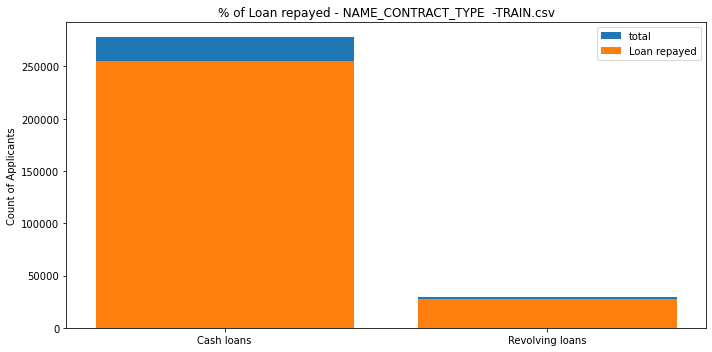

  NAME_CONTRACT_TYPE  TARGET   total    Average
0         Cash loans  255011  278232  91.654087
1    Revolving loans   27675   29279  94.521671
  NAME_CONTRACT_TYPE  TARGET   total    Average
0         Cash loans  255011  278232  91.654087
1    Revolving loans   27675   29279  94.521671


In [27]:
univariate_barplots(df, 'NAME_CONTRACT_TYPE', 'TARGET', top=False)

<pre>
<strong> Observation </strong>
people willing to take cash loan instead Revolving loan
</pre>

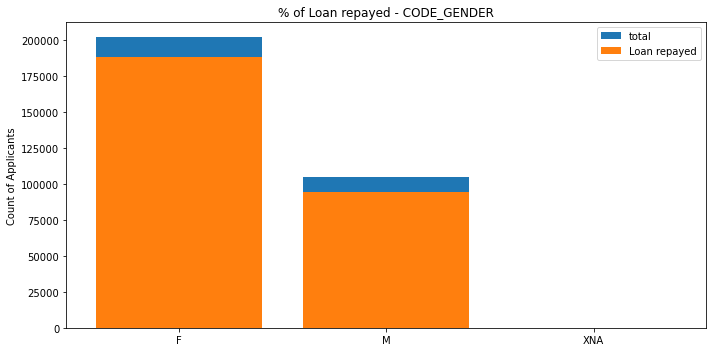

  CODE_GENDER  TARGET   total     Average
0           F  188278  202448   93.000672
1           M   94404  105059   89.858080
2         XNA       4       4  100.000000
  CODE_GENDER  TARGET   total     Average
0           F  188278  202448   93.000672
1           M   94404  105059   89.858080
2         XNA       4       4  100.000000


In [133]:
univariate_barplots(df, 'CODE_GENDER', 'TARGET', top=False)



<pre>
<strong> Observation </strong>
Here we additional gender type XNA, where we have only 4 data, instead replace by Unknow better to remove this type. 
Beacuse here all XNA type is fully repaid, which may leads to bad result in test.

</pre>

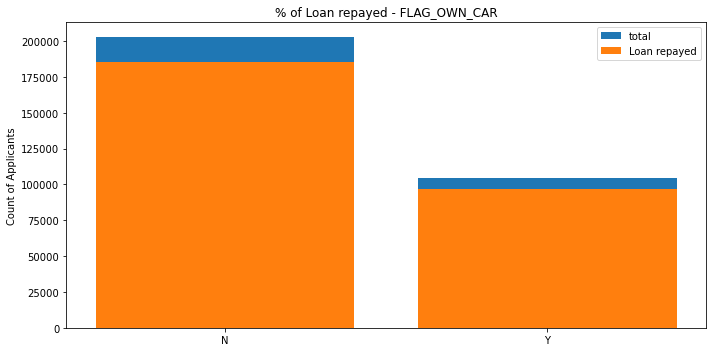

  FLAG_OWN_CAR  TARGET   total    Average
0            N  185675  202924  91.499773
1            Y   97011  104587  92.756270
  FLAG_OWN_CAR  TARGET   total    Average
0            N  185675  202924  91.499773
1            Y   97011  104587  92.756270


In [134]:
univariate_barplots(df, 'FLAG_OWN_CAR', 'TARGET', top=False)

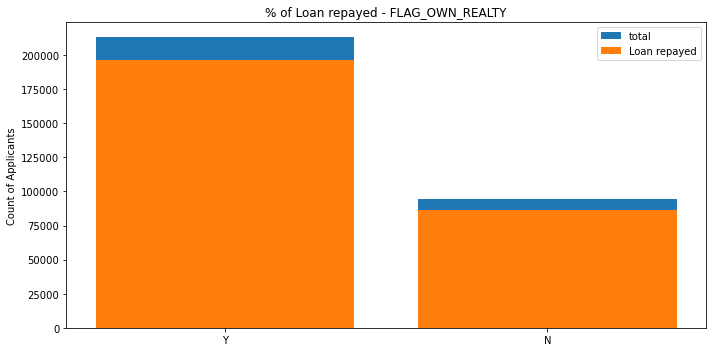

  FLAG_OWN_REALTY  TARGET   total    Average
1               Y  196329  213312  92.038423
0               N   86357   94199  91.675071
  FLAG_OWN_REALTY  TARGET   total    Average
1               Y  196329  213312  92.038423
0               N   86357   94199  91.675071


In [135]:
univariate_barplots(df, 'FLAG_OWN_REALTY', 'TARGET', top=False)

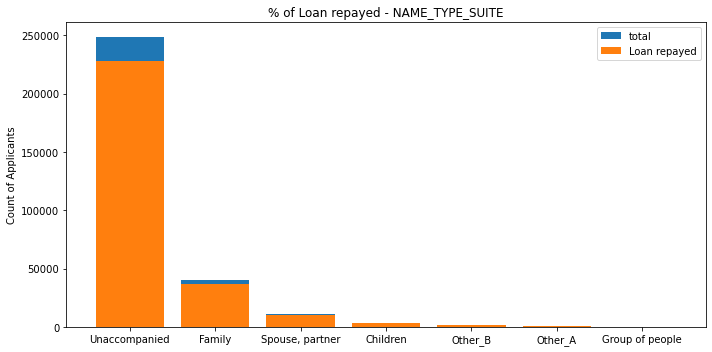

   NAME_TYPE_SUITE  TARGET   total    Average
6    Unaccompanied  228189  248526  91.816953
1           Family   37140   40149  92.505417
5  Spouse, partner   10475   11370  92.128408
0         Children    3026    3267  92.623202
4          Other_B    1596    1770  90.169492
   NAME_TYPE_SUITE  TARGET  total    Average
5  Spouse, partner   10475  11370  92.128408
0         Children    3026   3267  92.623202
4          Other_B    1596   1770  90.169492
3          Other_A     790    866  91.224018
2  Group of people     248    271  91.512915


In [136]:
univariate_barplots(df, 'NAME_TYPE_SUITE', 'TARGET', top=False)

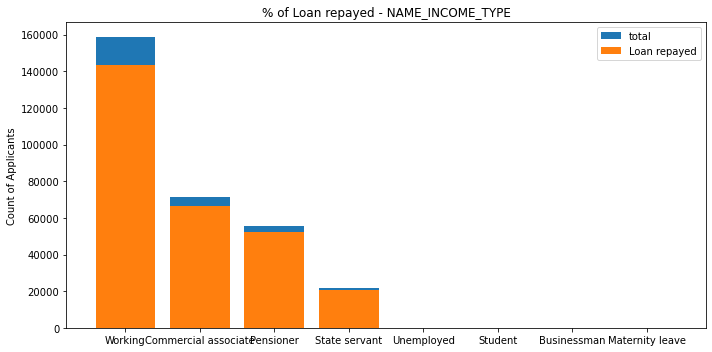

       NAME_INCOME_TYPE  TARGET   total    Average
7               Working  143550  158774  90.411528
1  Commercial associate   66257   71617  92.515743
3             Pensioner   52380   55362  94.613634
4         State servant   20454   21703  94.245035
6            Unemployed      14      22  63.636364
  NAME_INCOME_TYPE  TARGET  total     Average
4    State servant   20454  21703   94.245035
6       Unemployed      14     22   63.636364
5          Student      18     18  100.000000
0      Businessman      10     10  100.000000
2  Maternity leave       3      5   60.000000


In [138]:
univariate_barplots(df, 'NAME_INCOME_TYPE', 'TARGET', top=False)

<pre>
<strong> Observation </strong>

If Income type is Business and Student pretty much they repaid loan correctly
</pre>

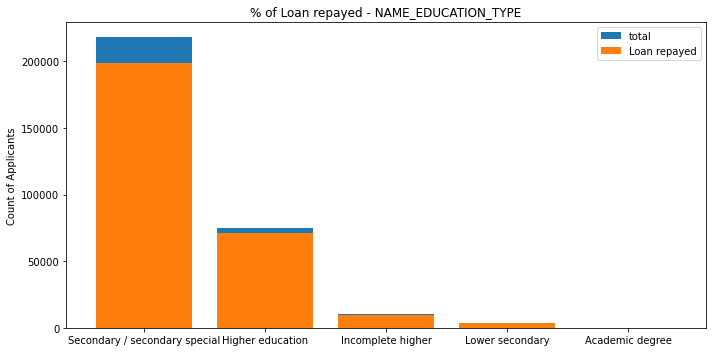

             NAME_EDUCATION_TYPE  TARGET   total    Average
4  Secondary / secondary special  198867  218391  91.060071
1               Higher education   70854   74863  94.644885
2              Incomplete higher    9405   10277  91.515034
3                Lower secondary    3399    3816  89.072327
0                Academic degree     161     164  98.170732
             NAME_EDUCATION_TYPE  TARGET   total    Average
4  Secondary / secondary special  198867  218391  91.060071
1               Higher education   70854   74863  94.644885
2              Incomplete higher    9405   10277  91.515034
3                Lower secondary    3399    3816  89.072327
0                Academic degree     161     164  98.170732


In [139]:
univariate_barplots(df, 'NAME_EDUCATION_TYPE', 'TARGET', top=False)

<pre>
<strong>Observation </strong>

If Education type is Academic degree they pretty much repaid loan correctly.
</pre>

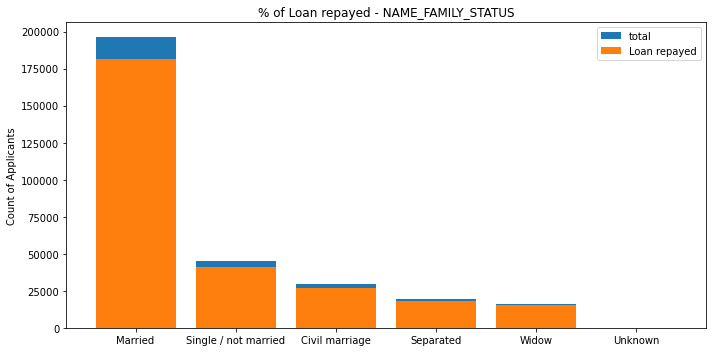

     NAME_FAMILY_STATUS  TARGET   total    Average
1               Married  181582  196432  92.440132
3  Single / not married   40987   45444  90.192325
0        Civil marriage   26814   29775  90.055416
2             Separated   18150   19770  91.805766
5                 Widow   15151   16088  94.175783
     NAME_FAMILY_STATUS  TARGET  total     Average
3  Single / not married   40987  45444   90.192325
0        Civil marriage   26814  29775   90.055416
2             Separated   18150  19770   91.805766
5                 Widow   15151  16088   94.175783
4               Unknown       2      2  100.000000


In [140]:
univariate_barplots(df, 'NAME_FAMILY_STATUS', 'TARGET', top=False)

<pre>

<strong> Observation </strong>
Widows are more likely to repay the loan when compared to other appliants with family statuses.
</pre>

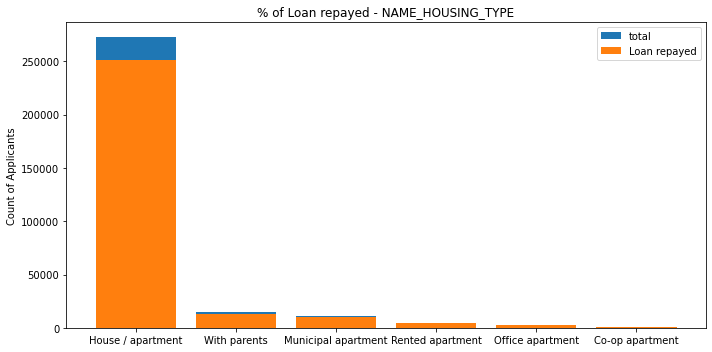

     NAME_HOUSING_TYPE  TARGET   total    Average
1    House / apartment  251596  272868  92.204289
5         With parents   13104   14840  88.301887
2  Municipal apartment   10228   11183  91.460252
4     Rented apartment    4280    4881  87.686949
3     Office apartment    2445    2617  93.427589
     NAME_HOUSING_TYPE  TARGET  total    Average
5         With parents   13104  14840  88.301887
2  Municipal apartment   10228  11183  91.460252
4     Rented apartment    4280   4881  87.686949
3     Office apartment    2445   2617  93.427589
0      Co-op apartment    1033   1122  92.067736


In [141]:
univariate_barplots(df, 'NAME_HOUSING_TYPE', 'TARGET', top=False)

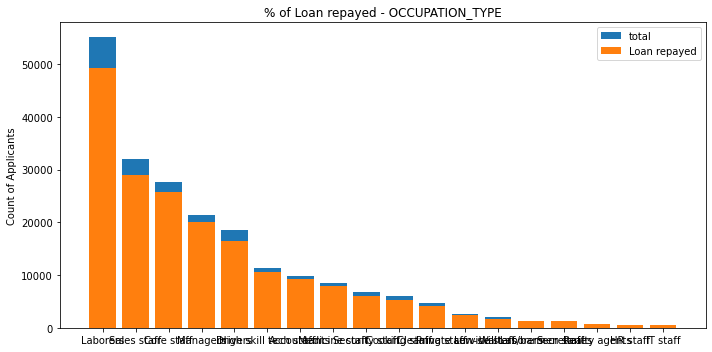

   OCCUPATION_TYPE  TARGET  total    Average
8         Laborers   49348  55186  89.421230
14     Sales staff   29010  32102  90.368201
3       Core staff   25832  27570  93.696046
10        Managers   20043  21371  93.785972
4          Drivers   16496  18603  88.673870
         OCCUPATION_TYPE  TARGET  total    Average
17  Waiters/barmen staff    1196   1348  88.724036
15           Secretaries    1213   1305  92.950192
13         Realty agents     692    751  92.143808
5               HR staff     527    563  93.605684
7               IT staff     492    526  93.536122


In [142]:
univariate_barplots(df, 'OCCUPATION_TYPE', 'TARGET', top=False)

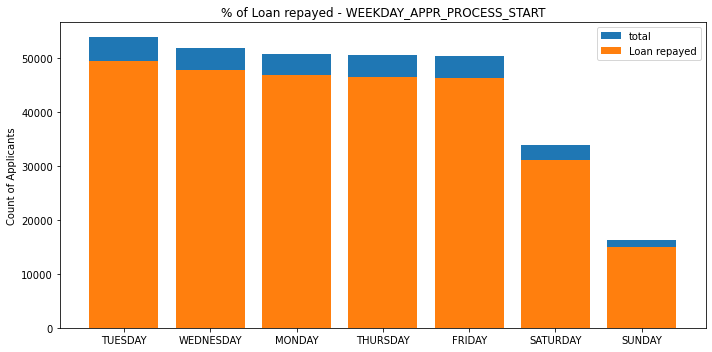

  WEEKDAY_APPR_PROCESS_START  TARGET  total    Average
5                    TUESDAY   49400  53901  91.649506
6                  WEDNESDAY   47696  51934  91.839643
1                     MONDAY   46780  50714  92.242773
4                   THURSDAY   46493  50591  91.899745
0                     FRIDAY   46237  50338  91.853073
  WEEKDAY_APPR_PROCESS_START  TARGET  total    Average
1                     MONDAY   46780  50714  92.242773
4                   THURSDAY   46493  50591  91.899745
0                     FRIDAY   46237  50338  91.853073
2                   SATURDAY   31182  33852  92.112726
3                     SUNDAY   14898  16181  92.070947


In [143]:
univariate_barplots(df, 'WEEKDAY_APPR_PROCESS_START', 'TARGET', top=False)

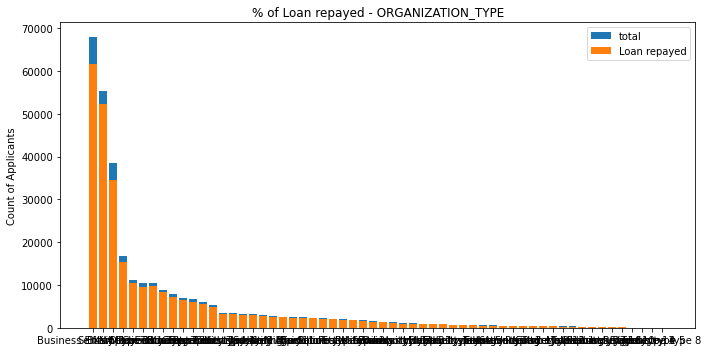

         ORGANIZATION_TYPE  TARGET  total    Average
5   Business Entity Type 3   61669  67992  90.700377
57                     XNA   52384  55374  94.600354
42           Self-employed   34504  38412  89.826096
33                   Other   15408  16683  92.357490
30                Medicine   10456  11193  93.415528
    ORGANIZATION_TYPE  TARGET  total    Average
37           Religion      80     85  94.117647
18  Industry: type 13      58     67  86.567164
48      Trade: type 4      62     64  96.875000
49      Trade: type 5      46     49  93.877551
25   Industry: type 8      21     24  87.500000


In [144]:
univariate_barplots(df, 'ORGANIZATION_TYPE', 'TARGET', top=False)

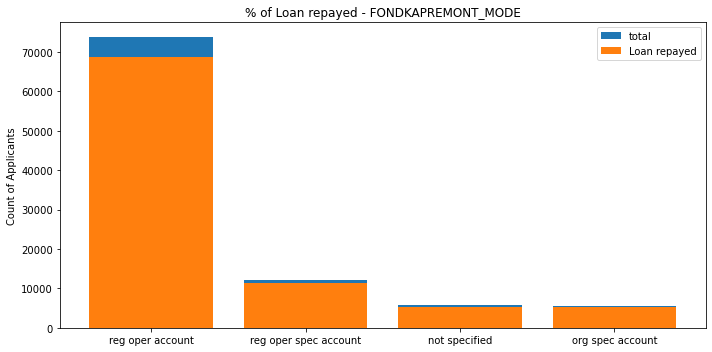

      FONDKAPREMONT_MODE  TARGET  total    Average
2       reg oper account   68678  73830  93.021807
3  reg oper spec account   11288  12080  93.443709
0          not specified    5258   5687  92.456480
1       org spec account    5292   5619  94.180459
      FONDKAPREMONT_MODE  TARGET  total    Average
2       reg oper account   68678  73830  93.021807
3  reg oper spec account   11288  12080  93.443709
0          not specified    5258   5687  92.456480
1       org spec account    5292   5619  94.180459


In [145]:
univariate_barplots(df, 'FONDKAPREMONT_MODE', 'TARGET', top=False)

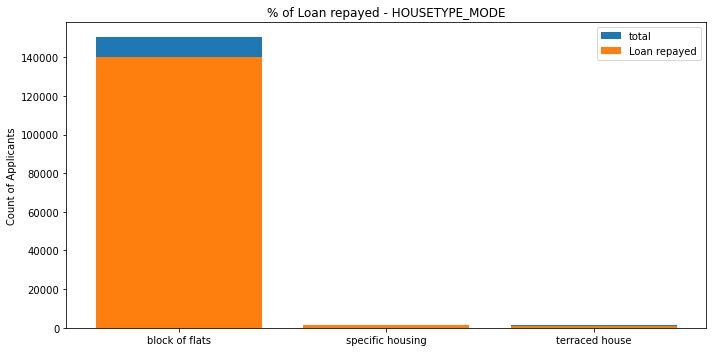

     HOUSETYPE_MODE  TARGET   total    Average
0    block of flats  140053  150503  93.056617
1  specific housing    1347    1499  89.859907
2    terraced house    1109    1212  91.501650
     HOUSETYPE_MODE  TARGET   total    Average
0    block of flats  140053  150503  93.056617
1  specific housing    1347    1499  89.859907
2    terraced house    1109    1212  91.501650


In [146]:
univariate_barplots(df, 'HOUSETYPE_MODE', 'TARGET', top=False)

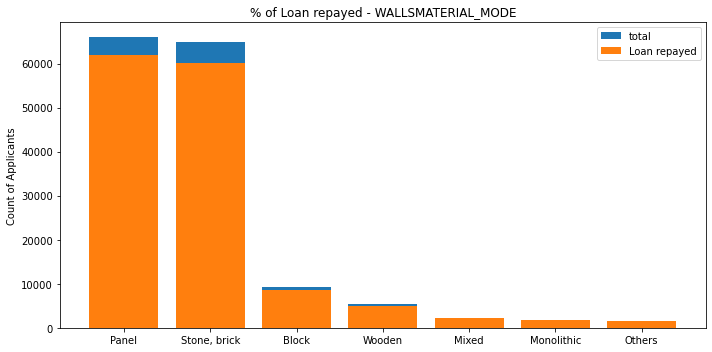

  WALLSMATERIAL_MODE  TARGET  total    Average
4              Panel   61848  66040  93.652332
5       Stone, brick   60015  64815  92.594307
0              Block    8603   9253  92.975251
6             Wooden    4842   5362  90.302126
1              Mixed    2123   2296  92.465157
  WALLSMATERIAL_MODE  TARGET  total    Average
0              Block    8603   9253  92.975251
6             Wooden    4842   5362  90.302126
1              Mixed    2123   2296  92.465157
2         Monolithic    1695   1779  95.278246
3             Others    1490   1625  91.692308


In [147]:
univariate_barplots(df, 'WALLSMATERIAL_MODE', 'TARGET', top=False)

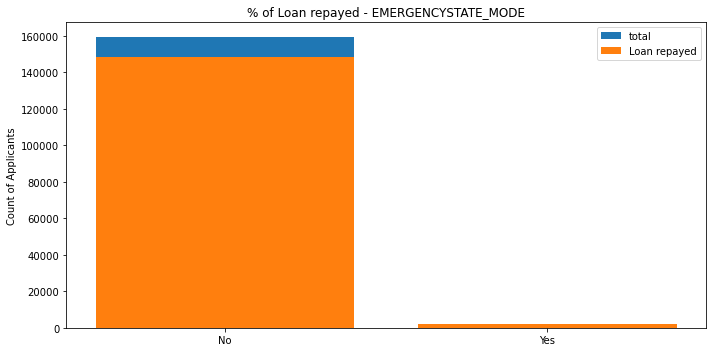

  EMERGENCYSTATE_MODE  TARGET   total    Average
0                  No  148324  159428  93.035100
1                 Yes    2105    2328  90.420962
  EMERGENCYSTATE_MODE  TARGET   total    Average
0                  No  148324  159428  93.035100
1                 Yes    2105    2328  90.420962


In [148]:
univariate_barplots(df, 'EMERGENCYSTATE_MODE', 'TARGET', top=False)

### Numerical EDA

In [213]:
numerical_columns = df.select_dtypes(include=[np.number]).columns
print(numerical_columns)
print('\nNumber of Numeric column -'+ str(len(numerical_columns)))

Index(['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       ...
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object', length=106)

Number of Numeric column -106


In [34]:
def plot_continuous_variables(data, column_name, plots = ['box' , 'distplot'], scale_limits = None, figsize = (20,8), histogram = True, log_scale = False):
    '''
    Function to plot continuous variables distribution
    
    Inputs:
        data: DataFrame
            The DataFrame from which to plot.
        column_name: str
            Column's name whose distribution is to be plotted.
        plots: list, default = ['distplot', box']
            List of plots to plot for Continuous Variable.
            CDF - # CDF helps to understand how may precent of the total data is below or above a specified threshold
        scale_limits: tuple (left, right), default = None
            To control the limits of values to be plotted in case of outliers.
        figsize: tuple, default = (20,8)
            Size of the figure to be plotted.
        histogram: bool, default = True
            Whether to plot histogram along with distplot or not.
        log_scale: bool, default = False
            Whether to use log-scale for variables with outlying points.
            
            
            
    '''
    data_to_plot = data.copy()
    if scale_limits:
        #taking only the data within the specified limits
        data_to_plot[column_name] = data[column_name][(data[column_name] > scale_limits[0]) & (data[column_name] < scale_limits[1])]

    number_of_subplots = len(plots)
    plt.figure(figsize = figsize)
    sns.set_style('whitegrid')
    
    for i, ele in enumerate(plots):
        plt.subplot(1, number_of_subplots, i + 1)
        plt.subplots_adjust(wspace=0.25)
            
        if ele == 'distplot':  
            sns.distplot(data_to_plot[column_name][data['TARGET'] == 0].dropna(),
                         label='Laon_repayed', hist = False, color='green')
            sns.distplot(data_to_plot[column_name][data['TARGET'] == 1].dropna(),
                         label='Defaulters', hist = False, color='red')
            plt.xlabel(column_name)
            plt.ylabel('Probability Density')
            plt.legend(fontsize='medium')
            plt.title("Dist-Plot of {}".format(column_name))
            if log_scale:
                plt.xscale('log')
                plt.xlabel(f'{column_name} (log scale)')


        if ele == 'box':  
            sns.boxplot(x='TARGET', y=column_name, data=data_to_plot)
            plt.title("Box-Plot of {}".format(column_name))
            if log_scale:
                plt.yscale('log')
                plt.ylabel(f'{column_name} (log Scale)')

    plt.show()

### DAYS_BIRTH

<pre><strong>Description</strong> - Client's age in days at the time of application </pre>

In [218]:
(df['DAYS_BIRTH']).describe()

count    307511.000000
mean     -16036.995067
std        4363.988632
min      -25229.000000
25%      -19682.000000
50%      -15750.000000
75%      -12413.000000
max       -7489.000000
Name: DAYS_BIRTH, dtype: float64

<pre>
Actually Age of applicant is in days format, for easy interpretation converting to age in to year format

</pre>

In [219]:
df['Age'] = round(df['DAYS_BIRTH'] *-1/ 365)

In [220]:
df['Age'].head(2)

0    26.0
1    46.0
Name: Age, dtype: float64

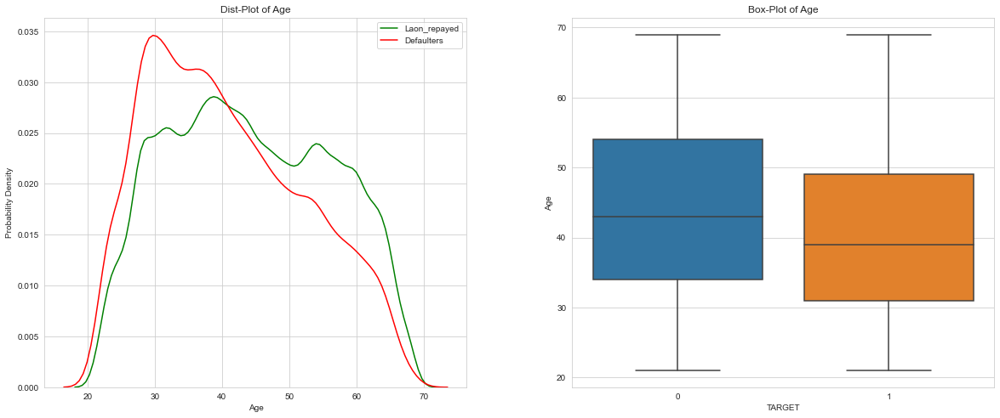

In [138]:
plot_continuous_variables(df,'Age',plots=['distplot','box'])

<pre>
From Histogram, Loan defaulter peak range is around 30 years to 40 years, after 40 there gradual fall.
From box-plot Loan defaulter age is low comapre loan payed applicant, and there is no outliers
see 75th percentile for non-defaulter is 53 and defaulter is 48.

take away is mostly defaulter is younger than Non-defaulter

</pre>

### DAYS_EMPLOYED

<pre><strong>Description</strong> - How many days before the application the person started current employment </pre>

For easy interprentation, converting days to yeras

In [245]:
df['DAYS_EMPLOYED'].describe()

count    307511.000000
mean      63815.045904
std      141275.766519
min      -17912.000000
25%       -2760.000000
50%       -1213.000000
75%        -289.000000
max      365243.000000
Name: DAYS_EMPLOYED, dtype: float64

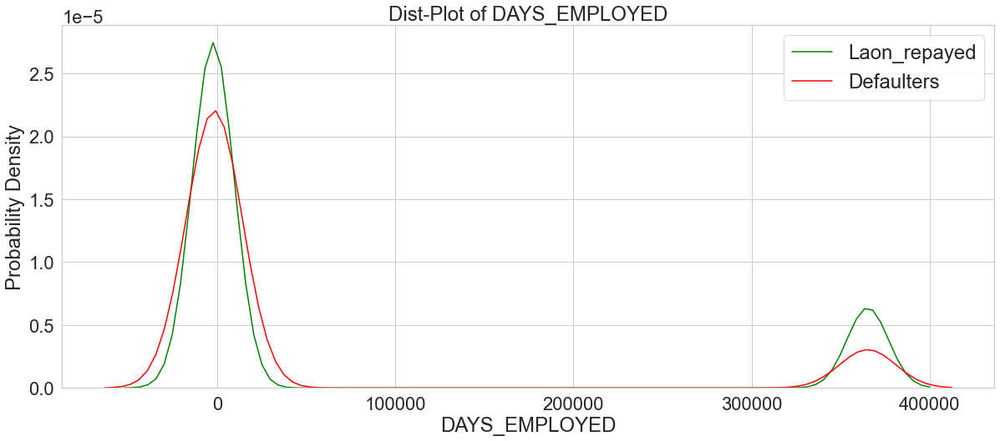

In [246]:
plot_continuous_variables(df,'DAYS_EMPLOYED',plots=['distplot'])

In [247]:
df['DAYS_EMPLOYED'].value_counts().sort_index(ascending=False)

 365243    55374
 0             2
-1             1
-2             2
-3             3
           ...  
-17522         1
-17531         1
-17546         1
-17583         1
-17912         1
Name: DAYS_EMPLOYED, Length: 12574, dtype: int64

<pre>
<strong>Observation</strong>
Here we cant remove this data beacuse we have 55374 data entry which is quite large, we need to handle effectively
</pre>

Count error entry in year empolyed  55374


Text(0.5, 1.0, 'Error entry - DAYS_EMPLOYED- repay ability')

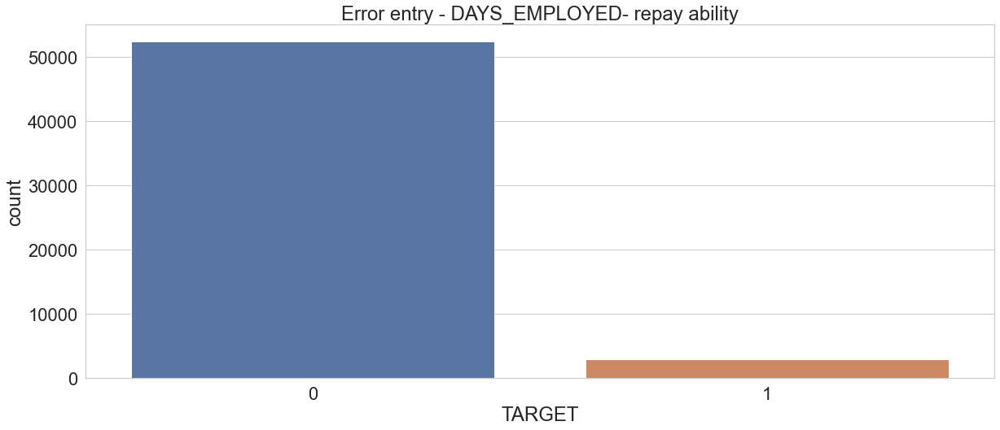

In [248]:
# First let check their repay ability 
error_year_empolyed = df[df['DAYS_EMPLOYED'] ==365243]
print('Count error entry in year empolyed ', len(error_year_empolyed))
sns.countplot(x='TARGET',data=error_year_empolyed)
plt.title('Error entry - DAYS_EMPLOYED- repay ability')

<pre>
see , error entry applicants repay there loan on time, so removing this error data leads to valuable information loss, better one of the safest approaches is just to set the anomalies to a missing value and then have them filled in (using Imputation) before machine learning

In this case all error values have same value , so replace by same value using Imputer, other approach, we will fill in the anomalous values with not a number (np.nan) and then create a new boolean column indicating whether or not the value was anomalous.
</pre>

In [250]:
# abs - convert all value in to postive
df['Year_Empolyed']  = abs(df['DAYS_EMPLOYED'])
df['Year_Empolyed'].head(2)

0     637
1    1188
Name: Year_Empolyed, dtype: int64

In [251]:
# Create an anomalous flag column
df['Year_Empolyed_ANOM'] = df["Year_Empolyed"] == 365243

# Replace the anomalous values with nan
df['Year_Empolyed'] = df['Year_Empolyed'].replace({365243: np.nan})

In [252]:
df['Year_Empolyed'].value_counts().sort_index(ascending=False)

17912.0    1
17583.0    1
17546.0    1
17531.0    1
17522.0    1
          ..
4.0        4
3.0        3
2.0        2
1.0        1
0.0        2
Name: Year_Empolyed, Length: 12573, dtype: int64

In [253]:
df['Year_Empolyed'].describe()

count    252137.000000
mean       2384.169325
std        2338.360162
min           0.000000
25%         767.000000
50%        1648.000000
75%        3175.000000
max       17912.000000
Name: Year_Empolyed, dtype: float64

In [254]:
# Convert days in to years
df['Year_Empolyed'] = df['Year_Empolyed'] /365


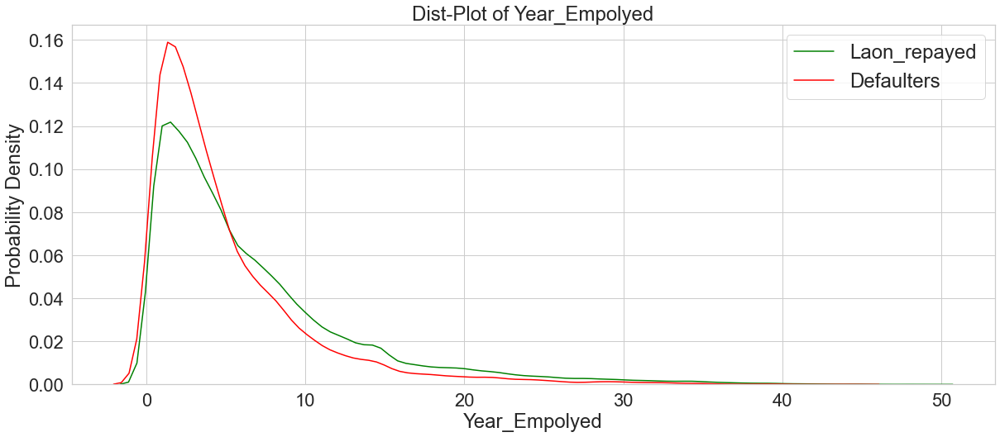

In [255]:
plot_continuous_variables(df,'Year_Empolyed',plots=['distplot'])

<pre>
<strong>Observation </strong>
Now Year_Empolyed seems normal

Applicant who has 2 to 3 years, not repayed loan correctly

</pre>

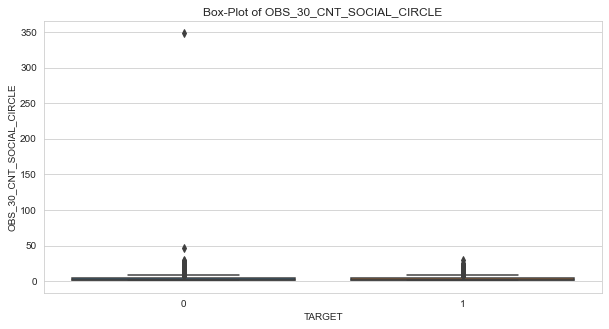

In [44]:
plot_continuous_variables(df,'OBS_30_CNT_SOCIAL_CIRCLE',plots=['box'],figsize = (10,5),scale_limits=(0,400))

In [49]:
df['OBS_30_CNT_SOCIAL_CIRCLE'].value_counts()

0.0      163910
1.0       48783
2.0       29808
3.0       20322
4.0       14143
5.0        9553
6.0        6453
7.0        4390
8.0        2967
9.0        2003
10.0       1376
11.0        852
12.0        652
13.0        411
14.0        258
15.0        166
16.0        133
17.0         88
18.0         46
19.0         44
20.0         30
21.0         29
22.0         22
23.0         15
24.0         11
25.0         11
27.0          5
26.0          3
30.0          2
28.0          1
348.0         1
29.0          1
47.0          1
Name: OBS_30_CNT_SOCIAL_CIRCLE, dtype: int64

<pre>
<strong>Observation </strong>
OBS_30_CNT_SOCIAL_CIRCLE having 2 point outliers 47 and 348, remove those entries

</pre>

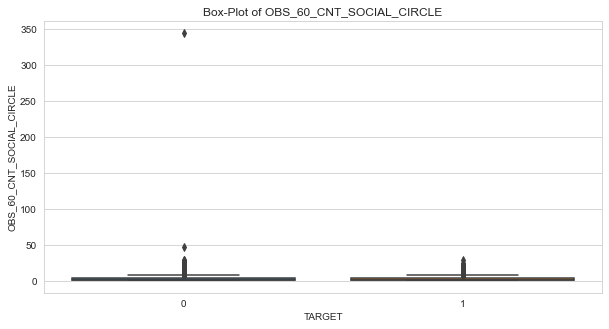

In [50]:
plot_continuous_variables(df,'OBS_60_CNT_SOCIAL_CIRCLE',plots=['box'],figsize = (10,5),scale_limits=(0,400))

In [52]:
df['OBS_60_CNT_SOCIAL_CIRCLE'].value_counts()

0.0      164666
1.0       48870
2.0       29766
3.0       20215
4.0       13946
5.0        9463
6.0        6349
7.0        4344
8.0        2886
9.0        1959
10.0       1335
11.0        837
12.0        620
13.0        401
14.0        238
15.0        166
16.0        137
17.0         73
18.0         49
19.0         44
20.0         30
21.0         28
22.0         20
23.0         13
24.0         12
25.0         11
27.0          5
29.0          2
28.0          1
344.0         1
47.0          1
26.0          1
30.0          1
Name: OBS_60_CNT_SOCIAL_CIRCLE, dtype: int64

<pre>
<strong>Observation </strong>
OBS_60_CNT_SOCIAL_CIRCLE having 2 point outliers 47 and 344, remove those entries

</pre>

In [95]:
# REGION_RATING_CLIENT is Int type , having discret value so better to consider as Object
print(df['REGION_RATING_CLIENT'].value_counts())

# REGION_RATING_CLIENT_W_CITY is Int type , having discret value so better to consider as Object
print(df['REGION_RATING_CLIENT_W_CITY'].value_counts())

2    226981
3     48329
1     32197
Name: REGION_RATING_CLIENT, dtype: int64
2    229481
3     43859
1     34167
Name: REGION_RATING_CLIENT_W_CITY, dtype: int64


### Find most correlated feature with dependent feature

<pre>
Refer - https://whatis.techtarget.com/definition/correlation

    Correlation is a statistical measure that indicates the extent to which two or more variables fluctuate together. A positive correlation indicates the extent to which those variables increase or decrease in parallel; a negative correlation indicates the extent to which one variable increases as the other decreases.

A correlation coefficient is a statistical measure of the degree to which changes to the value of one variable predict change to the value of another. When the fluctuation of one variable reliably predicts a similar fluctuation in another variable, there’s often a tendency to think that means that the change in one causes the change in the other. However, correlation does not imply causation. There may be, for example, an unknown factor that influences both variables similarly.

To describe the strength of the correlation using the guide that Evans (1996) suggests for the absolute value of r:
.00-.19 “very weak”
.20-.39 “weak”
.40-.59 “moderate”
.60-.79 “strong”
.80-1.0 “very strong”
    
</pre>

In [468]:
import scipy.stats as ss
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

#### we already have categorical column, but we have additional columns which have some binary encoded column, so we going to take those as categorical.

In [15]:
# check integer column, which have discrete value 
test_object =  df.select_dtypes(include=[np.number]).columns
int_cat_col = []
for i in test_object:
    unique = df[i].nunique()
    if unique <=3:
        int_cat_col.append(i)
        
print(int_cat_col)

['TARGET', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_21']


In [377]:
categorical_columns = ['TARGET','FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE',
                                   'FLAG_PHONE', 'FLAG_EMAIL','REGION_RATING_CLIENT','REGION_RATING_CLIENT_W_CITY',
                                  'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
                                   'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 
                                'LIVE_CITY_NOT_WORK_CITY'] + ['FLAG_DOCUMENT_' + str(i) for i in range(2,22)] + df.dtypes[
                                    df.dtypes == 'object'].index.tolist()

In [378]:
categorical_columns

['TARGET',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'FLAG_DOCUMENT_2',
 'FLAG_DOCUMENT_3',
 'FLAG_DOCUMENT_4',
 'FLAG_DOCUMENT_5',
 'FLAG_DOCUMENT_6',
 'FLAG_DOCUMENT_7',
 'FLAG_DOCUMENT_8',
 'FLAG_DOCUMENT_9',
 'FLAG_DOCUMENT_10',
 'FLAG_DOCUMENT_11',
 'FLAG_DOCUMENT_12',
 'FLAG_DOCUMENT_13',
 'FLAG_DOCUMENT_14',
 'FLAG_DOCUMENT_15',
 'FLAG_DOCUMENT_16',
 'FLAG_DOCUMENT_17',
 'FLAG_DOCUMENT_18',
 'FLAG_DOCUMENT_19',
 'FLAG_DOCUMENT_20',
 'FLAG_DOCUMENT_21',
 'NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 '

In [64]:
#confusion_matrixx = pd.crosstab(df['ORGANIZATION_TYPE'],df['TARGET'])
#confusion_matrixx.shape

In [63]:
confusion_matrixx

TARGET,0,1
ORGANIZATION_TYPE,,
Advertising,394,35
Agriculture,2197,257
Bank,2377,130
Business Entity Type 1,5497,487
Business Entity Type 2,9653,900
Business Entity Type 3,61669,6323
Cleaning,231,29
Construction,5936,785
Culture,358,21


In [66]:
f = confusion_matrixx.sum()
print(f)

TARGET
0    282686
1     24825
dtype: int64


In [342]:
#refer - https://stackoverflow.com/questions/46498455/categorical-features-correlation/46498792#46498792
# refer -  https://towardsdatascience.com/the-search-for-categorical-correlation-a1cf7f1888c9
# refer - chi2_contingency Explanation - https://towardsdatascience.com/gentle-introduction-to-chi-square-test-for-independence-7182a7414a95
'''
There is a way to calculate the correlation coefficient without one-hot encoding the category variable. 
Cramers V statistic is one method for calculating the correlation of categorical variables. 
It can be calculated as follows, giving a value between 0 and +1

SciPy’s chi2_contingency() returns four values, 𝜒2 value, p-value, degree of freedom and expected values.

                                        𝜒2 = Σ(O-E)²∕E
                                        
 
 Cramers_v  =  √(∅/min((col_corr_rel -1), (row_corr_rel -1)))
 where , ∅ = max(0, (𝜒2/n) -((k-1)*(r-1))/(n-1)) , k= Confusion_matrix column count  and r = Confusion_matrix row count 
                                        
'''
def cramers_v(x, y):
    '''
    x - column 1
    y - column2
    '''
    confusion_matrix = pd.crosstab(x,y)
    chi2 = ss.chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2/n
    r,k = confusion_matrix.shape
    phi2corr = max(0, phi2-((k-1)*(r-1))/(n-1))
    rcorr = r-((r-1)**2)/(n-1)
    kcorr = k-((k-1)**2)/(n-1)
    return np.sqrt(phi2corr/min((kcorr-1),(rcorr-1)))

In [649]:
# Find correlation for categorical features
def corr_categorical(data = df, categorical = categorical_columns):
    index = []
    columns = []
    values = []
    df_new = data[categorical].astype('object')
    for ind,col1 in tqdm(enumerate(categorical)):
        for col2 in categorical:
            value = cramers_v(df_new[col1],df_new[col2])
            index.append(col1)
            columns.append(col2)
            values.append(value)       
    df_corr = pd.DataFrame({'column1': index,'column2':columns,'corr_values':values}) 
    return df_corr         
      

In [437]:
categorical_correlation_results = corr_categorical(data = df, categorical = categorical_columns)
categorical_correlation_results.head(10)

,column1,column2,corr_values
0,TARGET,TARGET,0.999978
1,TARGET,FLAG_MOBIL,0.002110
2,TARGET,FLAG_EMP_PHONE,0.045931
3,TARGET,FLAG_WORK_PHONE,0.028452
4,TARGET,FLAG_CONT_MOBILE,0.000000
5,TARGET,FLAG_PHONE,0.023725
6,TARGET,FLAG_EMAIL,0.000000
7,TARGET,REGION_RATING_CLIENT,0.058855
8,TARGET,REGION_RATING_CLIENT_W_CITY,0.060925
9,TARGET,REG_REGION_NOT_LIVE_REGION,0.005225


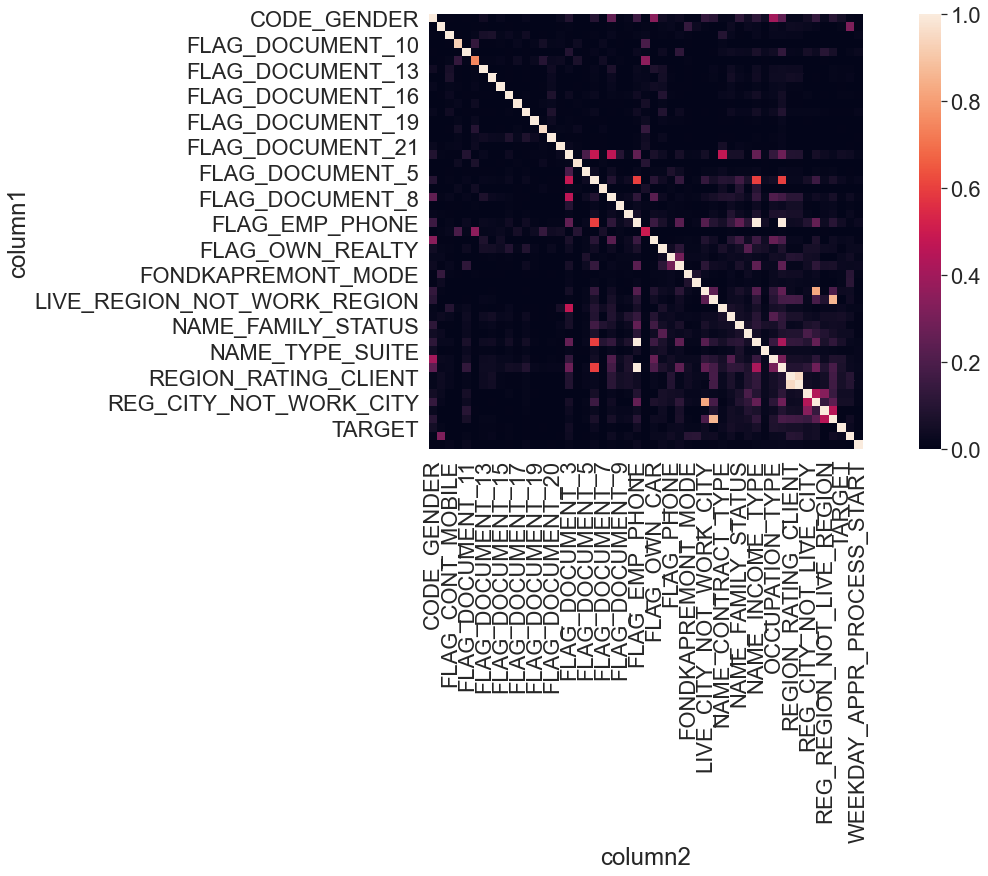

In [479]:
# refer - https://stackoverflow.com/questions/43330205/heatmap-from-columns-in-pandas-dataframe
piv = pd.pivot_table(categorical_correlation_results, values="corr_values",index=["column1"], columns=["column2"], fill_value=0)
#plot pivot table as heatmap using seaborn
ax = sns.heatmap(piv, square=True)

In [458]:
# Find highly correlated feature with Target

Target_corr = categorical_correlation_results[categorical_correlation_results['column1']=='TARGET']
print('Shape of target correlataion', Target_corr.shape)
Target_corr.sort_values('corr_values',ascending=False)

Shape of target correlataion (51, 3)


,column1,column2,corr_values
0,TARGET,TARGET,0.999978
44,TARGET,OCCUPATION_TYPE,0.081020
46,TARGET,ORGANIZATION_TYPE,0.071048
40,TARGET,NAME_INCOME_TYPE,0.063667
8,TARGET,REGION_RATING_CLIENT_W_CITY,0.060925
7,TARGET,REGION_RATING_CLIENT,0.058855
41,TARGET,NAME_EDUCATION_TYPE,0.057458
36,TARGET,CODE_GENDER,0.054661
13,TARGET,REG_CITY_NOT_WORK_CITY,0.050948
2,TARGET,FLAG_EMP_PHONE,0.045931


#### Observation -  Target features
OCCUPATION_TYPE, ORGANIZATION_TYPE, NAME_INCOME_TYPE, REG_CITY_NOT_WORK_CITY are some of the highest correlated categories with the TARGET variable. These maybe important in the classification task, and would need further EDA

In [474]:
### Finding correlation amon independent features, if features are highly correlated we can remove those features.
# Find highly correlated feature with Independent features

Independent_corr = categorical_correlation_results[categorical_correlation_results['column1']!='TARGET']
print('Shape of target correlataion', Independent_corr.shape)
Independent_corr.sort_values('corr_values',ascending=False)[:10]


Shape of target correlataion (2550, 3)


,column1,column2,corr_values
2080,NAME_INCOME_TYPE,NAME_INCOME_TYPE,1.0
2392,ORGANIZATION_TYPE,ORGANIZATION_TYPE,1.0
364,REGION_RATING_CLIENT,REGION_RATING_CLIENT,1.0
2340,WEEKDAY_APPR_PROCESS_START,WEEKDAY_APPR_PROCESS_START,1.0
2184,NAME_FAMILY_STATUS,NAME_FAMILY_STATUS,1.0
416,REGION_RATING_CLIENT_W_CITY,REGION_RATING_CLIENT_W_CITY,1.0
2236,NAME_HOUSING_TYPE,NAME_HOUSING_TYPE,1.0
2548,WALLSMATERIAL_MODE,WALLSMATERIAL_MODE,1.0
2444,FONDKAPREMONT_MODE,FONDKAPREMONT_MODE,1.0
1872,CODE_GENDER,CODE_GENDER,1.0


##### remove duplicate columns,
##### Eg:1
Col1 - FLAG_DOCUMENT_19
Col2 - FLAG_DOCUMENT_15
value - 0.02
##### Eg2
Col1 - FLAG_DOCUMENT_15
Col2 - FLAG_DOCUMENT_19
value - 0.02

both give same value inorder to remove duplicate 

In [475]:
Independent_corr['ordered-cols'] = Independent_corr.apply(lambda row: '-'.join(sorted([row.column1,row.column2])),axis=1)
print(Independent_corr.head())
Independent_corr = Independent_corr.drop_duplicates(['ordered-cols'])
Independent_corr.drop(['ordered-cols'], axis=1, inplace=True)
Independent_corr.reset_index(inplace=True, drop=True)
Independent_corr[(Independent_corr['column1'] != Independent_corr['column2'])].sort_values('corr_values',ascending=False)[:10]

       column1           column2  corr_values                 ordered-cols
51  FLAG_MOBIL            TARGET     0.002110            FLAG_MOBIL-TARGET
52  FLAG_MOBIL        FLAG_MOBIL     0.499996        FLAG_MOBIL-FLAG_MOBIL
53  FLAG_MOBIL    FLAG_EMP_PHONE     0.000000    FLAG_EMP_PHONE-FLAG_MOBIL
54  FLAG_MOBIL   FLAG_WORK_PHONE     0.000000   FLAG_MOBIL-FLAG_WORK_PHONE
55  FLAG_MOBIL  FLAG_CONT_MOBILE     0.020733  FLAG_CONT_MOBILE-FLAG_MOBIL


,column1,column2,corr_values
96,FLAG_EMP_PHONE,ORGANIZATION_TYPE,0.999777
90,FLAG_EMP_PHONE,NAME_INCOME_TYPE,0.999749
293,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,0.956529
425,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,0.860589
548,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,0.825564
787,FLAG_DOCUMENT_6,NAME_INCOME_TYPE,0.597899
793,FLAG_DOCUMENT_6,ORGANIZATION_TYPE,0.597779
69,FLAG_EMP_PHONE,FLAG_DOCUMENT_6,0.597715
664,FLAG_DOCUMENT_3,FLAG_DOCUMENT_6,0.486222
680,FLAG_DOCUMENT_3,NAME_CONTRACT_TYPE,0.479710


### Observation

<pre>

The highly correlated Independent features are:
1. NAME_INCOME_TYPE, ORGANIZATION_TYPE and FLAG_EMP_PHONE
2. REGION_RATING_CLIENT_W_CITY and REGION_RATING_CLIENT
3. LIVE_REGION_NOT_WORK_REGION and REG_REGION_NOT_WORK_REGION

</pre>

### Correlation - numeric Features

<pre>

Pick the numeric column, In our original dataframe we changed some of the numerical type column as categorical, so we need to skip those column

We have excluded the column SK_ID_CURR, as it does not have any relevance. This heatmap will help us identify the highly correlated numeric features and will also help us to identify features which are highly correlated with Target Variable.

</pre>

In [686]:
def pick_numerical(data=df, drop_column=None):
    Only_numeric = []
    for i in data.columns:
        if i not in drop_column:
            Only_numeric.append(i)
    return Only_numeric   

non_numeric_column = ['SK_ID_CURR','DAYS_EMPLOYED','DAYS_BIRTH'] + list(set(categorical_columns) - set(['TARGET']))
Numerical_column = pick_numerical(data=df,drop_column=non_numeric_column)
print('Numeric columns are listed below \n{}'.format(Numerical_column))

Numeric columns are listed below 
['TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'REGION_POPULATION_RELATIVE', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'CNT_FAM_MEMBERS', 'HOUR_APPR_PROCESS_START', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'ELEVATORS_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'FLOORSMIN_AVG', 'LANDAREA_AVG', 'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG', 'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG', 'APARTMENTS_MODE', 'BASEMENTAREA_MODE', 'YEARS_BEGINEXPLUATATION_MODE', 'YEARS_BUILD_MODE', 'COMMONAREA_MODE', 'ELEVATORS_MODE', 'ENTRANCES_MODE', 'FLOORSMAX_MODE', 'FLOORSMIN_MODE', 'LANDAREA_MODE', 'LIVINGAPARTMENTS_MODE', 'LIVINGAREA_MODE', 'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAREA_MODE', 'APARTMENTS_MEDI', 'BASEMENTAREA_MEDI', 'YEARS_BEGINEXPLUATATION_MEDI', 'YEARS_BUILD_MEDI', 'COMMONAREA_MEDI', 'ELEVAT

<AxesSubplot:>

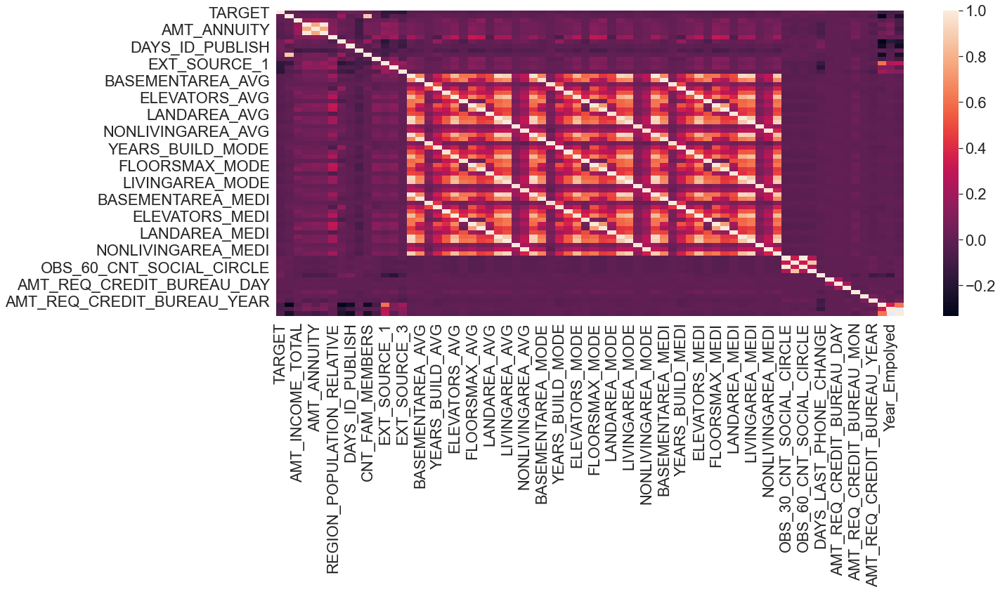

In [687]:
numeric_corr_values = df[Numerical_column].corr()
sns.heatmap(numeric_corr_values)

In [688]:
# To find the best best coorelataion results
def clean_num_corr(numeric_corr_values = numeric_corr_values):
    c = numeric_corr_values.abs()
    s = c.unstack()
    so = pd.DataFrame(s.sort_values(kind="quicksort", ascending=False))
    so = so[so.index.get_level_values(0) != so.index.get_level_values(1)]
    so = so.rename(columns={ so.columns[0]: "Correlation" })
    so.reset_index(inplace=True)
    so.columns = ['Col1', 'Col2', 'Correlation']
    so['ordered-cols'] = so.apply(lambda row: '-'.join(sorted([row.Col1,row.Col2])),axis=1)
    print('Shape of dataframe', so.shape)
    so = so.drop_duplicates(['ordered-cols'])
    print('Shape of dataframe after removal of duplicates', so.shape)
    so.drop(['ordered-cols'], axis=1, inplace=True)
    so.reset_index(inplace=True, drop=True)
    return so

In [689]:
so = clean_num_corr(numeric_corr_values = numeric_corr_values)

Shape of dataframe (5112, 4)
Shape of dataframe after removal of duplicates (2556, 4)


In [519]:
# Column which highly correlated with Target
numeric_target_corre = so[so['Col1']=='TARGET']
numeric_target_corre.head(10).sort_values('Correlation',ascending=False)

,Col1,Col2,Correlation
707,TARGET,EXT_SOURCE_2,0.160472
719,TARGET,EXT_SOURCE_1,0.155317
1137,TARGET,DAYS_LAST_PHONE_CHANGE,0.055218
1211,TARGET,FLOORSMAX_MEDI,0.043768
1214,TARGET,FLOORSMAX_MODE,0.043226
1248,TARGET,AMT_GOODS_PRICE,0.039645
1264,TARGET,OWN_CAR_AGE,0.037612
1270,TARGET,REGION_POPULATION_RELATIVE,0.037227
1314,TARGET,ELEVATORS_MEDI,0.033863
1332,TARGET,FLOORSMIN_MODE,0.032698


In [521]:
# Column which highly correlated with Target
numeric_independent_corre = so[so['Col1']!='TARGET']
numeric_independent_corre.head(20).sort_values('Correlation',ascending=False)

,Col1,Col2,Correlation
0,YEARS_BUILD_MEDI,YEARS_BUILD_AVG,0.998495
1,OBS_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,0.998490
2,FLOORSMIN_AVG,FLOORSMIN_MEDI,0.997241
3,FLOORSMAX_AVG,FLOORSMAX_MEDI,0.997034
4,ENTRANCES_MEDI,ENTRANCES_AVG,0.996886
5,ELEVATORS_AVG,ELEVATORS_MEDI,0.996099
6,COMMONAREA_MEDI,COMMONAREA_AVG,0.995978
7,LIVINGAREA_AVG,LIVINGAREA_MEDI,0.995596
8,APARTMENTS_AVG,APARTMENTS_MEDI,0.995081
9,BASEMENTAREA_AVG,BASEMENTAREA_MEDI,0.994317


### Observation
<pre>

1. The heatmap shows the correlation that each particular feature has with all other features. From the dark purplish color indicated no correlataion , In heatmap pretty much purplish color whcih indicates not that much correlated features. 
2. Aspart of features which highly with Target are EXT_SOURCE. These might be important for our classification task. 
3. For Independent features - mean median and mode to be correlated with each other.
Eg - LIVINGAREA_AVG	LIVINGAREA_MEDI
     YEARS_BUILD_MEDI	YEARS_BUILD_MODE   
4. AMT_CREDIT and AMT_GOODS_PRICE are also highly correlated. as per best approach we can remove the independent features which have correlated value greater than 0.8  
</pre>

# Bureau.csv

##### Description
<pre>
 
This table consists of all client's previous credit records with financial institutions other than Home Credit Group which were reported by the the Credit Bureau.

</pre>

In [526]:
print(df_bureau.info())
print('*'*100)
print(df_bureau.describe())
print('*'*100)
df_bureau.head(2)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1716428 entries, 0 to 1716427
Data columns (total 17 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_CURR              int64  
 1   SK_ID_BUREAU            int64  
 2   CREDIT_ACTIVE           object 
 3   CREDIT_CURRENCY         object 
 4   DAYS_CREDIT             int64  
 5   CREDIT_DAY_OVERDUE      int64  
 6   DAYS_CREDIT_ENDDATE     float64
 7   DAYS_ENDDATE_FACT       float64
 8   AMT_CREDIT_MAX_OVERDUE  float64
 9   CNT_CREDIT_PROLONG      int64  
 10  AMT_CREDIT_SUM          float64
 11  AMT_CREDIT_SUM_DEBT     float64
 12  AMT_CREDIT_SUM_LIMIT    float64
 13  AMT_CREDIT_SUM_OVERDUE  float64
 14  CREDIT_TYPE             object 
 15  DAYS_CREDIT_UPDATE      int64  
 16  AMT_ANNUITY             float64
dtypes: float64(8), int64(6), object(3)
memory usage: 222.6+ MB
None
****************************************************************************************************
         SK_ID

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN


In [555]:
print('Count of Current application in train', len(set(df.SK_ID_CURR.unique())))
print('Count of credit bureau client', len(set(df_bureau.SK_ID_BUREAU.unique())))
      
# Count of current applicant info we have in bureau
count_application_bureau = len(set(df.SK_ID_CURR.unique()).intersection(set(df_bureau.SK_ID_CURR.unique())))
print('Count of current applicant whose bureau info we have '+ str(count_application_bureau))

# Number applicant who apply first time
print('New applicant in train ', len(set(df.SK_ID_CURR.unique())) - count_application_bureau)

# Check duplicate entry in bureau.csv
duplicate_count  =  df_bureau.shape[0] - df_bureau.duplicated().shape[0]
print('Count of Duplicate count',duplicate_count)


Count of Current application in train 307511
Count of credit bureau client 1716428
Count of current applicant whose bureau info we have 263491
New applicant in train  44020
Count of Duplicate count 0


                          Total   Percent
AMT_ANNUITY             1226791  0.714735
AMT_CREDIT_MAX_OVERDUE  1124488  0.655133
DAYS_ENDDATE_FACT        633653  0.369170
AMT_CREDIT_SUM_LIMIT     591780  0.344774
AMT_CREDIT_SUM_DEBT      257669  0.150119


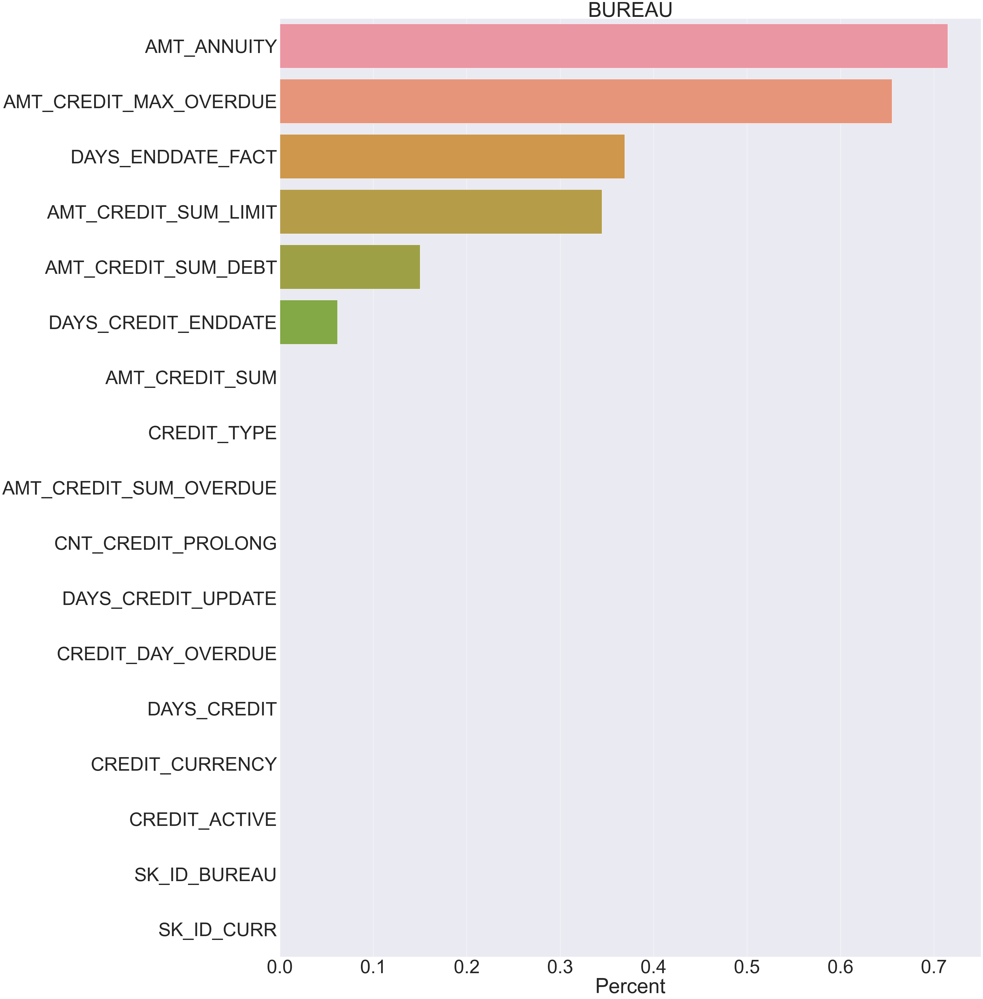

In [580]:
#Missing information
missing_value(df_bureau,df_name='BUREAU')

### Observation

<pre>
1. SK_ID_CURR is the loan ID of client's current loan with Home Credit.
2. SK_ID_BUREAU is the loan ID of the client's previous loan from other financial institutions. There may be multiple previous loans corresponding to a single SK_ID_CURR which depends on client's borrowing pattern. 
3. The rest of the features contain other features like DAYS_CREDIT, AMT_CREDIT_SUM etc
4. Out of 17 features, there are 7 features which contain NaN values, among the column AMT_ANNUITY which has over 70% missing values.

Note:
Count of Current application in train 307511
Count of credit bureau client 1716428
Count of current applicant whose bureau info we have 263491
New applicant in train  44020
Count of Duplicate count 0
</pre>

In [585]:
# Next to know the imporatances of bureau column, need to merge with application train
bureau_app_train_merged = df.iloc[:,:2].merge(df_bureau, on = 'SK_ID_CURR')
bureau_app_train_merged.head(3)


,SK_ID_CURR,TARGET,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,100002,1,6158904,Closed,currency 1,-1125,0,-1038.0,-1038.0,NaN,0,40761.0,NaN,NaN,0.0,Credit card,-1038,0.0
1,100002,1,6158905,Closed,currency 1,-476,0,NaN,-48.0,NaN,0,0.0,0.0,NaN,0.0,Credit card,-47,NaN
2,100002,1,6158906,Closed,currency 1,-1437,0,-1072.0,-1185.0,0.0,0,135000.0,0.0,0.0,0.0,Consumer credit,-1185,0.0


In [586]:
print("Bureau dataset: \n{}".format(df_bureau.dtypes.value_counts()))

Bureau dataset: 
float64    8
int64      6
object     3
dtype: int64


In [636]:
categorical_bureau = list(df_bureau.dtypes[df_bureau.dtypes == "object"].index)
print('Categorical Columns - '+str(categorical_bureau))
df_bureau[categorical_bureau].describe()

Categorical Columns - ['CREDIT_ACTIVE', 'CREDIT_CURRENCY', 'CREDIT_TYPE']


,CREDIT_ACTIVE,CREDIT_CURRENCY,CREDIT_TYPE
count,1716428,1716428,1716428
unique,4,4,15
top,Closed,currency 1,Consumer credit
freq,1079273,1715020,1251615


In [637]:
# Number of unique classes in Bureau category
bureau_data_type = df_bureau.select_dtypes('object').apply(pd.Series.nunique)
bureau_data_type

CREDIT_ACTIVE       4
CREDIT_CURRENCY     4
CREDIT_TYPE        15
dtype: int64

<Figure size 216x576 with 0 Axes>

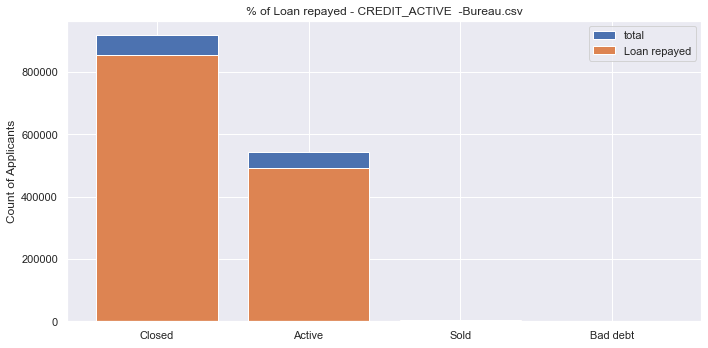

  CREDIT_ACTIVE  TARGET   total    Average
2        Closed  854124  917733  93.068899
0        Active  491583  541919  90.711527
3          Sold    5082    5653  89.899169
1      Bad debt      16      20  80.000000
  CREDIT_ACTIVE  TARGET   total    Average
2        Closed  854124  917733  93.068899
0        Active  491583  541919  90.711527
3          Sold    5082    5653  89.899169
1      Bad debt      16      20  80.000000


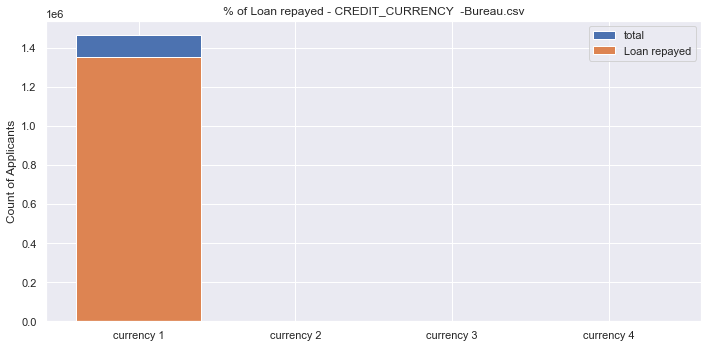

  CREDIT_CURRENCY   TARGET    total     Average
0      currency 1  1349640  1464094   92.182606
1      currency 2     1023     1072   95.429104
2      currency 3      133      150   88.666667
3      currency 4        9        9  100.000000
  CREDIT_CURRENCY   TARGET    total     Average
0      currency 1  1349640  1464094   92.182606
1      currency 2     1023     1072   95.429104
2      currency 3      133      150   88.666667
3      currency 4        9        9  100.000000


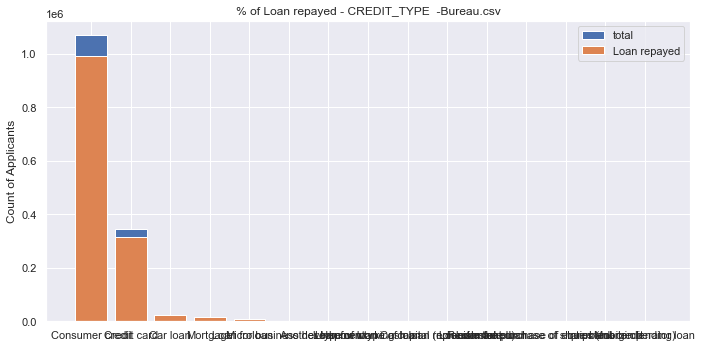

        CREDIT_TYPE  TARGET    total    Average
3   Consumer credit  989564  1069610  92.516338
4       Credit card  313591   343853  91.199146
1          Car loan   22433    23757  94.426906
12         Mortgage   14827    15607  95.002243
10        Microloan    7146     9005  79.355913
                                     CREDIT_TYPE  TARGET  total     Average
13                              Real estate loan      23     23  100.000000
8             Loan for the purchase of equipment      13     17   76.470588
7   Loan for purchase of shares (margin lending)       4      4  100.000000
5                               Interbank credit       1      1  100.000000
11                          Mobile operator loan       1      1  100.000000


In [718]:
sns.set(font_scale = 1)
plt.figure(figsize = (3,8))
univariate_barplots(bureau_app_train_merged, 'CREDIT_ACTIVE', 'TARGET', top=False,dataset_type='Bureau.csv')

univariate_barplots(bureau_app_train_merged, 'CREDIT_CURRENCY', 'TARGET', top=False,dataset_type='Bureau.csv')


univariate_barplots(bureau_app_train_merged, 'CREDIT_TYPE', 'TARGET', top=False,dataset_type='Bureau.csv')

### Observation

##### Credit Active
1. Non-Defaulter pretty much closed there previous record, which indicated client is good so there chance of loan approval is high.
2. Similiary, defaulters bad debt high. so clearly saying client who not paided correctly, chance of getting loan is very low

##### Credit Currency
if Currency type is Currency 4, chance of repaying loan is high

##### Credit type
Credit type is Real estate chance of paying loan is high , out of 23 people 23 people repaided.

In [638]:
# To find the correlation with Target Feature
categorical_bureau.append('TARGET')

In [650]:
Bureau_categorical_correlation_results = corr_categorical(data = bureau_app_train_merged, categorical = categorical_bureau)
Bureau_categorical_correlation_results.head(10)

4it [00:11,  2.81s/it]


,column1,column2,corr_values
0,CREDIT_ACTIVE,CREDIT_ACTIVE,1.000000
1,CREDIT_ACTIVE,CREDIT_CURRENCY,0.008482
2,CREDIT_ACTIVE,CREDIT_TYPE,0.240098
3,CREDIT_ACTIVE,TARGET,0.042690
4,CREDIT_CURRENCY,CREDIT_ACTIVE,0.008482
5,CREDIT_CURRENCY,CREDIT_CURRENCY,1.000000
6,CREDIT_CURRENCY,CREDIT_TYPE,0.043073
7,CREDIT_CURRENCY,TARGET,0.003306
8,CREDIT_TYPE,CREDIT_ACTIVE,0.240098
9,CREDIT_TYPE,CREDIT_CURRENCY,0.043073


In [652]:
# Category which is higly correlated with target 
Bureau_categorical_correlation_results_TARGET = Bureau_categorical_correlation_results[Bureau_categorical_correlation_results['column1']=='TARGET']
Bureau_categorical_correlation_results_TARGET.sort_values('corr_values',ascending=False)

,column1,column2,corr_values
15,TARGET,TARGET,0.999995
14,TARGET,CREDIT_TYPE,0.045533
12,TARGET,CREDIT_ACTIVE,0.042690
13,TARGET,CREDIT_CURRENCY,0.003306


#### Observation
CREDIT_CURRENCY not well correlated with target  even CREDIT_TYPE and CREIT_ACTIVE also not well.

In [663]:
# Category which is higly correlated with Indepndent 
Bureau_categorical_correlation_results_Ind = Bureau_categorical_correlation_results[Bureau_categorical_correlation_results['column1']!='TARGET']
Bureau_categorical_correlation_results_Ind.sort_values('corr_values',ascending=False)
Bureau_categorical_correlation_results_Ind['ordered-cols'] = Bureau_categorical_correlation_results_Ind.apply(lambda row: '-'.join(sorted([row.column1,row.column2])),axis=1)
Bureau_categorical_correlation_results_Ind = Bureau_categorical_correlation_results_Ind.drop_duplicates(['ordered-cols'])
Bureau_categorical_correlation_results_Ind.drop(['ordered-cols'], axis=1, inplace=True)
Bureau_categorical_correlation_results_Ind.reset_index(inplace=True, drop=True)
Bureau_categorical_correlation_results_Ind.sort_values('corr_values',ascending=False)


,column1,column2,corr_values
0,CREDIT_ACTIVE,CREDIT_ACTIVE,1.000000
4,CREDIT_CURRENCY,CREDIT_CURRENCY,1.000000
7,CREDIT_TYPE,CREDIT_TYPE,1.000000
2,CREDIT_ACTIVE,CREDIT_TYPE,0.240098
8,CREDIT_TYPE,TARGET,0.045533
5,CREDIT_CURRENCY,CREDIT_TYPE,0.043073
3,CREDIT_ACTIVE,TARGET,0.042690
1,CREDIT_ACTIVE,CREDIT_CURRENCY,0.008482
6,CREDIT_CURRENCY,TARGET,0.003306


#### Observation
CREDIT_ACTIVE and CREDIT_TYPE have some correleation

### Numeric Feature -  BUREAU.csv

In [693]:
non_numeric_column = ['SK_ID_CURR','SK_ID_BUREAU'] + categorical_bureau
Numerical_column = pick_numerical(data=bureau_app_train_merged,drop_column=non_numeric_column)
print('Numeric columns are listed below \n{}'.format(Numerical_column))

Numeric columns are listed below 
['DAYS_CREDIT', 'CREDIT_DAY_OVERDUE', 'DAYS_CREDIT_ENDDATE', 'DAYS_ENDDATE_FACT', 'AMT_CREDIT_MAX_OVERDUE', 'CNT_CREDIT_PROLONG', 'AMT_CREDIT_SUM', 'AMT_CREDIT_SUM_DEBT', 'AMT_CREDIT_SUM_LIMIT', 'AMT_CREDIT_SUM_OVERDUE', 'DAYS_CREDIT_UPDATE', 'AMT_ANNUITY']


Text(0.5, 1.0, 'Bureau Numerical features Correlation')

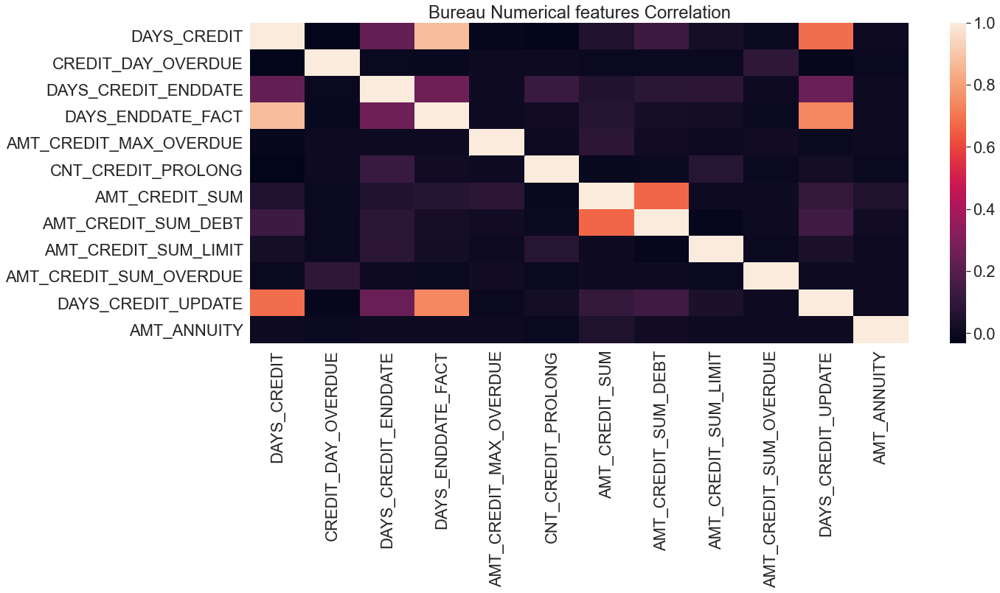

In [702]:
numeric_corr_values = bureau_app_train_merged[Numerical_column].corr()
sns.set(font_scale = 2)
sns.heatmap(numeric_corr_values,annot=False)
plt.title('Bureau Numerical features Correlation')

In [698]:
Numeric_corr_bureau = clean_num_corr(numeric_corr_values= numeric_corr_values)

Shape of dataframe (132, 4)
Shape of dataframe after removal of duplicates (66, 4)


In [699]:
Numeric_corr_bureau.head(5)

,Col1,Col2,Correlation
0,DAYS_ENDDATE_FACT,DAYS_CREDIT,0.875291
1,DAYS_ENDDATE_FACT,DAYS_CREDIT_UPDATE,0.745192
2,DAYS_CREDIT_UPDATE,DAYS_CREDIT,0.683189
3,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,0.667766
4,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,0.254893


In [720]:
# Column which highly correlated with Independent
Numeric_corr_bureau.head(10).sort_values('Correlation',ascending=False)

,Col1,Col2,Correlation
0,DAYS_ENDDATE_FACT,DAYS_CREDIT,0.875291
1,DAYS_ENDDATE_FACT,DAYS_CREDIT_UPDATE,0.745192
2,DAYS_CREDIT_UPDATE,DAYS_CREDIT,0.683189
3,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,0.667766
4,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,0.254893
5,DAYS_CREDIT_UPDATE,DAYS_CREDIT_ENDDATE,0.247783
6,DAYS_CREDIT,DAYS_CREDIT_ENDDATE,0.231075
7,AMT_CREDIT_SUM_DEBT,DAYS_CREDIT_UPDATE,0.139080
8,DAYS_CREDIT,AMT_CREDIT_SUM_DEBT,0.136678
9,CNT_CREDIT_PROLONG,DAYS_CREDIT_ENDDATE,0.122179


#### Observation
The highly correlated Independent features are:
1. DAYS_ENDDATE_FACT and DAYS_CREDIT    
2. DAYS_ENDDATE_FACT and DAYS_CREDIT_UPDATE
3. AMT_CREDIT_SUM and AMT_CREDIT_SUM_DEBT
4. DAYS_CREDIT and DAYS_CREDIT_UPDATE

###### DAYS_CREDIT  - Bureau.csv
<pre>
How many days before current application when the client applied for Credit Bureau Credit.
</pre>

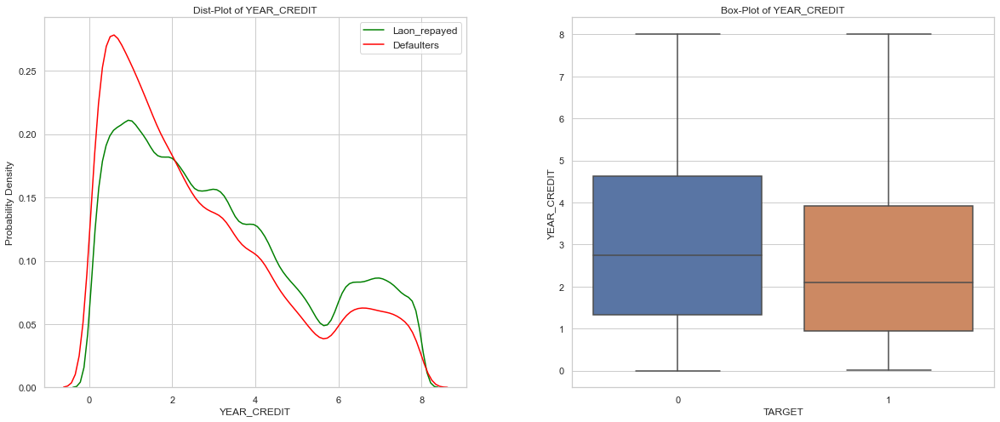

In [725]:
# Days_credit is in days, for easy interpretation we converting into days 
bureau_app_train_merged['YEAR_CREDIT'] = bureau_app_train_merged['DAYS_CREDIT']/-365
plot_continuous_variables(bureau_app_train_merged,'YEAR_CREDIT',plots=['distplot','box'])

#### Observation
1. There is no outliers, defaulter have less year compare to Non-defaulter
2. from PDF, defaulter peak is high when year is lesser

###### DAYS_CREDIT_ENDDATE  - Bureau.csv

<pre>
Remaining duration of CB credit (in days) at the time of application in Home Credit

</pre>

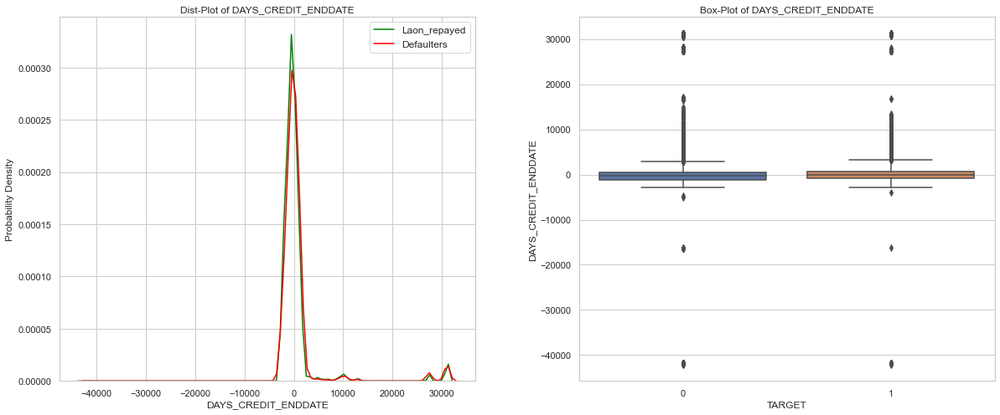

In [742]:
bureau_app_train_merged['YEAR_CREDIT_ENDDATE'] = bureau_app_train_merged['DAYS_CREDIT_ENDDATE']/365
plot_continuous_variables(bureau_app_train_merged,'DAYS_CREDIT_ENDDATE',plots=['distplot','box'])

#### Observation

Frome box plot for both defaulter and Non-defaulter , there seems to be erroneous value for DAYS_CREDIT_ENDDATE, days value back around 120 years. This does not make much sense as this implies that the previous loan the client had dates back to 120 years ago. which definetely incorrect value

###### DAYS_ENDDATE_FACT Bureau.csv
<pre>
Column tells about the the number of days ago that the Credit Bureau credit had ended at the time of application for loan in Home Credit, These values are only for Closed Credits.
</pre>

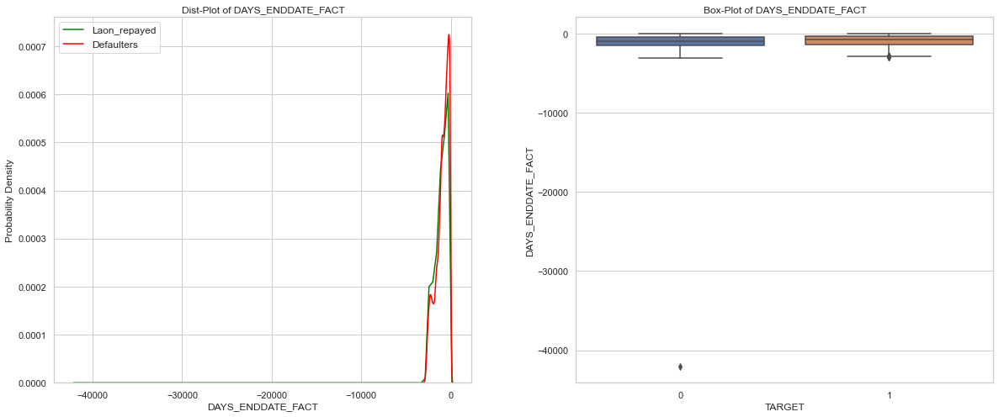

In [743]:
bureau_app_train_merged['YEARS_ENDDATE_FACT'] = bureau_app_train_merged['DAYS_ENDDATE_FACT']/365
plot_continuous_variables(bureau_app_train_merged,'DAYS_ENDDATE_FACT',plots=['distplot','box'])

#### Observation
Similar to DAYS CREDIT END we have error value 116 years in DAYS_ENDDATE_FACT, better removing this value will make sense 

##### DAYS_CREDIT_UPDATE -  Bureau.csv
<pre>
Column tells about the the number of days ago that the information from Credit Bureau credit had come at the time of application for loan in Home Credit.
</pre>

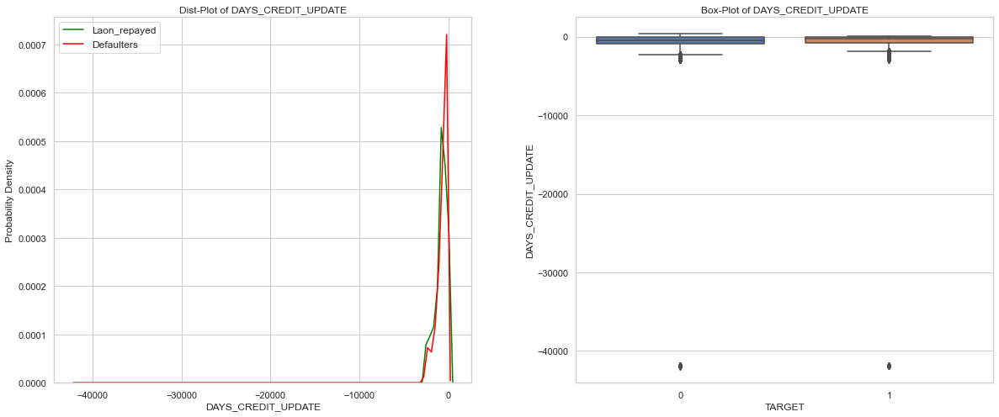

In [744]:
bureau_app_train_merged['YEARS_CREDIT_UPDATE'] = bureau_app_train_merged['DAYS_CREDIT_UPDATE']/365
plot_continuous_variables(bureau_app_train_merged,'DAYS_CREDIT_UPDATE',plots=['distplot','box'])

#### Observation
Similar to DAYS CREDIT END we have error value 116 years in DAYS_CREDIT_UPDATE, better removing this value will make sense 
and Defaulters tend to have a lesser number of days since their Information about the Credit Bureau update were received


### Bureau_balance.csv 
<pre>
•	Monthly balances of earlier loans in the Credit Bureau.
•	This table has one row for each month of the history of every previous loan reported to the Credit Bureau.
</pre>


In [745]:
df_bureau_bal.head(2)

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C


In [750]:
print('Length of Unique ID ', str(len(df_bureau_bal.SK_ID_BUREAU.value_counts())))
print('*'*50)
print(df_bureau_bal.shape)
print('*'*50)
print('Unique Category in Status column', df_bureau_bal.STATUS.value_counts())
print('*'*50)
print('Length of Unique Category ', str(len(df_bureau_bal.STATUS.value_counts())))


Length of Unique ID  817395
**************************************************
(27299925, 3)
**************************************************
Unique Category in Status column C    13646993
0     7499507
X     5810482
1      242347
5       62406
2       23419
3        8924
4        5847
Name: STATUS, dtype: int64
**************************************************
Length of Unique Category  8


### Observation
<pre>
1. Lenth is 27299925 records
2. Unique ID 817395
3. 8 unique categories in status column

C means closed,
X means status unknown, 
0 means no DPD,
1 means maximal did during month between 1-30, 
2 means DPD 31-60,… 
5 means DPD 120+ or sold or written off.

DPD - Days Past Due

Note- We already said this dataset doensnt have null value

</pre>

## PREVIOUS_APPLICATIONS.csv
<pre>
The table contains the static data of the previous loan which the client had with Home Credit.
</pre>

In [751]:
df_prev_app.head(2)

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0


In [754]:
print('Shape of Previous application', df_prev_app.shape)
print('Count of Current application in train', len(set(df.SK_ID_CURR.unique())))
print('Count of Unique Previous loan ID', len(set(df_prev_app.SK_ID_PREV.unique())))
      
# Count of current applicant info we have in bureau
count_application_preapp = len(set(df.SK_ID_CURR.unique()).intersection(set(df_prev_app.SK_ID_CURR.unique())))
print('Count of current applicant who already got from Home Credit '+ str(count_application_bureau))

# Number applicant who apply first time
print('New applicant in train who apply loan for first time Home credit ', len(set(df.SK_ID_CURR.unique())) - count_application_bureau)

# Check duplicate entry in bureau.csv
duplicate_count  =  df_prev_app.shape[0] - df_prev_app.duplicated().shape[0]
print('Count of Duplicate count',duplicate_count)

Shape of Previous application (1670214, 37)
Count of Current application in train 307511
Count of Unique Previous loan ID 1670214
Count of current applicant who already got from Home Credit 263491
New applicant in train who apply loan for first time Home credit  44020
Count of Duplicate count 0


### Observation
<pre>
Each row corresponds to each of the previous loan that the client had with previously with Home Credit Group. It is possible for a single client of current application to have multiple previous loans with Home Credit Group.

total count of data - 1.6 Million
Count of current applicant who already got from Home Credit 263491
New applicant in train who apply loan for first time Home credit  44020



</pre>

                            Total   Percent
RATE_INTEREST_PRIVILEGED  1664263  0.996437
RATE_INTEREST_PRIMARY     1664263  0.996437
RATE_DOWN_PAYMENT          895844  0.536365
AMT_DOWN_PAYMENT           895844  0.536365
NAME_TYPE_SUITE            820405  0.491198


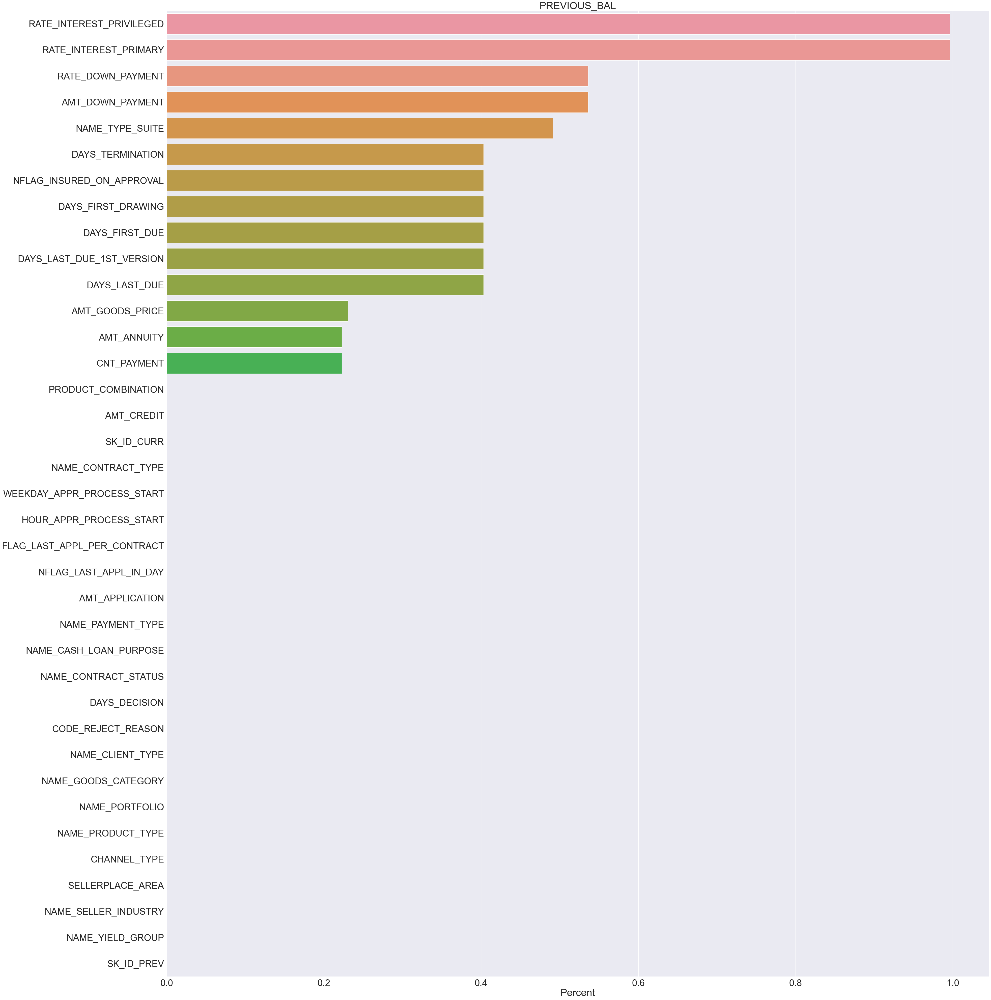

In [755]:
# Missing value deatils
# df_prev_app.csv
missing_value(df_prev_app,df_name='PREVIOUS_BAL')

### Observation
<pre>
1. Almost 50 percentage column having missing values 
2.  RATE_INTEREST_PRIVILEGED  1664263  0.996437
    RATE_INTEREST_PRIMARY     1664263  0.996437, those 2 columns 99 percentage missing values which is really high.
3. Remaining columns are also 50 percentage empty 
</pre>

In [756]:
# Next to know the imporatances of Previous loan application column, need to merge with application train
pre_app_train_merged = df.iloc[:,:2].merge(df_prev_app, on = 'SK_ID_CURR')
pre_app_train_merged.head(3)

,SK_ID_CURR,TARGET,SK_ID_PREV,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,100002,1,1038818,Consumer loans,9251.775,179055.0,179055.0,0.0,179055.0,SATURDAY,...,Auto technology,24.0,low_normal,POS other with interest,365243.0,-565.0,125.0,-25.0,-17.0,0.0
1,100003,0,1810518,Cash loans,98356.995,900000.0,1035882.0,NaN,900000.0,FRIDAY,...,XNA,12.0,low_normal,Cash X-Sell: low,365243.0,-716.0,-386.0,-536.0,-527.0,1.0
2,100003,0,2636178,Consumer loans,64567.665,337500.0,348637.5,0.0,337500.0,SUNDAY,...,Furniture,6.0,middle,POS industry with interest,365243.0,-797.0,-647.0,-647.0,-639.0,0.0


In [757]:
print(pre_app_train_merged.shape)
print("Previous applications dataset: \n{}".format(df_prev_app.dtypes.value_counts()))


(1413701, 38)
Previous applications dataset: 
object     16
float64    15
int64       6
dtype: int64


In [759]:
categorical_preapp= list(df_prev_app.dtypes[df_prev_app.dtypes == "object"].index)
print('Categorical Columns - '+str(categorical_preapp))
df_prev_app[categorical_preapp].describe()

Categorical Columns - ['NAME_CONTRACT_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'FLAG_LAST_APPL_PER_CONTRACT', 'NAME_CASH_LOAN_PURPOSE', 'NAME_CONTRACT_STATUS', 'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON', 'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE', 'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE', 'CHANNEL_TYPE', 'NAME_SELLER_INDUSTRY', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION']


,NAME_CONTRACT_TYPE,WEEKDAY_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,NAME_SELLER_INDUSTRY,NAME_YIELD_GROUP,PRODUCT_COMBINATION
count,1670214,1670214,1670214,1670214,1670214,1670214,1670214,849809,1670214,1670214,1670214,1670214,1670214,1670214,1670214,1669868
unique,4,7,2,25,4,4,9,7,4,28,5,3,8,11,5,17
top,Cash loans,TUESDAY,Y,XAP,Approved,Cash through the bank,XAP,Unaccompanied,Repeater,XNA,POS,XNA,Credit and cash offices,XNA,XNA,Cash
freq,747553,255118,1661739,922661,1036781,1033552,1353093,508970,1231261,950809,691011,1063666,719968,855720,517215,285990


In [760]:
# Number of unique classes in previous application category
preapp_type = df_prev_app.select_dtypes('object').apply(pd.Series.nunique)
preapp_type

NAME_CONTRACT_TYPE              4
WEEKDAY_APPR_PROCESS_START      7
FLAG_LAST_APPL_PER_CONTRACT     2
NAME_CASH_LOAN_PURPOSE         25
NAME_CONTRACT_STATUS            4
NAME_PAYMENT_TYPE               4
CODE_REJECT_REASON              9
NAME_TYPE_SUITE                 7
NAME_CLIENT_TYPE                4
NAME_GOODS_CATEGORY            28
NAME_PORTFOLIO                  5
NAME_PRODUCT_TYPE               3
CHANNEL_TYPE                    8
NAME_SELLER_INDUSTRY           11
NAME_YIELD_GROUP                5
PRODUCT_COMBINATION            17
dtype: int64

In [761]:
# To find the correlation with Target Feature
categorical_preapp.append('TARGET')

In [762]:
# Categorical correlation
preapp_categorical_correlation_results = corr_categorical(data = pre_app_train_merged, categorical = categorical_preapp)
preapp_categorical_correlation_results.head(10)

17it [02:35,  9.14s/it]


,column1,column2,corr_values
0,NAME_CONTRACT_TYPE,NAME_CONTRACT_TYPE,1.000000
1,NAME_CONTRACT_TYPE,WEEKDAY_APPR_PROCESS_START,0.109070
2,NAME_CONTRACT_TYPE,FLAG_LAST_APPL_PER_CONTRACT,0.200769
3,NAME_CONTRACT_TYPE,NAME_CASH_LOAN_PURPOSE,0.577336
4,NAME_CONTRACT_TYPE,NAME_CONTRACT_STATUS,0.295344
5,NAME_CONTRACT_TYPE,NAME_PAYMENT_TYPE,0.328072
6,NAME_CONTRACT_TYPE,CODE_REJECT_REASON,0.167487
7,NAME_CONTRACT_TYPE,NAME_TYPE_SUITE,0.252332
8,NAME_CONTRACT_TYPE,NAME_CLIENT_TYPE,0.254848
9,NAME_CONTRACT_TYPE,NAME_GOODS_CATEGORY,0.569422


In [763]:
# Category which is higly correlated with target 
preapp_categorical_correlation_results_TARGET = preapp_categorical_correlation_results[preapp_categorical_correlation_results['column1']=='TARGET']
preapp_categorical_correlation_results_TARGET.sort_values('corr_values',ascending=False)

,column1,column2,corr_values
288,TARGET,TARGET,0.999996
278,TARGET,CODE_REJECT_REASON,0.062701
276,TARGET,NAME_CONTRACT_STATUS,0.058450
287,TARGET,PRODUCT_COMBINATION,0.057276
283,TARGET,NAME_PRODUCT_TYPE,0.043026
286,TARGET,NAME_YIELD_GROUP,0.042372
284,TARGET,CHANNEL_TYPE,0.037752
281,TARGET,NAME_GOODS_CATEGORY,0.036892
285,TARGET,NAME_SELLER_INDUSTRY,0.036464
275,TARGET,NAME_CASH_LOAN_PURPOSE,0.034825


#### Observation

<pre>
we see that the features NAME_CONTRACT_STATUS, PRODUCT_COMBINATION, CODE_REJECT_REASON are some of the highest associated features TARGET
</pre>

In [769]:
# Category which is higly correlated with Indepndent 
preapp_categorical_correlation_results_Ind = preapp_categorical_correlation_results[preapp_categorical_correlation_results['column1']!='TARGET']
preapp_categorical_correlation_results_Ind.sort_values('corr_values',ascending=False)
preapp_categorical_correlation_results_Ind['ordered-cols'] = preapp_categorical_correlation_results_Ind.apply(lambda row: '-'.join(sorted([row.column1,row.column2])),axis=1)
preapp_categorical_correlation_results_Ind = preapp_categorical_correlation_results_Ind.drop_duplicates(['ordered-cols'])
preapp_categorical_correlation_results_Ind.drop(['ordered-cols'], axis=1, inplace=True)
preapp_categorical_correlation_results_Ind.reset_index(inplace=True, drop=True)
preapp_categorical_correlation_results_Ind.sort_values('corr_values',ascending=False).head(20)
preapp_categorical_correlation_results_Ind[preapp_categorical_correlation_results_Ind['column1'] != preapp_categorical_correlation_results_Ind['column2']].sort_values(by='corr_values',ascending=False).head(20)

,column1,column2,corr_values
15,NAME_CONTRACT_TYPE,PRODUCT_COMBINATION,0.999995
136,NAME_PRODUCT_TYPE,PRODUCT_COMBINATION,0.887615
64,NAME_CONTRACT_STATUS,CODE_REJECT_REASON,0.816485
130,NAME_PORTFOLIO,PRODUCT_COMBINATION,0.805962
148,NAME_YIELD_GROUP,PRODUCT_COMBINATION,0.762479
10,NAME_CONTRACT_TYPE,NAME_PORTFOLIO,0.742478
121,NAME_GOODS_CATEGORY,NAME_SELLER_INDUSTRY,0.723509
126,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,0.713008
127,NAME_PORTFOLIO,CHANNEL_TYPE,0.654470
3,NAME_CONTRACT_TYPE,NAME_CASH_LOAN_PURPOSE,0.577336


### Observation
<pre>
1. NAME_CONTRACT_TYPE,NAME_PRODUCT_TYPE,NAME_PORTFOLIO and NAME_YIELD_GROUP are hoghly correalted with PRODUCT_COMBINATION
2. NAME_CONTRACT_STATUS highly correlated with CODE_REJECT_REASON
3. NAME_CONTRACT_TYPE and NAME_PORTFOLIO -  Correlated
4. NAME_GOODS_CATEGORY and NAME_SELLER_INDUSTRY -  Correlated
</pre>

### Numeric - Previous applications

In [770]:
non_numeric_column = ['SK_ID_CURR','SK_ID_PREV'] + categorical_preapp
Numerical_column = pick_numerical(data=pre_app_train_merged,drop_column=non_numeric_column)
print('Numeric columns are listed below \n{}'.format(Numerical_column))

Numeric columns are listed below 
['AMT_ANNUITY', 'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE', 'HOUR_APPR_PROCESS_START', 'NFLAG_LAST_APPL_IN_DAY', 'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY', 'RATE_INTEREST_PRIVILEGED', 'DAYS_DECISION', 'SELLERPLACE_AREA', 'CNT_PAYMENT', 'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL']


Text(0.5, 1.0, 'Previous application Numerical features Correlation')

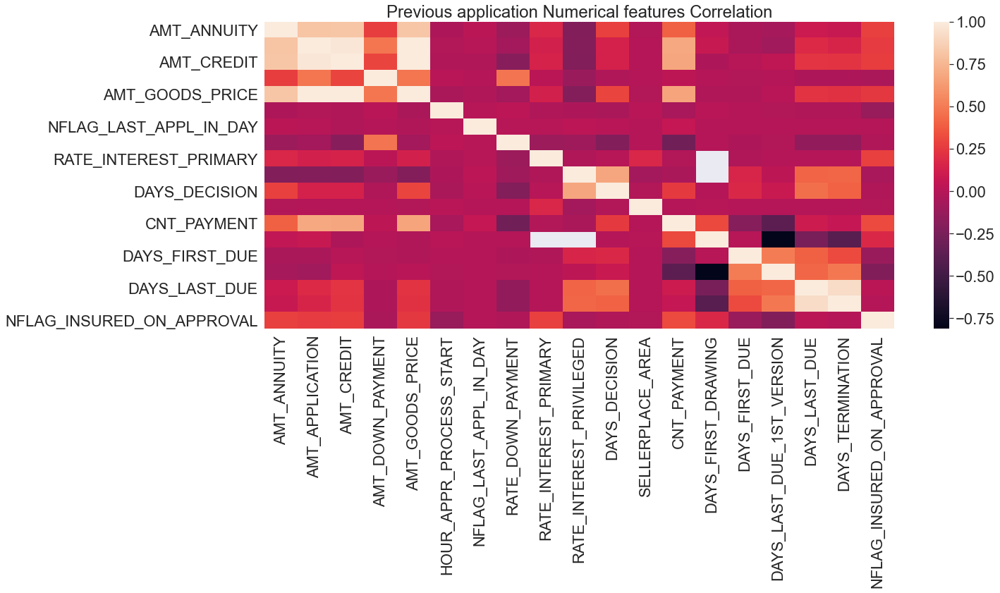

In [773]:
numeric_corr_values = pre_app_train_merged[Numerical_column].corr()
sns.set(font_scale = 2)
sns.heatmap(numeric_corr_values,annot=False)
plt.title('Previous application Numerical features Correlation')

In [774]:
Numeric_corr_PREAPP = clean_num_corr(numeric_corr_values= numeric_corr_values)

Shape of dataframe (342, 4)
Shape of dataframe after removal of duplicates (171, 4)


In [775]:
Numeric_corr_PREAPP.head(5)

,Col1,Col2,Correlation
0,AMT_APPLICATION,AMT_GOODS_PRICE,0.999871
1,AMT_CREDIT,AMT_GOODS_PRICE,0.993201
2,AMT_CREDIT,AMT_APPLICATION,0.975683
3,DAYS_TERMINATION,DAYS_LAST_DUE,0.927741
4,AMT_ANNUITY,AMT_GOODS_PRICE,0.822204


In [776]:
# Column which highly correlated with Independent
Numeric_corr_PREAPP.head(10).sort_values('Correlation',ascending=False)

,Col1,Col2,Correlation
0,AMT_APPLICATION,AMT_GOODS_PRICE,0.999871
1,AMT_CREDIT,AMT_GOODS_PRICE,0.993201
2,AMT_CREDIT,AMT_APPLICATION,0.975683
3,DAYS_TERMINATION,DAYS_LAST_DUE,0.927741
4,AMT_ANNUITY,AMT_GOODS_PRICE,0.822204
5,AMT_CREDIT,AMT_ANNUITY,0.817977
6,AMT_ANNUITY,AMT_APPLICATION,0.809972
7,DAYS_LAST_DUE_1ST_VERSION,DAYS_FIRST_DRAWING,0.809046
8,CNT_PAYMENT,AMT_APPLICATION,0.683056
9,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,0.677183


#### Observation
Highly Correlated Numeric features are
1. AMT_GOODS_PRICE highly correalted with AMT_APPLICATION , AMT_ANNUITY and AMT_CREDIT
2. DAYS_TERMINATION correlated with DAYS_LAST_DUE
3. DAYS_LAST_DUE_1ST_VERSION correlated with DAYS_FIRST_DRAWING


In [778]:
Numerical_column

['AMT_ANNUITY',
 'AMT_APPLICATION',
 'AMT_CREDIT',
 'AMT_DOWN_PAYMENT',
 'AMT_GOODS_PRICE',
 'HOUR_APPR_PROCESS_START',
 'NFLAG_LAST_APPL_IN_DAY',
 'RATE_DOWN_PAYMENT',
 'RATE_INTEREST_PRIMARY',
 'RATE_INTEREST_PRIVILEGED',
 'DAYS_DECISION',
 'SELLERPLACE_AREA',
 'CNT_PAYMENT',
 'DAYS_FIRST_DRAWING',
 'DAYS_FIRST_DUE',
 'DAYS_LAST_DUE_1ST_VERSION',
 'DAYS_LAST_DUE',
 'DAYS_TERMINATION',
 'NFLAG_INSURED_ON_APPROVAL']

In [809]:
'''
In statistics, percentiles are used to understand and interpret data. 
The nth percentile of a set of data is the value at which n percent of the data is below it.
'''
def check_errorness(data=df, col = 'column_name', drop_na =True,start= 0, end=100, increment = 1):
    '''
    Parameters
        data  -  Dataframe 
        Col   -  Column name
        drop_na -  Include Null value are not
        start - starting value of percentile
        end -  end value
        increment - increment range 
    '''
    
    print(col)
    if drop_na:
        print('Percentile from 0 to 100 with increment of {} for column {} '.format(increment,col))
        per = np.percentile(data[col].dropna(),range(start,end,increment))
    else:  
        per = np.percentile(data[col],range(start,end,increment))
    print(per)

for i in Numerical_column:  
    check_errorness(data=pre_app_train_merged,col=i,increment = 5)
    print('*'*50)


AMT_ANNUITY
Percentile from 0 to 100 with increment of 5 for column AMT_ANNUITY 
[    0.      2731.05    3790.989   4554.765   5411.655   6257.8575
  7016.355   8004.9015  9000.     10006.2    11223.765  12309.993
 13692.825  15539.904  17608.5    20420.775  23390.64   27683.37
 34423.11   45205.605 ]
**************************************************
AMT_APPLICATION
Percentile from 0 to 100 with increment of 5 for column AMT_APPLICATION 
[     0.        0.        0.        0.        0.    19750.5   29556.
  39757.5   45000.    58459.05  70870.5   89545.5  103500.   125955.
 143909.1  180000.   225000.   318978.   450000.   805500.  ]
**************************************************
AMT_CREDIT
Percentile from 0 to 100 with increment of 5 for column AMT_CREDIT 
[     0.        0.        0.        0.    14593.5   24880.5   34303.5
  45000.    52128.    66244.5   80595.    95940.   115822.8  136728.
 167027.85 215640.   270000.   382500.   533160.   893398.5 ]
**************************

### Observation
<pre>
1. DAYS_FIRST_DUE, DAYS_LAST_DUE_1ST_VERSION and DAYS_LAST_DUE are having high error values, These columns also decribe about the number of days ago from the current application that certain activities happened.
</pre>

## Installments_payments.csv 
<pre>
The repayment history of each of the loan that the applicant had with Home Credit Group
</pre>

In [812]:
print(df_inst_pay.info())
print('*'*100)
print(df_inst_pay.describe())
print('*'*100)
df_inst_pay.head(2)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13605401 entries, 0 to 13605400
Data columns (total 8 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_PREV              int64  
 1   SK_ID_CURR              int64  
 2   NUM_INSTALMENT_VERSION  float64
 3   NUM_INSTALMENT_NUMBER   int64  
 4   DAYS_INSTALMENT         float64
 5   DAYS_ENTRY_PAYMENT      float64
 6   AMT_INSTALMENT          float64
 7   AMT_PAYMENT             float64
dtypes: float64(5), int64(3)
memory usage: 830.4 MB
None
****************************************************************************************************
         SK_ID_PREV    SK_ID_CURR  NUM_INSTALMENT_VERSION  \
count  1.360540e+07  1.360540e+07            1.360540e+07   
mean   1.903365e+06  2.784449e+05            8.566373e-01   
std    5.362029e+05  1.027183e+05            1.035216e+00   
min    1.000001e+06  1.000010e+05            0.000000e+00   
25%    1.434191e+06  1.896390e+05            0.000000

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525


In [814]:
print('Count of Current application in train', len(set(df.SK_ID_CURR.unique())))      
# Count of existing clients
count_application_Instapay = len(set(df.SK_ID_CURR.unique()).intersection(set(df_inst_pay.SK_ID_CURR.unique())))
print('Count of current applicant who already got loan from Home credit '+ str(count_application_Instapay))

# Number applicant who apply first time
print('New applicant in train ', len(set(df.SK_ID_CURR.unique())) - count_application_Instapay)

# Check duplicate entry in bureau.csv
duplicate_count  =  df_inst_pay.shape[0] - df_inst_pay.duplicated().shape[0]
print('Count of Duplicate count',duplicate_count)


Count of Current application in train 307511
Count of current applicant who already got loan from Home credit 291643
New applicant in train  15868
Count of Duplicate count 0


                       Total   Percent
AMT_PAYMENT             2905  0.000214
DAYS_ENTRY_PAYMENT      2905  0.000214
AMT_INSTALMENT             0  0.000000
DAYS_INSTALMENT            0  0.000000
NUM_INSTALMENT_NUMBER      0  0.000000


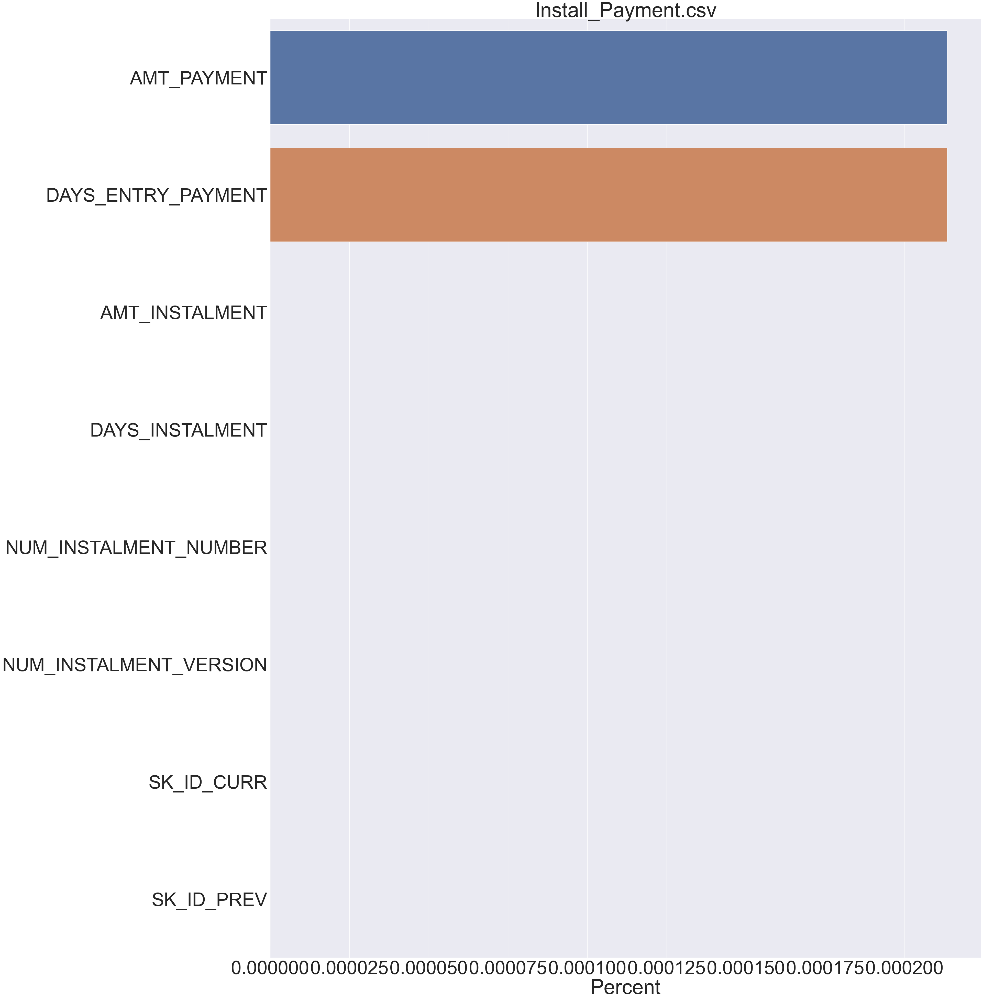

In [815]:
#Missing information
missing_value(df_inst_pay,df_name='Install_Payment.csv')

#### OBSERVATION
There is no much missing value

In [831]:
# Next to know the imporatances of Precious installment column, need to merge with application train
inspay_app_train_merged = df.iloc[:,:2].merge(df_inst_pay, on = 'SK_ID_CURR')
print(inspay_app_train_merged.shape)
inspay_app_train_merged.head(3)

(11591592, 9)


,SK_ID_CURR,TARGET,SK_ID_PREV,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,100002,1,1038818,1.0,16,-115.0,-133.0,9251.775,9251.775
1,100002,1,1038818,1.0,8,-355.0,-375.0,9251.775,9251.775
2,100002,1,1038818,2.0,19,-25.0,-49.0,53093.745,53093.745


In [817]:
print("Install payment dataset: \n{}".format(df_inst_pay.dtypes.value_counts()))

Install payment dataset: 
float64    5
int64      3
dtype: int64


Text(0.5, 1.0, 'Install payment Numerical features Correlation')

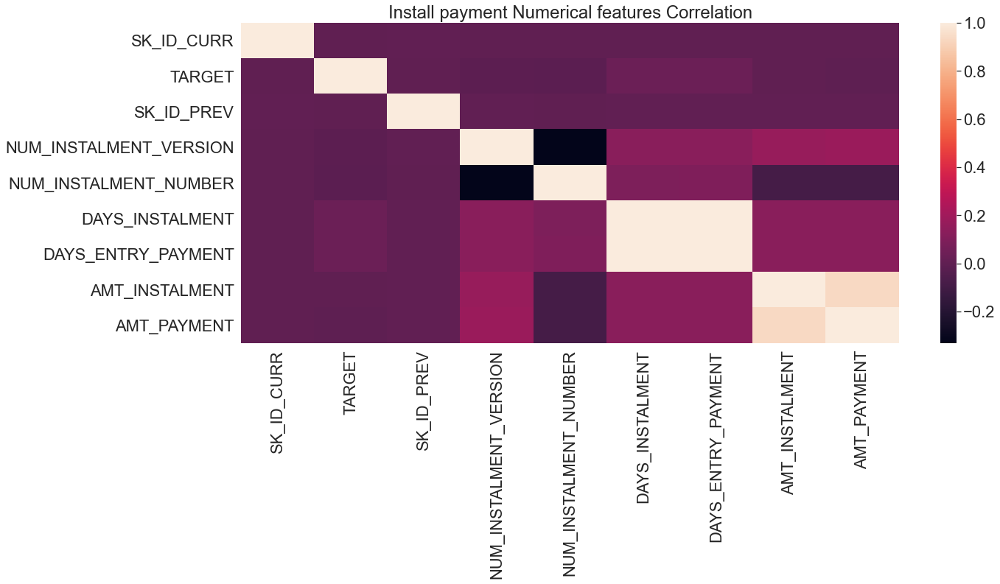

In [818]:
numeric_corr_values = inspay_app_train_merged.corr()
sns.set(font_scale = 2)
sns.heatmap(numeric_corr_values,annot=False)
plt.title('Install payment Numerical features Correlation')

In [823]:
Numeric_corr_preinstall = clean_num_corr(numeric_corr_values= numeric_corr_values)

Shape of dataframe (72, 4)
Shape of dataframe after removal of duplicates (36, 4)


In [824]:
Numeric_corr_preinstall.head(5)

,Col1,Col2,Correlation
0,DAYS_ENTRY_PAYMENT,DAYS_INSTALMENT,0.999472
1,AMT_INSTALMENT,AMT_PAYMENT,0.937417
2,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,0.330851
3,AMT_PAYMENT,NUM_INSTALMENT_VERSION,0.179931
4,AMT_INSTALMENT,NUM_INSTALMENT_VERSION,0.171711


In [825]:
# Column which highly correlated with Independent
Numeric_corr_preinstall.head(10).sort_values('Correlation',ascending=False)

,Col1,Col2,Correlation
0,DAYS_ENTRY_PAYMENT,DAYS_INSTALMENT,0.999472
1,AMT_INSTALMENT,AMT_PAYMENT,0.937417
2,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,0.330851
3,AMT_PAYMENT,NUM_INSTALMENT_VERSION,0.179931
4,AMT_INSTALMENT,NUM_INSTALMENT_VERSION,0.171711
5,NUM_INSTALMENT_VERSION,DAYS_INSTALMENT,0.130761
6,AMT_PAYMENT,DAYS_INSTALMENT,0.129411
7,AMT_PAYMENT,DAYS_ENTRY_PAYMENT,0.128995
8,AMT_INSTALMENT,DAYS_INSTALMENT,0.128686
9,DAYS_ENTRY_PAYMENT,NUM_INSTALMENT_VERSION,0.128592


### Observation 
<pre>
1. DAYS_ENTRY_PAYMENT and AMT_PAYMENT are highly correlated with DAYS_INSTALMENT and AMT_INSTALMENT respectively.
2. The features as to when the installment was due to be paid vs when it was paid and also the amount that was due vs the amount that was paid these features will be useful for creating new sets of completely uncorrelated features.

</pre>

In [828]:
# Column which highly correlated with Target Features
Target_corr_preins = Numeric_corr_preinstall[Numeric_corr_preinstall.Col1 == 'TARGET']
Target_corr_preins.head(10).sort_values('Correlation',ascending=False)

,Col1,Col2,Correlation
15,TARGET,DAYS_ENTRY_PAYMENT,0.035122
16,TARGET,DAYS_INSTALMENT,0.034974
17,TARGET,NUM_INSTALMENT_NUMBER,0.016190
18,TARGET,NUM_INSTALMENT_VERSION,0.009896
19,TARGET,AMT_PAYMENT,0.003623
23,TARGET,SK_ID_CURR,0.002540
30,TARGET,AMT_INSTALMENT,0.001498
33,TARGET,SK_ID_PREV,0.000212


### Observation
1. Payment install features are not correlated with Target

so there is no feature is highly correlated, by aggegrating we may get correlation.
Now to going group by SK_ID_PREV by mean.

In [830]:
inspay_merged = inspay_app_train_merged.groupby('SK_ID_PREV').mean()
inspay_merged.shape

(853344, 8)

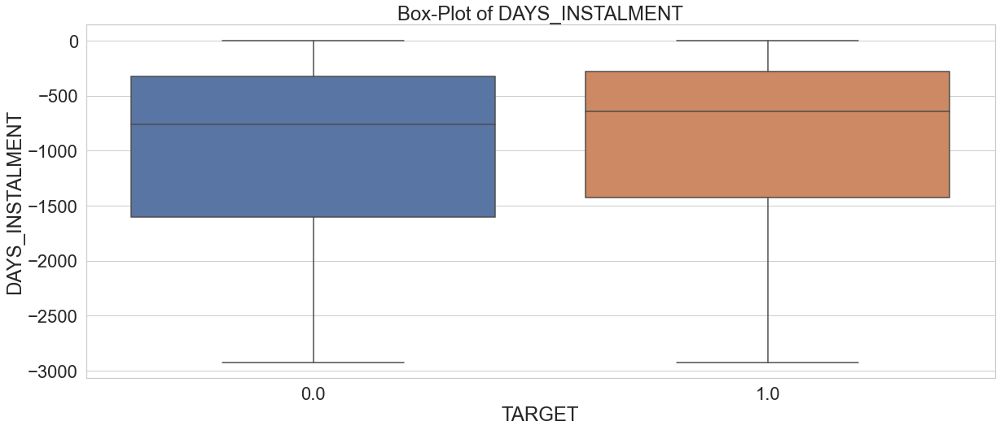

In [834]:
# Represent - The installment of previous credit was supposed to be paid (relative to application date of current loan)
plot_continuous_variables(inspay_merged, 'DAYS_INSTALMENT', plots = ['box'])

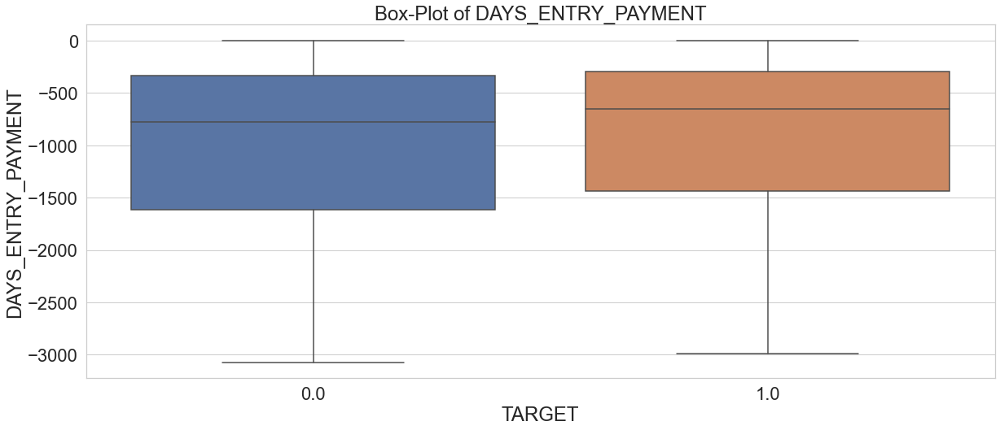

In [836]:
# Represent - The installments of previous credit paid actually (relative to application date of current loan)
plot_continuous_variables(inspay_merged, 'DAYS_ENTRY_PAYMENT', plots = ['box'])

#### Observation
1. Compare to the last 2 plot we can say that gap between current applicant and Non-defaulter is high compare to gap between current applicant and defaulter.

### POS_CASH_balance.csv
<pre>
The table contains the Monthly Balance Snapshots of previous Point of Sales and Cash Loans that the applicant had with Home Credit Group.
</pre>

In [838]:
print(df_pos.info())
print('*'*100)
print(df_pos.describe())
print('*'*100)
df_pos.head(2)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10001358 entries, 0 to 10001357
Data columns (total 8 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   SK_ID_PREV             int64  
 1   SK_ID_CURR             int64  
 2   MONTHS_BALANCE         int64  
 3   CNT_INSTALMENT         float64
 4   CNT_INSTALMENT_FUTURE  float64
 5   NAME_CONTRACT_STATUS   object 
 6   SK_DPD                 int64  
 7   SK_DPD_DEF             int64  
dtypes: float64(2), int64(5), object(1)
memory usage: 610.4+ MB
None
****************************************************************************************************
         SK_ID_PREV    SK_ID_CURR  MONTHS_BALANCE  CNT_INSTALMENT  \
count  1.000136e+07  1.000136e+07    1.000136e+07    9.975287e+06   
mean   1.903217e+06  2.784039e+05   -3.501259e+01    1.708965e+01   
std    5.358465e+05  1.027637e+05    2.606657e+01    1.199506e+01   
min    1.000001e+06  1.000010e+05   -9.600000e+01    1.000000e+00   
25%    1.43

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0


In [839]:
print('Count of Current application in train', len(set(df.SK_ID_CURR.unique())))
      
# Count of current applicant info we have in bureau
count_application_bureau = len(set(df.SK_ID_CURR.unique()).intersection(set(df_pos.SK_ID_CURR.unique())))
print('Count of current applicant whose POS info we have '+ str(count_application_bureau))

# Number applicant who apply first time
print('New applicant in train ', len(set(df.SK_ID_CURR.unique())) - count_application_bureau)

# Check duplicate entry in bureau.csv
duplicate_count  =  df_pos.shape[0] - df_pos.duplicated().shape[0]
print('Count of Duplicate count',duplicate_count)


Count of Current application in train 307511
Count of current applicant whose POS info we have 289444
New applicant in train  18067
Count of Duplicate count 0


                       Total   Percent
CNT_INSTALMENT_FUTURE  26087  0.002608
CNT_INSTALMENT         26071  0.002607
SK_DPD_DEF                 0  0.000000
SK_DPD                     0  0.000000
NAME_CONTRACT_STATUS       0  0.000000


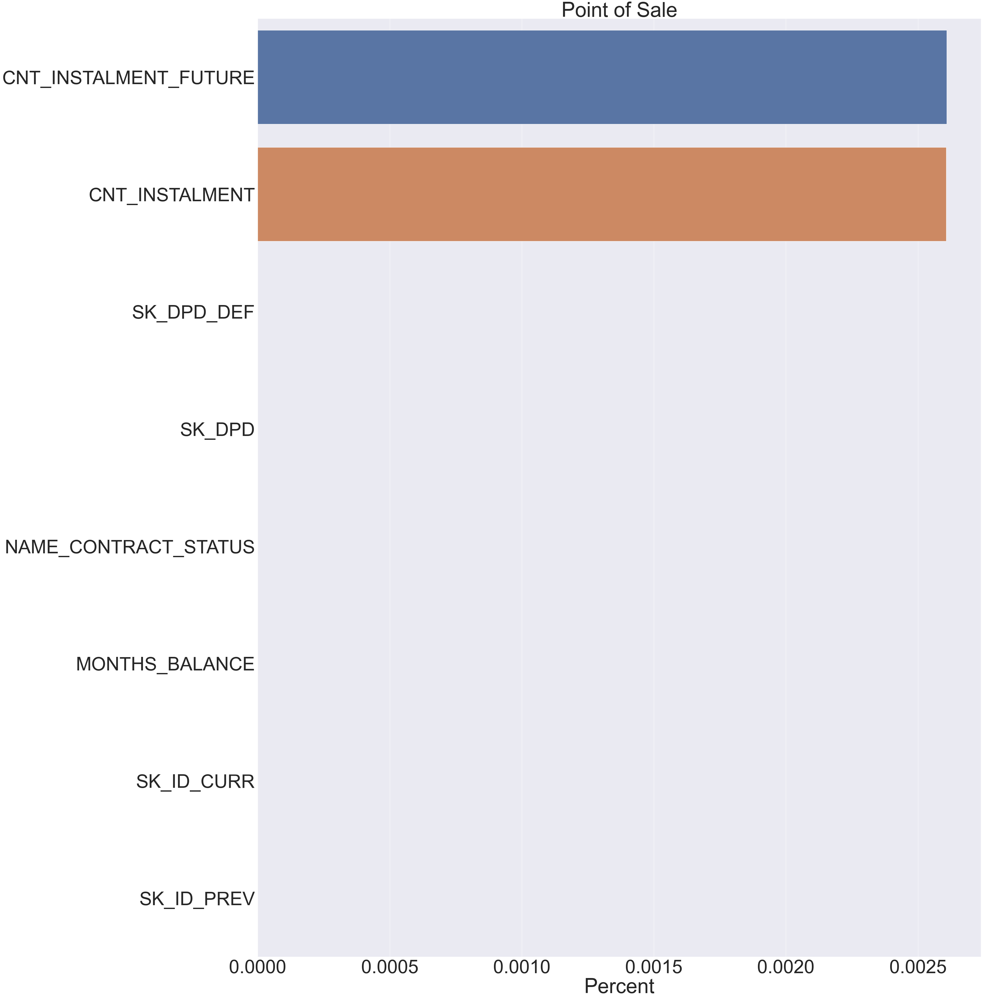

In [840]:
#Missing information
missing_value(df_pos,df_name='Point of Sale')

#### Observation
1. There is no much missing values

In [841]:
# Next to know the imporatances of bureau column, need to merge with application train
Pos_app_train_merged = df.iloc[:,:2].merge(df_pos, on = 'SK_ID_CURR')
Pos_app_train_merged.head(3)

,SK_ID_CURR,TARGET,SK_ID_PREV,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,100002,1,1038818,-13,24.0,18.0,Active,0,0
1,100002,1,1038818,-16,24.0,21.0,Active,0,0
2,100002,1,1038818,-18,24.0,23.0,Active,0,0


In [842]:
print("POS dataset: \n{}".format(df_pos.dtypes.value_counts()))

POS dataset: 
int64      5
float64    2
object     1
dtype: int64


### Categorical Features -  POS.csv

<Figure size 216x576 with 0 Axes>

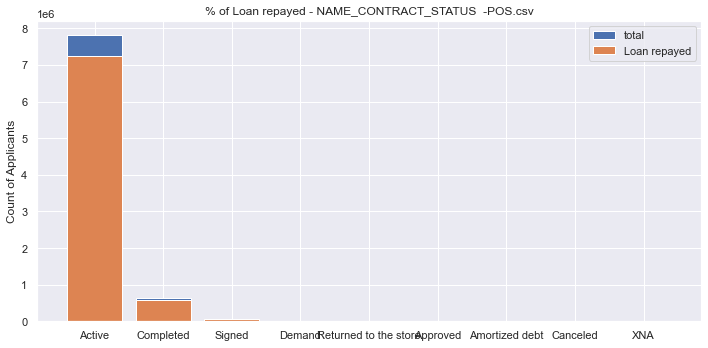

    NAME_CONTRACT_STATUS   TARGET    total    Average
0                 Active  7244509  7818577  92.657641
4              Completed   587920   634872  92.604494
7                 Signed    68788    74625  92.178224
5                 Demand     5299     6110  86.726678
6  Returned to the store     4119     4591  89.719015
    NAME_CONTRACT_STATUS  TARGET  total     Average
6  Returned to the store    4119   4591   89.719015
2               Approved    3902   4221   92.442549
1         Amortized debt     240    365   65.753425
3               Canceled      10     12   83.333333
8                    XNA       2      2  100.000000


<Figure size 1440x576 with 0 Axes>

In [845]:
sns.set(font_scale = 1)
plt.figure(figsize = (3,8))
univariate_barplots(Pos_app_train_merged, 'NAME_CONTRACT_STATUS', 'TARGET', top=False,dataset_type='POS.csv')
plt.tight_layout()

#### Observation
From above bivariant we cant say, which catgorey is highly influnced with Target Feature

#### Numerical Features POS.CSV

In [861]:
Numeric_col_pos = ['TARGET', 'MONTHS_BALANCE',
       'CNT_INSTALMENT', 'CNT_INSTALMENT_FUTURE',
       'SK_DPD', 'SK_DPD_DEF']

Text(0.5, 1.0, 'Bureau Numerical features Correlation')

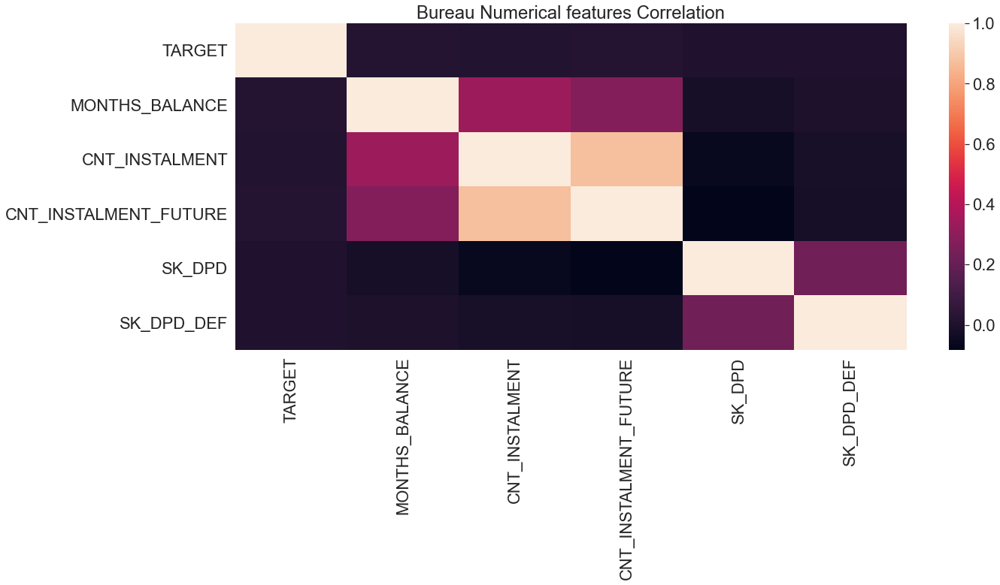

In [863]:
numeric_corr_values = Pos_app_train_merged[Numeric_col_pos].corr()
sns.set(font_scale = 2)
sns.heatmap(numeric_corr_values,annot=False)
plt.title('Bureau Numerical features Correlation')

In [865]:
Numeric_corr_POS = clean_num_corr(numeric_corr_values= numeric_corr_values)

Shape of dataframe (30, 4)
Shape of dataframe after removal of duplicates (15, 4)


In [866]:
Numeric_corr_POS.head(5)

,Col1,Col2,Correlation
0,CNT_INSTALMENT_FUTURE,CNT_INSTALMENT,0.873742
1,MONTHS_BALANCE,CNT_INSTALMENT,0.340099
2,MONTHS_BALANCE,CNT_INSTALMENT_FUTURE,0.277634
3,SK_DPD_DEF,SK_DPD,0.225918
4,CNT_INSTALMENT_FUTURE,SK_DPD,0.082890


In [867]:
# Column which highly correlated with Independent
Numeric_corr_POS.head(10).sort_values('Correlation',ascending=False)

,Col1,Col2,Correlation
0,CNT_INSTALMENT_FUTURE,CNT_INSTALMENT,0.873742
1,MONTHS_BALANCE,CNT_INSTALMENT,0.340099
2,MONTHS_BALANCE,CNT_INSTALMENT_FUTURE,0.277634
3,SK_DPD_DEF,SK_DPD,0.225918
4,CNT_INSTALMENT_FUTURE,SK_DPD,0.082890
5,CNT_INSTALMENT,SK_DPD,0.061455
6,TARGET,CNT_INSTALMENT_FUTURE,0.021972
7,TARGET,MONTHS_BALANCE,0.020147
8,TARGET,CNT_INSTALMENT,0.018506
9,SK_DPD,MONTHS_BALANCE,0.017702


#### Observation
1. CNT_INSTALMENT_FUTURE and CNT_INSTALMENT are highly correlated 

In [868]:
# Column which highly correlated with Target
Target_pos_corr = Numeric_corr_POS[Numeric_corr_POS['Col1']=='TARGET']
Target_pos_corr.head(10).sort_values('Correlation',ascending=False)

,Col1,Col2,Correlation
6,TARGET,CNT_INSTALMENT_FUTURE,0.021972
7,TARGET,MONTHS_BALANCE,0.020147
8,TARGET,CNT_INSTALMENT,0.018506
12,TARGET,SK_DPD,0.009866
13,TARGET,SK_DPD_DEF,0.008594


#### Observation
1. Features are not correlated significantly with TARGET Features 

## credit_card_balance.csv
   Table consists of the monthly data related to any or multiple Credit Cards that the applicant had with the Home Credit Group.

In [872]:
print(df_credit_bal.info())
print('*'*100)
print(df_credit_bal.describe())
print('*'*100)
df_credit_bal.head(2)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3840312 entries, 0 to 3840311
Data columns (total 23 columns):
 #   Column                      Dtype  
---  ------                      -----  
 0   SK_ID_PREV                  int64  
 1   SK_ID_CURR                  int64  
 2   MONTHS_BALANCE              int64  
 3   AMT_BALANCE                 float64
 4   AMT_CREDIT_LIMIT_ACTUAL     int64  
 5   AMT_DRAWINGS_ATM_CURRENT    float64
 6   AMT_DRAWINGS_CURRENT        float64
 7   AMT_DRAWINGS_OTHER_CURRENT  float64
 8   AMT_DRAWINGS_POS_CURRENT    float64
 9   AMT_INST_MIN_REGULARITY     float64
 10  AMT_PAYMENT_CURRENT         float64
 11  AMT_PAYMENT_TOTAL_CURRENT   float64
 12  AMT_RECEIVABLE_PRINCIPAL    float64
 13  AMT_RECIVABLE               float64
 14  AMT_TOTAL_RECEIVABLE        float64
 15  CNT_DRAWINGS_ATM_CURRENT    float64
 16  CNT_DRAWINGS_CURRENT        int64  
 17  CNT_DRAWINGS_OTHER_CURRENT  float64
 18  CNT_DRAWINGS_POS_CURRENT    float64
 19  CNT_INSTALMENT_MATURE

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,...,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,...,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0


In [873]:
print('Count of Current application in train', len(set(df.SK_ID_CURR.unique())))
      
# Count of current applicant info we have in bureau
count_application_bureau = len(set(df.SK_ID_CURR.unique()).intersection(set(df_credit_bal.SK_ID_CURR.unique())))
print('Count of current applicant whose Credit balance info we have '+ str(count_application_bureau))

# Number applicant who apply first time
print('New applicant in train ', len(set(df.SK_ID_CURR.unique())) - count_application_bureau)

# Check duplicate entry in bureau.csv
duplicate_count  =  df_credit_bal.shape[0] - df_credit_bal.duplicated().shape[0]
print('Count of Duplicate count',duplicate_count)


Count of Current application in train 307511
Count of current applicant whose Credit balance info we have 86905
New applicant in train  220606
Count of Duplicate count 0


                             Total   Percent
AMT_PAYMENT_CURRENT         767988  0.199981
AMT_DRAWINGS_OTHER_CURRENT  749816  0.195249
CNT_DRAWINGS_POS_CURRENT    749816  0.195249
CNT_DRAWINGS_OTHER_CURRENT  749816  0.195249
CNT_DRAWINGS_ATM_CURRENT    749816  0.195249


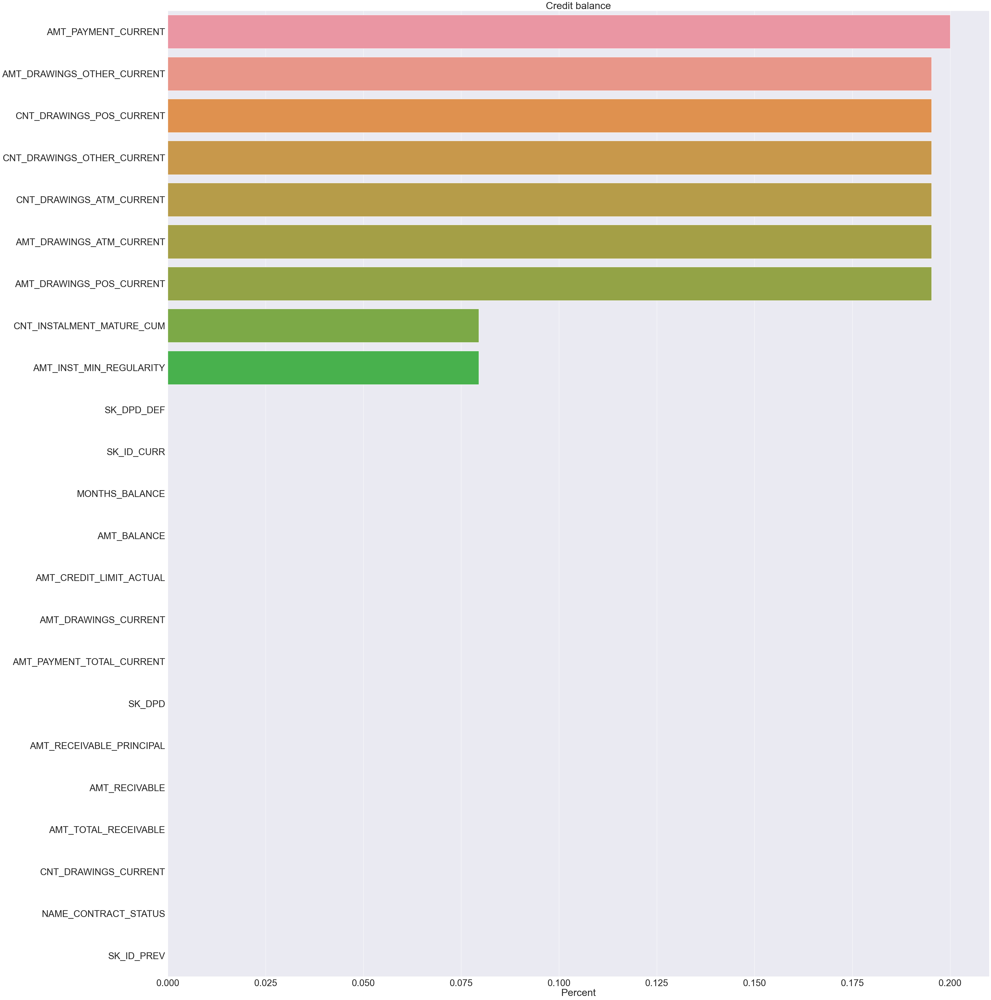

In [874]:
#Missing information
missing_value(df_credit_bal,df_name='Credit balance')

### Observation
1. There's 1 percentage missing value, so no huge impact, Out of the 23 features, 9 of these features contain some NaN values.

In [875]:
# Next to know the imporatances of Credit Balance column, need to merge with application train
CreditBal_app_train_merged = df.iloc[:,:2].merge(df_credit_bal, on = 'SK_ID_CURR')
CreditBal_app_train_merged.head(3)

,SK_ID_CURR,TARGET,SK_ID_PREV,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,100006,0,1489396,-2,0.0,270000,NaN,0.0,NaN,NaN,...,0.0,0.0,NaN,0,NaN,NaN,0.0,Active,0,0
1,100006,0,1489396,-1,0.0,270000,NaN,0.0,NaN,NaN,...,0.0,0.0,NaN,0,NaN,NaN,0.0,Active,0,0
2,100006,0,1489396,-5,0.0,270000,NaN,0.0,NaN,NaN,...,0.0,0.0,NaN,0,NaN,NaN,0.0,Active,0,0


In [876]:
print("Credit balance dataset: \n{}".format(df_credit_bal.dtypes.value_counts()))

Credit balance dataset: 
float64    15
int64       7
object      1
dtype: int64


#### Categorical Features - Credit balance.csv

<Figure size 216x576 with 0 Axes>

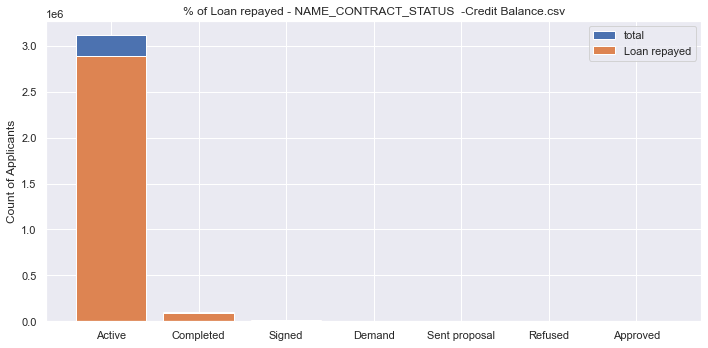

  NAME_CONTRACT_STATUS   TARGET    total    Average
0               Active  2893941  3116673  92.853533
2            Completed    93611   100031  93.581990
6               Signed     9278     9939  93.349432
3               Demand      675      843  80.071174
5        Sent proposal      442      460  96.086957
  NAME_CONTRACT_STATUS  TARGET  total     Average
6               Signed    9278   9939   93.349432
3               Demand     675    843   80.071174
5        Sent proposal     442    460   96.086957
4              Refused      12     14   85.714286
1             Approved       5      5  100.000000


<Figure size 1440x576 with 0 Axes>

In [879]:
sns.set(font_scale = 1)
plt.figure(figsize = (3,8))
univariate_barplots(CreditBal_app_train_merged, 'NAME_CONTRACT_STATUS', 'TARGET', top=False,dataset_type='Credit Balance.csv')
plt.tight_layout()

In [884]:
Numeric_col_creditBal = ['SK_ID_CURR', 'TARGET', 'SK_ID_PREV', 'MONTHS_BALANCE', 'AMT_BALANCE',
       'AMT_CREDIT_LIMIT_ACTUAL', 'AMT_DRAWINGS_ATM_CURRENT',
       'AMT_DRAWINGS_CURRENT', 'AMT_DRAWINGS_OTHER_CURRENT',
       'AMT_DRAWINGS_POS_CURRENT', 'AMT_INST_MIN_REGULARITY',
       'AMT_PAYMENT_CURRENT', 'AMT_PAYMENT_TOTAL_CURRENT',
       'AMT_RECEIVABLE_PRINCIPAL', 'AMT_RECIVABLE', 'AMT_TOTAL_RECEIVABLE',
       'CNT_DRAWINGS_ATM_CURRENT', 'CNT_DRAWINGS_CURRENT',
       'CNT_DRAWINGS_OTHER_CURRENT', 'CNT_DRAWINGS_POS_CURRENT',
       'CNT_INSTALMENT_MATURE_CUM', 'SK_DPD', 'SK_DPD_DEF']

Text(0.5, 1.0, 'Credit Balance Numerical features Correlation')

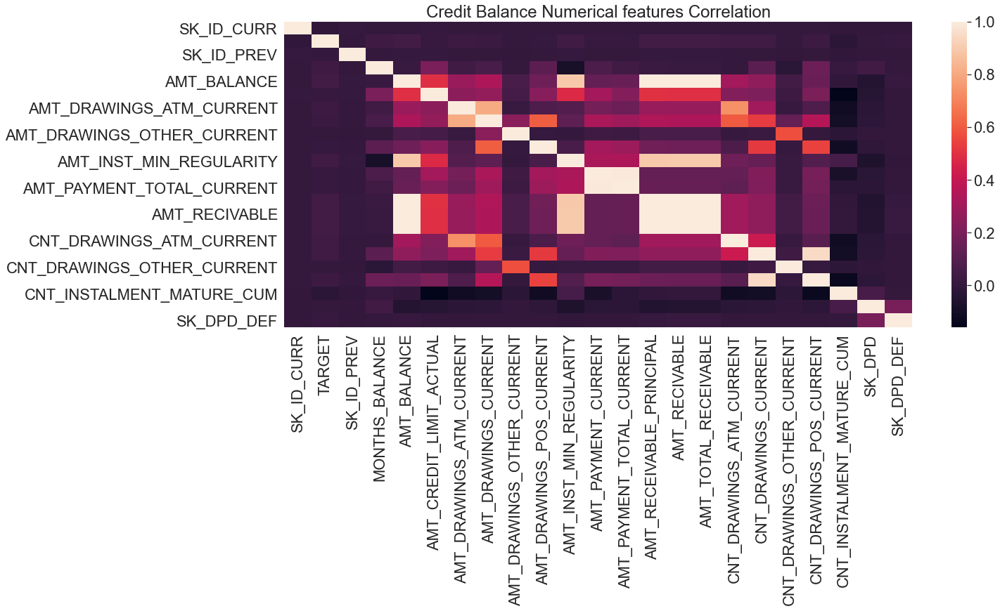

In [886]:
numeric_corr_values = CreditBal_app_train_merged[Numeric_col_creditBal].corr()
sns.set(font_scale = 2)
sns.heatmap(numeric_corr_values,annot=False)
plt.title('Credit Balance Numerical features Correlation')

In [887]:
Numeric_corr_CreditBal= clean_num_corr(numeric_corr_values= numeric_corr_values)
Numeric_corr_CreditBal.head(5)

Shape of dataframe (506, 4)
Shape of dataframe after removal of duplicates (253, 4)


,Col1,Col2,Correlation
0,AMT_TOTAL_RECEIVABLE,AMT_RECIVABLE,0.999995
1,AMT_BALANCE,AMT_RECIVABLE,0.999915
2,AMT_BALANCE,AMT_TOTAL_RECEIVABLE,0.999894
3,AMT_RECIVABLE,AMT_RECEIVABLE_PRINCIPAL,0.999715
4,AMT_BALANCE,AMT_RECEIVABLE_PRINCIPAL,0.999710


In [890]:
# Column which highly correlated with Independent
NonTarget_CreditBal_corr = Numeric_corr_CreditBal[Numeric_corr_CreditBal['Col1']!='TARGET']
NonTarget_CreditBal_corr.head(20).sort_values('Correlation',ascending=False)

,Col1,Col2,Correlation
0,AMT_TOTAL_RECEIVABLE,AMT_RECIVABLE,0.999995
1,AMT_BALANCE,AMT_RECIVABLE,0.999915
2,AMT_BALANCE,AMT_TOTAL_RECEIVABLE,0.999894
3,AMT_RECIVABLE,AMT_RECEIVABLE_PRINCIPAL,0.999715
4,AMT_BALANCE,AMT_RECEIVABLE_PRINCIPAL,0.999710
5,AMT_TOTAL_RECEIVABLE,AMT_RECEIVABLE_PRINCIPAL,0.999689
6,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,0.994418
7,CNT_DRAWINGS_POS_CURRENT,CNT_DRAWINGS_CURRENT,0.948367
8,AMT_INST_MIN_REGULARITY,AMT_RECIVABLE,0.896606
9,AMT_INST_MIN_REGULARITY,AMT_TOTAL_RECEIVABLE,0.896580


#### Observation
1. AMT_TOTAL_RECEIVABLE, AMT_RECIVABLE, AMT_BALANCE , AMT_INST_MIN_REGULARITY and AMT_TOTAL_RECEIVABLE are highly correlated
2. AMT_DRAWINGS_CURRENT and AMT_DRAWINGS_ATM_CURRENT are highly correlated

### Conclusion of EDA

1. Totally we have 7 table, need to merge all table to make better prediction
2. Many tables contains more null value, need to handle effectively.
3. We found some categorical column which well differentiate the defaulter and Non-defaulter like Marital status is Divorce chance of repaying loan is high , so this martial status column is more important for this problem
4. we found some Independent features are correlated with each other, better removing this features, which improve the runntime.
5. As part of Outlier, Defaulter user may do abnormal things , so removing outlier may leads incorrect results.
6. Starting itself we found target is highly imbalance, so for performnce metrics ROC , ConfusionMatrix, precision and Recall may be very useful.
7. Due to correlation, we may create new features which will be very helpfull for this task.
8. With above point, we going to perform Feature Enginering


# <font color='green'> FEATURE ENGINEERING </font>

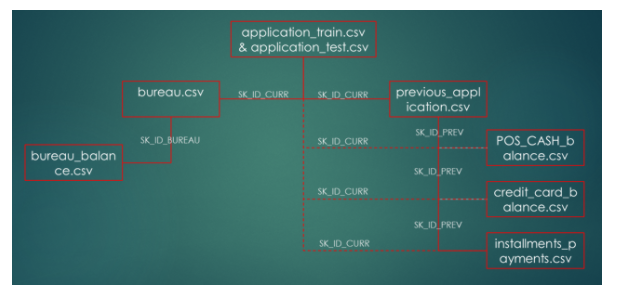

<pre>
From the Exploratory Data Analysis(EDA) we understand the Insight of all tables, major role of feature engineering is selecting best column , best feature selection gives better model. suppose if we have noisy data, model wont give better result. if feature is having missing value either we remove or feature engineering, feature engineering is best because removing noisy features which leads to lack of data.

</pre>

# Reduce memory usage

<pre>

We handling 7 tables, System required a lot of memory intensive computation or data-set size that was large enough to hang my system. so to avoid memory usage problem we going to change the datatype eg - Object to Category, int64 to int32,16,8 deponds on limit of numeric column

</pre>

In [40]:
print(np.iinfo(np.int8).min)
print(np.iinfo(np.int8).max)
print(np.iinfo(np.int16).min)
print(np.iinfo(np.int16).max)
print(np.iinfo(np.int32).min)
print(np.iinfo(np.int32).max)
print(np.iinfo(np.int64).min)
print(np.iinfo(np.int64).max)
print(np.finfo(np.float32).min)
print(np.finfo(np.float32).max)
print(np.finfo(np.float64).min)
print(np.finfo(np.float64).max)


-128
127
-32768
32767
-2147483648
2147483647
-9223372036854775808
9223372036854775807
-3.4028235e+38
3.4028235e+38
-1.7976931348623157e+308
1.7976931348623157e+308


In [7]:
def reduce_mem_usage(data, verbose = True):
    # refer - https://medium.com/@aakashgoel12/avoid-memory-error-techniques-to-reduce-dataframe-memory-usage-fcf53b2318a2
    #refer: https://www.kaggle.com/gemartin/load-data-reduce-memory-usage
    '''
    This function is used to reduce the memory usage by converting the datatypes of a pandas
    DataFrame withing required limits.
    '''
    
    start_mem = data.memory_usage().sum() / 1024**2
    if verbose:
        print('-'*100)
        print('Memory usage of dataframe: {:.2f} MB'.format(start_mem))
    
    for col in data.columns:
        col_type = data[col].dtype
        
        if col_type != object:
            c_min = data[col].min()
            c_max = data[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    data[col] = data[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    data[col] = data[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    data[col] = data[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    data[col] = data[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    data[col] = data[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    data[col] = data[col].astype(np.float32)
                else:
                    data[col] = data[col].astype(np.float64)

    end_mem = data.memory_usage().sum() / 1024**2
    if verbose:
        print('Memory usage after optimization: {:.2f} MB'.format(end_mem))
        print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))
        print('-'*100)
    
    return data

# Read all the tables 

In [8]:
# Read all madatory files for this task
def read_mandatory_files():
    df = pd.read_csv('application_train.csv')
    df = reduce_mem_usage(df)
    df_test = pd.read_csv('application_test.csv')
    df_test = reduce_mem_usage(df_test)
    df_bureau = pd.read_csv('bureau.csv')
    df_bureau = reduce_mem_usage(df_bureau)
    df_bureau_bal = pd.read_csv('bureau_balance.csv')
    df_bureau_bal = reduce_mem_usage(df_bureau_bal)
    df_prev_app = pd.read_csv('previous_application.csv')
    df_prev_app = reduce_mem_usage(df_prev_app)
    df_pos = pd.read_csv('POS_CASH_balance.csv')
    df_pos = reduce_mem_usage(df_pos)
    df_credit_bal = pd.read_csv('credit_card_balance.csv')
    df_credit_bal = reduce_mem_usage(df_credit_bal)
    df_inst_pay = pd.read_csv('installments_payments.csv')
    df_inst_pay = reduce_mem_usage(df_inst_pay)
    
    return df, df_test, df_bureau,df_bureau_bal,df_prev_app,df_pos, df_credit_bal,df_inst_pay

# Data Cleaning
<pre>
Erroness value in application train and application test tables, to handling we using below function

</pre>

In [9]:
# Data Cleaning and preprocessing for train and test
def data_cleaning(df='dataframe'):
    df['DAYS_BIRTH'] = round(df['DAYS_BIRTH'] *-1/ 365)

    # abs - convert all value in to postive
    df['DAYS_EMPLOYED']  = abs(df['DAYS_EMPLOYED'])
    df['DAYS_EMPLOYED'].head(2)

    # Replace the anomalous values(Errorness value) with nan
    df['DAYS_EMPLOYED'] = df['DAYS_EMPLOYED'].replace({365243: np.nan})

    # Convert days in to years
    df['DAYS_EMPLOYED'] = df['DAYS_EMPLOYED'] /365
    
    # Create an anomalous flag column
    df['Year_Empolyed_ANOM'] = df["Year_Empolyed"] == 365243

    #Invalid Gender code, we have limited entry so we removing
    df = df[df['CODE_GENDER'] != 'XNA']

    df.loc[df['OBS_30_CNT_SOCIAL_CIRCLE'] > 30, 'OBS_30_CNT_SOCIAL_CIRCLE'] = np.nan
    df.loc[df['OBS_60_CNT_SOCIAL_CIRCLE'] > 30, 'OBS_60_CNT_SOCIAL_CIRCLE'] = np.nan
    
    return df

# Replcaing missing value category with XNS (Unknow)

In [10]:
# replacing Null with XNS -  Unknow category
def replacing_missing_category(df = 'dataframe'):
    # replacing Null with XNS -  Unknow category
    categorical_columns_train = df.dtypes[df.dtypes == 'object'].index.tolist()
    df[categorical_columns_train] = df[categorical_columns_train].fillna('XNA')
    
    # From EDA REGION_RATING_CLIENT and REGION_RATING_CLIENT_W_CITY have discret value, 
    #so we changing this column data type from Int to Object
    
    df['REGION_RATING_CLIENT'] = df['REGION_RATING_CLIENT'].astype('object')
    df['REGION_RATING_CLIENT_W_CITY'] = df['REGION_RATING_CLIENT_W_CITY'].astype('object')
    
    return df

# OneHotEncoding and Label encoder

In [46]:
## Converting Category in to Numerical representation using Onehot encoder and label encoder
'''
OneHotEncoder -  handle_unknown='ignore'
    unknown category is encountered during
    transform, the resulting one-hot encoded columns for this feature
    will be all zeros.
'''
def category_to_numeric(df = 'dataframe',df_test = 'dataframe2'):
    print('Shape of application train before Encoding ', df.shape)
    print('Shape of application test before Encoding ', df_test.shape)
    cat_df = df.dtypes[df.dtypes == 'object'].index.tolist()
    enc = OneHotEncoder(handle_unknown='ignore')
    for i in tqdm(cat_df):

        enc_df = pd.DataFrame(enc.fit_transform(df[[i]]).toarray().astype('int'),columns=enc.get_feature_names([i]))
        enc_df_test = pd.DataFrame(enc.transform(df_test[[i]]).toarray().astype('int'),columns=enc.get_feature_names([i]))
        df = df.drop(i,axis=1).join(enc_df)
        df_test = df_test.drop(i,axis=1).join(enc_df_test)

    print('Shape of application train after Encoding ', df.shape)
    print('Shape of application test after Encoding ', df_test.shape)  
    
    return df, df_test

# Replacing missing value - dtype Numeric

In [12]:
# replacing ,missing value with Median
def replacing_missing_numeric(df = 'dataframe', df_test='dataframe2'):
    # Train missing values
    missing_value(df,df_name='TRAIN',visualizse=False,head_count=5)
    # Test missing values
    missing_value(df_test,df_name='TEST',visualizse=False,head_count=10)
    
    ## Fill in missing values

    #Strategy = Median, variances is high so better to use Median
    imputer = Imputer(strategy = 'median')
    scaler = MinMaxScaler(feature_range = [0,1])
    train = df.drop(columns = ['TARGET'])
    train_col = train.columns

    imputer.fit(train)
    train = imputer.transform(train)
    test = imputer.transform(df_test)
    scaler.fit(train)
    train = scaler.transform(train)
    test = scaler.transform(test)
    print('Training data shape: ', train.shape)
    print('Testing data shape: ', test.shape)
    new_df_train = pd.DataFrame(train,columns=train_col)
    new_df_train['SK_ID_CURR'] = df['SK_ID_CURR'].values
    new_df_train['TARGET'] = df['TARGET'].values
    
    new_df_test = pd.DataFrame(test,columns=train_col)
    new_df_test['SK_ID_CURR'] = df_test['SK_ID_CURR'].values
    
    print('Missing value_count after Imputation \n')
    missing_value(new_df_train,df_name='TRAIN',visualizse=False,head_count=5)
    # Test missing values
    missing_value(new_df_test,df_name='TEST',visualizse=False,head_count=5)
    print(' Observation : \n 1.Now there is no missing value in Train and test')
    
    
    return new_df_train, new_df_test

# Create new Custom features - application train and test

<pre>

refer - https://www.wellsfargo.com/financial-education/credit-management/five-c/

<strong> <font color = 'blue'>Capacity</font> </strong> : Lenders need to determine whether you can comfortably afford your payments. Your income and employment history are good indicators of your ability to repay outstanding debt. Income amount, stability, and type of income may all be considered. The ratio of your current and any new debt as compared to your before-tax income, known as debt-to-income ratio (DTI), may be evaluated.

<strong> <font color = 'blue'>Collateral</font> </strong>  (when applying for secured loans): Loans, lines of credit, or credit cards you apply for may be secured or unsecured. With a secured product, such as an auto or home equity loan, you pledge something you own as collateral. The value of your collateral will be evaluated, and any existing debt secured by that collateral will be subtracted from the value. The remaining equity will play a factor in the lending decision.

<strong> <font color = 'blue'>Capital</font> </strong>: While your household income is expected to be the primary source of repayment, capital represents the savings, investments, and other assets that can help repay the loan. This can be helpful if you lose your job or experience other setbacks.

<strong> <font color = 'blue'>Conditions</font> </strong>: Lenders may want to know how you plan to use the money and will consider the loan’s purpose, such as whether the loan will be used to purchase a vehicle or other property. Other factors, such as environmental and economic conditions, may also be considered.
</pre>

In [13]:
def create_custom_features_main_table(df='dataframe1', df_test='dataframe2'):
    ################ Application_ train.csv ###########
    # Flag to represent when Total income is greater than Credit
    df['INCOME_GT_CREDIT_FLAG'] = df['AMT_INCOME_TOTAL'] > df['AMT_CREDIT']

    # Column to represent Credit Income Percent
    df['DIR'] = df['AMT_CREDIT']/df['AMT_INCOME_TOTAL']

    # Column to represent Annuity Income percent
    df['AIR'] = df['AMT_ANNUITY']/df['AMT_INCOME_TOTAL']

    # Column to represent Credit Term
    df['ACR'] = df['AMT_CREDIT']/df['AMT_ANNUITY']

    # Column to represent Days Employed percent in his life
    df['DAR'] = df['DAYS_EMPLOYED']/df['DAYS_BIRTH']

    ################ Application_ test.csv ###########

    df_test['INCOME_GT_CREDIT_FLAG'] = df_test['AMT_INCOME_TOTAL'] > df_test['AMT_CREDIT']
    df_test['DIR'] = df_test['AMT_CREDIT']/df_test['AMT_INCOME_TOTAL']
    df_test['AIR'] = df_test['AMT_ANNUITY']/df_test['AMT_INCOME_TOTAL']
    df_test['ACR'] = df_test['AMT_CREDIT']/df_test['AMT_CREDIT'] 
    df_test['DAR'] = df_test['DAYS_EMPLOYED']/df_test['DAYS_BIRTH']
    
    return df, df_test


# Create unique Column

In [14]:
# when merging two table, chance o having same column name in both table, to avoid we settiing new feature name
# Note , pd.Dummies we have prefix attribute, but for numerical field better to use this function
def create_unique_col(table= 'Bureau',data='df', ID ='SK_ID_CURR' ):
    '''
    table - Dataframe name
    data  = Dataframe
    ID    = Foreign key
    return Column name wit prefix table name
    '''
    
    unique_col_bureau = [] 
    for i in data.columns:
        if i != ID:
            col_name = table+str('_')+str(i)
            unique_col_bureau.append(col_name)
        else:
            unique_col_bureau.append(i)
    print('New Column names  - \n'+str(unique_col_bureau))   
    return unique_col_bureau  

# Create Custom feature - Bureau.csv

In [15]:
def create_custom_bureau_feature(df_bureau='bureau_table'):
    # Create a new column , using existing information from Bureau
    # Number of past loans per customer
    past_loan = df_bureau.groupby(by = ['SK_ID_CURR'])['SK_ID_BUREAU'].count().reset_index().rename(columns = {'SK_ID_BUREAU': 'LOAN_COUNT_BUREAU'})
    print('Past loan details',past_loan.shape )


    # Number of type of credit loan type per customer
    credit_type = df_bureau[['SK_ID_CURR', 'CREDIT_TYPE']].groupby('SK_ID_CURR')['CREDIT_TYPE'].nunique().reset_index().rename(columns={'CREDIT_TYPE': 'LOAN_TYPES_BUREAU'})
    print('credit_type details',credit_type.shape)


    # total_loan amount still date
    sum_total_count = df_bureau[['SK_ID_CURR', 'AMT_CREDIT_SUM']].groupby('SK_ID_CURR')['AMT_CREDIT_SUM'].sum().reset_index().rename(columns={'AMT_CREDIT_SUM': 'TOTAL_LOAN_AMT_SUM'})
    print('sum_total_count details',sum_total_count.shape )


    # total_loan amount debt still date
    sum_total_count_debt = df_bureau[['SK_ID_CURR', 'AMT_CREDIT_SUM_DEBT']].groupby('SK_ID_CURR')['AMT_CREDIT_SUM_DEBT'].sum().reset_index().rename(columns={'AMT_CREDIT_SUM_DEBT': 'TOTAL_LOAN_AMT_SUM_DEBT'})
    print('sum_total_count_debt details',sum_total_count_debt.shape)


    #merge sum_total_count and sum_total_count_debt
    debt_credit_df  =  sum_total_count.merge(sum_total_count_debt,on='SK_ID_CURR')
    debt_credit_df['debt_credit_ratio'] = debt_credit_df['TOTAL_LOAN_AMT_SUM_DEBT'] / debt_credit_df['TOTAL_LOAN_AMT_SUM']
    print('Merge of sum_total_count and sum_total_count_debt',debt_credit_df.shape)


    # Sum of AMT_CREDIT_SUM_OVERDUE
    Total_customer_overdue  = df_bureau[['SK_ID_CURR', 'AMT_CREDIT_SUM_OVERDUE']].groupby('SK_ID_CURR')['AMT_CREDIT_SUM_OVERDUE'].sum().reset_index().rename(columns={'AMT_CREDIT_SUM_OVERDUE': 'SUM_AMT_CREDIT_SUM_OVERDUE'})
    print('Sum of over due amount',Total_customer_overdue.shape)
    # sum AMT_CREDIT_SUM_DEBT
    Total_customer_debt =  df_bureau[['SK_ID_CURR','AMT_CREDIT_SUM_DEBT']].groupby(by=['SK_ID_CURR'])['AMT_CREDIT_SUM_DEBT'].sum().reset_index().rename(columns={'AMT_CREDIT_SUM_DEBT':'TOTAL_CUSTOMER_DEBT'})
    print('Sum of total debt amount ',Total_customer_debt.shape)


    sum_overdue_credit_sum  = Total_customer_overdue.merge(Total_customer_debt,on='SK_ID_CURR')
    sum_overdue_credit_sum['overdue_debt_ratio'] = sum_overdue_credit_sum['SUM_AMT_CREDIT_SUM_OVERDUE'] / sum_overdue_credit_sum['TOTAL_CUSTOMER_DEBT']
    sum_overdue_credit_sum['overdue_debt_ratio'] = sum_overdue_credit_sum['overdue_debt_ratio'].fillna(0)
    sum_overdue_credit_sum['overdue_debt_ratio'] = sum_overdue_credit_sum.replace([np.inf,-np.inf],0)
    sum_overdue_credit_sum['overdue_debt_ratio'] = pd.to_numeric(sum_overdue_credit_sum['overdue_debt_ratio'],downcast='float')
    print('Ratio of Overdue and credit debt amount',sum_overdue_credit_sum.shape)
    
    df_bureau = df_bureau.merge(past_loan,on='SK_ID_CURR',how='left')
    df_bureau =df_bureau.merge(credit_type,on='SK_ID_CURR',how='left')
    df_bureau =df_bureau.merge(debt_credit_df,on='SK_ID_CURR',how='left')
    df_bureau =df_bureau.merge(sum_overdue_credit_sum,on='SK_ID_CURR',how='left')
    
    return df_bureau



# Join application train and bureau.csv

In [16]:
# Joining application_train and BUREAU.csv
def join_application_bureau(df ='table1', df_bureau = 'table2'):
    # Categorical feature - merging
    # Converting all categorical in to onehot encoding
    categorical_bureau = pd.get_dummies(df_bureau.select_dtypes('object'), prefix='Bureau')
    categorical_bureau['SK_ID_CURR'] = df_bureau['SK_ID_CURR']

    grp_bureau = categorical_bureau.groupby(by = ['SK_ID_CURR']).mean().reset_index()
    print('Column_names_Categorical', grp_bureau.columns)
    
    # Merge train and bureau_categorical
    df_main = df.merge(grp_bureau, on='SK_ID_CURR',how='left')
    df_main.update(df_main[grp_bureau.columns].fillna(0))
    
    # Combining Numerical features

    Numerical_bureau_col = df_bureau.select_dtypes(include=[np.number]).columns
    Numerical_bureau = df_bureau[Numerical_bureau_col]


    grp_bureau_num = Numerical_bureau.drop(['SK_ID_BUREAU'], axis = 1).groupby(by=['SK_ID_CURR']).mean().reset_index()
    print('Column_names_Numeric', grp_bureau_num.columns)

    #There may be some column name for both application and bureau.csv, inorder to avoid we giving unique column name
    grp_bureau_num.columns = create_unique_col(table='Bureau',data=grp_bureau_num,ID='SK_ID_CURR')

    # Merge train and bureau_categorical
    df_main = df_main.merge(grp_bureau_num, on='SK_ID_CURR',how='left')
    df_main.update(df_main[grp_bureau_num.columns].fillna(0))
    
    return df_main




# Join application, bureau and bureau_balance

In [34]:
# Joining Bureau_Balance data to merge of Application and Bureau(df_main)

def data_cleaning_bureau_bal(df_bureau_bal= 'dataframe'):
    # C - Close , so we giving weight to 0, remaining incremental, thing is X - Unknow so benefit of doubt we giving middle value(4) 
    status_label_encoding = { 'C': 0, '0': 1, '1': 2, '2': 3, 'X': 4, '3': 5, '4': 6, '5': 7}
    df_bureau_bal['STATUS'] = df_bureau_bal['STATUS'].map(status_label_encoding)

    # Monthly Balance is in Negative , easy interpreatation we changing to postive
    df_bureau_bal['MONTHS_BALANCE'] = abs(df_bureau_bal['MONTHS_BALANCE'])

    # Creating new features 'Weightage_balance' = divide Status by Months_balance 
    df_bureau_bal['WEIGHT_status'] = df_bureau_bal['STATUS'] / (df_bureau_bal['MONTHS_BALANCE'] +1)
    
    return df_bureau_bal

def merge_application_BureauBal(df_main='dataframe1', df_bureau='dataframe2', df_bureau_bal='dataframe3'):
    df_bureau_bal = data_cleaning_bureau_bal(df_bureau_bal= df_bureau_bal)
    Bureau_merge_Bureau_bal =  df_bureau.merge(df_bureau_bal, on='SK_ID_BUREAU')
    Bureau_merge_Bureau_bal = Bureau_merge_Bureau_bal[['SK_ID_CURR', 'MONTHS_BALANCE','STATUS','WEIGHT_status']].groupby('SK_ID_CURR')['MONTHS_BALANCE','STATUS','WEIGHT_status'].sum().reset_index()
    Bureau_merge_Bureau_bal.columns = create_unique_col(table='Bureau_bal',data=Bureau_merge_Bureau_bal,ID='SK_ID_CURR')
    df_main = df_main.merge(Bureau_merge_Bureau_bal, on='SK_ID_CURR',how='left')
    df_main.update(df_main[['Bureau_bal_MONTHS_BALANCE','Bureau_bal_STATUS','Bureau_bal_WEIGHT_status']].fillna(0))
    print('Shape of main table after merge Application, Bureau and Bureau_balance', df_main.shape)
    
    return df_main

# Join application, bureau ,bureau_balance and previous application

In [45]:
def merge_application_prev_app(df_main = 'dataframe1',df_prev_app ='dataframe2'):
    Pre_app_count= df_prev_app[['SK_ID_CURR','SK_ID_PREV']].groupby(by=['SK_ID_CURR'])['SK_ID_PREV'].count().reset_index().rename(columns={'SK_ID_PREV':'PREV_APP_COUNT'}).fillna(0)

    # Combining categorical features
    pre_app_categorical = pd.get_dummies(df_prev_app.select_dtypes('object'))
    pre_app_categorical['SK_ID_CURR'] = df_prev_app['SK_ID_CURR']

    grp_PrevApp = pre_app_categorical.groupby('SK_ID_CURR').mean().reset_index()
    grp_PrevApp.columns = create_unique_col(table='PREV_APP',data=grp_PrevApp,ID='SK_ID_CURR')

    # Combine final Previous_Application to df_main
    df_main = df_main.merge(grp_PrevApp,on='SK_ID_CURR',how='left')
    df_main.update(df_main[grp_PrevApp.columns].fillna(0))

    # Combining numerical features
    grp_PrevApp_numeric = df_prev_app.drop('SK_ID_PREV', axis =1).groupby(by=['SK_ID_CURR']).mean().reset_index()
    grp_PrevApp_numeric.columns = create_unique_col(table='PREV_APP',data=grp_PrevApp_numeric,ID='SK_ID_CURR')
    df_main = df_main.merge(grp_PrevApp_numeric, on =['SK_ID_CURR'], how = 'left')
    df_main.update(df_main[grp_PrevApp_numeric.columns].fillna(0))

    print('Shape after merge Application, Bureau, Bureau_Balance and Previous_Application ', df_main.shape)
    return df_main
    
    

## Join application, bureau ,bureau_balance , previous application and point of sale

In [19]:
def merge_application_pos(df_main = 'dataframe1',df_pos ='dataframe2'):
    Pre_app_count= df_prev_app[['SK_ID_CURR','SK_ID_PREV']].groupby(by=['SK_ID_CURR'])['SK_ID_PREV'].count().reset_index().rename(columns={'SK_ID_PREV':'PREV_APP_COUNT'}).fillna(0)

    POS_count= df_pos[['SK_ID_CURR','SK_ID_PREV']].groupby(by=['SK_ID_CURR'])['SK_ID_PREV'].count().reset_index().rename(columns={'SK_ID_PREV':'POS_COUNT'}).fillna(0)

    # Combining categorical features
    POS_categorical = pd.get_dummies(df_pos.select_dtypes('object'))
    POS_categorical['SK_ID_CURR'] = df_pos['SK_ID_CURR']

    grp_POS = POS_categorical.groupby('SK_ID_CURR').mean().reset_index()
    grp_POS.columns = create_unique_col(table='POS',data=grp_POS,ID='SK_ID_CURR')

    # Combine final Previous_Application to df_main
    df_main = df_main.merge(grp_POS,on='SK_ID_CURR',how='left')
    df_main.update(df_main[grp_POS.columns].fillna(0))

    # Combining numerical features
    POS_numeric = df_pos.drop('SK_ID_PREV', axis =1).groupby(by=['SK_ID_CURR']).mean().reset_index()
    POS_numeric.columns = create_unique_col(table='POS',data=POS_numeric,ID='SK_ID_CURR')
    df_main = df_main.merge(POS_numeric, on =['SK_ID_CURR'], how = 'left')
    df_main.update(df_main[POS_numeric.columns].fillna(0))

    print('Shape after merge Application, Bureau, Bureau_Balance , Previous_Application and POS ', df_main.shape)
    
    return df_main
    
    

### Join application, bureau ,bureau_balance , previous application,POS and Installment payment

In [20]:
def merge_application_Inspay(df_main = 'dataframe1',df_inst_pay ='dataframe2'):
    INSPAY_numeric = df_inst_pay.drop('SK_ID_PREV', axis =1).groupby(by=['SK_ID_CURR']).mean().reset_index()
    INSPAY_numeric.columns = create_unique_col(table='INSTPAY',data=INSPAY_numeric,ID='SK_ID_CURR')
    df_main = df_main.merge(INSPAY_numeric, on =['SK_ID_CURR'], how = 'left')
    df_main.update(df_main[INSPAY_numeric.columns].fillna(0))

    print('Shape after merge Application, Bureau, Bureau_Balance , Previous_Application, POS and InstantPay ', df_main.shape)
    return df_main

### Join application, bureau ,bureau_balance , previous application,POS , Installment payment and credit balance

In [21]:
def merge_application_credit_bal(df_main = 'dataframe1',df_credit_bal ='dataframe2'):
    # Combining categorical features
    CREBAL_categorical = pd.get_dummies(df_credit_bal.select_dtypes('object'))
    CREBAL_categorical['SK_ID_CURR'] = df_credit_bal['SK_ID_CURR']

    grp_CREDBAL = CREBAL_categorical.groupby('SK_ID_CURR').mean().reset_index()
    grp_CREDBAL.columns = create_unique_col(table='CREDITBAL',data=grp_CREDBAL,ID='SK_ID_CURR')

    # Combine final Previous_Application to df_main
    df_main = df_main.merge(grp_CREDBAL,on='SK_ID_CURR',how='left')
    df_main.update(df_main[grp_CREDBAL.columns].fillna(0))

    # Combining numerical features
    CREDBAL_numeric = df_credit_bal.drop('SK_ID_PREV', axis =1).groupby(by=['SK_ID_CURR']).mean().reset_index()
    CREDBAL_numeric.columns = create_unique_col(table='CREDITBAL',data=CREDBAL_numeric,ID='SK_ID_CURR')
    df_main = df_main.merge(CREDBAL_numeric, on =['SK_ID_CURR'], how = 'left')
    df_main.update(df_main[CREDBAL_numeric.columns].fillna(0))

    print('Shape after merge Application, Bureau, Bureau_Balance , Previous_Application, POS, INSTALLMENT PAYMENT and CREDIt BAL ', df_main.shape)
    
    return df_main


In [22]:
df, df_test, df_bureau,df_bureau_bal,df_prev_app,df_pos, df_credit_bal,df_inst_pay = read_mandatory_files()

----------------------------------------------------------------------------------------------------
Memory usage of dataframe: 286.23 MB
Memory usage after optimization: 92.38 MB
Decreased by 67.7%
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
Memory usage of dataframe: 45.00 MB
Memory usage after optimization: 14.60 MB
Decreased by 67.6%
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
Memory usage of dataframe: 222.62 MB
Memory usage after optimization: 112.95 MB
Decreased by 49.3%
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

In [23]:
# Data Cleaning
df =  data_cleaning(df = df)
df_test =  data_cleaning(df = df_test)

In [24]:
# Handling missing value-  Category
df =  replacing_missing_category(df = df)
df_test =  replacing_missing_category(df = df_test)

In [25]:
# OneHot encoding and Label encoding
df, df_test =  category_to_numeric(df = df, df_test=df_test) 

  0%|                                                                                           | 0/18 [00:00<?, ?it/s]

Shape of application train before Encoding  (307507, 122)
Shape of application test before Encoding  (48744, 121)


100%|██████████████████████████████████████████████████████████████████████████████████| 18/18 [00:39<00:00,  2.18s/it]

Shape of application train after Encoding  (307507, 255)
Shape of application test after Encoding  (48744, 254)


In [26]:
# Handling missing value - Numeric
df, df_test =  replacing_missing_numeric(df = df, df_test=df_test)


                           Total   Percent
COMMONAREA_MEDI           214862  0.698722
COMMONAREA_AVG            214862  0.698722
COMMONAREA_MODE           214862  0.698722
NONLIVINGAPARTMENTS_MODE  213512  0.694332
NONLIVINGAPARTMENTS_AVG   213512  0.694332
                          Total   Percent
COMMONAREA_MODE           33495  0.687161
COMMONAREA_MEDI           33495  0.687161
COMMONAREA_AVG            33495  0.687161
NONLIVINGAPARTMENTS_MODE  33347  0.684125
NONLIVINGAPARTMENTS_MEDI  33347  0.684125
NONLIVINGAPARTMENTS_AVG   33347  0.684125
LIVINGAPARTMENTS_MEDI     32780  0.672493
LIVINGAPARTMENTS_AVG      32780  0.672493
LIVINGAPARTMENTS_MODE     32780  0.672493
FLOORSMIN_AVG             32466  0.666051
Training data shape:  (307507, 254)
Testing data shape:  (48744, 254)
Missing value_count after Imputation 

                  Total  Percent
TARGET                0      0.0
FLAG_DOCUMENT_4       0      0.0
FLAG_DOCUMENT_17      0      0.0
FLAG_DOCUMENT_16      0      0.0
FLAG_D

In [27]:
# create custome features for train and test application
df, df_test = create_custom_features_main_table(df=df, df_test=df_test)
print('Shape of application train ', df.shape)
print('Shape of application test ', df_test.shape)

Shape of application train  (307507, 260)
Shape of application test  (48744, 259)


In [28]:
# Bureau table custom features
df_bureau = create_custom_bureau_feature(df_bureau=df_bureau)

Past loan details (305811, 2)
credit_type details (305811, 2)
sum_total_count details (305811, 2)
sum_total_count_debt details (305811, 2)
Merge of sum_total_count and sum_total_count_debt (305811, 4)
Sum of over due amount (305811, 2)
Sum of total debt amount  (305811, 2)
Ratio of Overdue and credit debt amount (305811, 4)


In [29]:
# Join application and bureau table
df_main = join_application_bureau(df = df, df_bureau=df_bureau)

Column_names_Categorical Index(['SK_ID_CURR', 'Bureau_Active', 'Bureau_Bad debt', 'Bureau_Closed',
       'Bureau_Sold', 'Bureau_currency 1', 'Bureau_currency 2',
       'Bureau_currency 3', 'Bureau_currency 4', 'Bureau_Another type of loan',
       'Bureau_Car loan', 'Bureau_Cash loan (non-earmarked)',
       'Bureau_Consumer credit', 'Bureau_Credit card',
       'Bureau_Interbank credit', 'Bureau_Loan for business development',
       'Bureau_Loan for purchase of shares (margin lending)',
       'Bureau_Loan for the purchase of equipment',
       'Bureau_Loan for working capital replenishment', 'Bureau_Microloan',
       'Bureau_Mobile operator loan', 'Bureau_Mortgage',
       'Bureau_Real estate loan', 'Bureau_Unknown type of loan'],
      dtype='object')
Column_names_Numeric Index(['SK_ID_CURR', 'DAYS_CREDIT', 'CREDIT_DAY_OVERDUE',
       'DAYS_CREDIT_ENDDATE', 'DAYS_ENDDATE_FACT', 'AMT_CREDIT_MAX_OVERDUE',
       'CNT_CREDIT_PROLONG', 'AMT_CREDIT_SUM', 'AMT_CREDIT_SUM_DEBT',
     

In [35]:
# Join application, bureau and Bureau_balance
df_main = merge_application_BureauBal(df_main=df_main, df_bureau=df_bureau, df_bureau_bal=df_bureau_bal)


New Column names  - 
['SK_ID_CURR', 'Bureau_bal_MONTHS_BALANCE', 'Bureau_bal_STATUS', 'Bureau_bal_WEIGHT_status']
Shape of main table after merge Application, Bureau and Bureau_balance (307507, 306)


In [36]:
# Join application, bureau , Bureau_balance and previous application
df_main = merge_application_prev_app(df_main=df_main, df_prev_app=df_prev_app)  


New Column names  - 
['SK_ID_CURR', 'PREV_APP_NAME_CONTRACT_TYPE_Cash loans', 'PREV_APP_NAME_CONTRACT_TYPE_Consumer loans', 'PREV_APP_NAME_CONTRACT_TYPE_Revolving loans', 'PREV_APP_NAME_CONTRACT_TYPE_XNA', 'PREV_APP_WEEKDAY_APPR_PROCESS_START_FRIDAY', 'PREV_APP_WEEKDAY_APPR_PROCESS_START_MONDAY', 'PREV_APP_WEEKDAY_APPR_PROCESS_START_SATURDAY', 'PREV_APP_WEEKDAY_APPR_PROCESS_START_SUNDAY', 'PREV_APP_WEEKDAY_APPR_PROCESS_START_THURSDAY', 'PREV_APP_WEEKDAY_APPR_PROCESS_START_TUESDAY', 'PREV_APP_WEEKDAY_APPR_PROCESS_START_WEDNESDAY', 'PREV_APP_FLAG_LAST_APPL_PER_CONTRACT_N', 'PREV_APP_FLAG_LAST_APPL_PER_CONTRACT_Y', 'PREV_APP_NAME_CASH_LOAN_PURPOSE_Building a house or an annex', 'PREV_APP_NAME_CASH_LOAN_PURPOSE_Business development', 'PREV_APP_NAME_CASH_LOAN_PURPOSE_Buying a garage', 'PREV_APP_NAME_CASH_LOAN_PURPOSE_Buying a holiday home / land', 'PREV_APP_NAME_CASH_LOAN_PURPOSE_Buying a home', 'PREV_APP_NAME_CASH_LOAN_PURPOSE_Buying a new car', 'PREV_APP_NAME_CASH_LOAN_PURPOSE_Buying a us

In [37]:
# Join application, bureau , Bureau_balance , previous application and pos
df_main = merge_application_pos(df_main=df_main, df_pos=df_pos)  


New Column names  - 
['SK_ID_CURR', 'POS_NAME_CONTRACT_STATUS_Active', 'POS_NAME_CONTRACT_STATUS_Amortized debt', 'POS_NAME_CONTRACT_STATUS_Approved', 'POS_NAME_CONTRACT_STATUS_Canceled', 'POS_NAME_CONTRACT_STATUS_Completed', 'POS_NAME_CONTRACT_STATUS_Demand', 'POS_NAME_CONTRACT_STATUS_Returned to the store', 'POS_NAME_CONTRACT_STATUS_Signed', 'POS_NAME_CONTRACT_STATUS_XNA']
New Column names  - 
['SK_ID_CURR', 'POS_MONTHS_BALANCE', 'POS_CNT_INSTALMENT', 'POS_CNT_INSTALMENT_FUTURE', 'POS_SK_DPD', 'POS_SK_DPD_DEF']
Shape after merge Application, Bureau, Bureau_Balance , Previous_Application and POS  (307507, 482)


In [38]:
# Join application, bureau , Bureau_balance , previous application , pos and Installment payment
df_main = merge_application_Inspay(df_main=df_main, df_inst_pay=df_inst_pay)  

New Column names  - 
['SK_ID_CURR', 'INSTPAY_NUM_INSTALMENT_VERSION', 'INSTPAY_NUM_INSTALMENT_NUMBER', 'INSTPAY_DAYS_INSTALMENT', 'INSTPAY_DAYS_ENTRY_PAYMENT', 'INSTPAY_AMT_INSTALMENT', 'INSTPAY_AMT_PAYMENT']
Shape after merge Application, Bureau, Bureau_Balance , Previous_Application, POS and InstantPay  (307507, 488)


In [39]:
# Join application, bureau , Bureau_balance , previous application , pos , Installment payment and Credit balance
df_main = merge_application_credit_bal(df_main=df_main, df_credit_bal=df_credit_bal)  

New Column names  - 
['SK_ID_CURR', 'CREDITBAL_NAME_CONTRACT_STATUS_Active', 'CREDITBAL_NAME_CONTRACT_STATUS_Approved', 'CREDITBAL_NAME_CONTRACT_STATUS_Completed', 'CREDITBAL_NAME_CONTRACT_STATUS_Demand', 'CREDITBAL_NAME_CONTRACT_STATUS_Refused', 'CREDITBAL_NAME_CONTRACT_STATUS_Sent proposal', 'CREDITBAL_NAME_CONTRACT_STATUS_Signed']
New Column names  - 
['SK_ID_CURR', 'CREDITBAL_MONTHS_BALANCE', 'CREDITBAL_AMT_BALANCE', 'CREDITBAL_AMT_CREDIT_LIMIT_ACTUAL', 'CREDITBAL_AMT_DRAWINGS_ATM_CURRENT', 'CREDITBAL_AMT_DRAWINGS_CURRENT', 'CREDITBAL_AMT_DRAWINGS_OTHER_CURRENT', 'CREDITBAL_AMT_DRAWINGS_POS_CURRENT', 'CREDITBAL_AMT_INST_MIN_REGULARITY', 'CREDITBAL_AMT_PAYMENT_CURRENT', 'CREDITBAL_AMT_PAYMENT_TOTAL_CURRENT', 'CREDITBAL_AMT_RECEIVABLE_PRINCIPAL', 'CREDITBAL_AMT_RECIVABLE', 'CREDITBAL_AMT_TOTAL_RECEIVABLE', 'CREDITBAL_CNT_DRAWINGS_ATM_CURRENT', 'CREDITBAL_CNT_DRAWINGS_CURRENT', 'CREDITBAL_CNT_DRAWINGS_OTHER_CURRENT', 'CREDITBAL_CNT_DRAWINGS_POS_CURRENT', 'CREDITBAL_CNT_INSTALMENT_MATU

In [40]:
df_main.shape

(307507, 515)

In [47]:
df_main.head(3)

,SK_ID_CURR,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,...,CREDITBAL_AMT_RECEIVABLE_PRINCIPAL,CREDITBAL_AMT_RECIVABLE,CREDITBAL_AMT_TOTAL_RECEIVABLE,CREDITBAL_CNT_DRAWINGS_ATM_CURRENT,CREDITBAL_CNT_DRAWINGS_CURRENT,CREDITBAL_CNT_DRAWINGS_OTHER_CURRENT,CREDITBAL_CNT_DRAWINGS_POS_CURRENT,CREDITBAL_CNT_INSTALMENT_MATURE_CUM,CREDITBAL_SK_DPD,CREDITBAL_SK_DPD_DEF
0,100002,0.0,0.001512,0.090287,0.090032,0.077441,0.256286,0.104167,0.035563,0.852140,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,100003,0.0,0.002089,0.311736,0.132924,0.271605,0.045030,0.520833,0.066324,0.951929,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0.0,0.000358,0.022472,0.020025,0.023569,0.134904,0.645833,0.012561,0.827335,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# Notes

I have completed Data cleaning , feature engineering totally we have 515 features, but still we can create more features so please suggest some blog which related to this domain or any suggestion to create more features.

kindly review the steps which i followed if any concrens please let me know.